<a href="https://colab.research.google.com/github/gyanendar/ms_project/blob/main/CapsNetWithoutdecoder.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Capsule Network Implementation

 Experiment with Transfer Learning

Referance:

Code adapted from https://github.com/XifengGuo/CapsNet-Keras/blob/master/capsulenet.py

Author: Xifeng Guo, E-mail: guoxifeng1990@163.com, Github: https://github.com/XifengGuo/CapsNet-Keras

Details:

Architure similar to present in the original paper for MINST dataset

32 Primary Capusle, 16 dimension output vector

The decoder part is acts as regularizer which prevent overfitting during training of the newtork.

There is no decoder part here which has been removed to make training faster.

Loss of capsule network is margin loss + alpha * reconsutruction loss As decoder network is not present, only margin loss is considered

In [ ]:
import os
import random
from tabnanny import verbose
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf
import argparse
from tensorflow.keras import callbacks
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn import metrics
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
import tensorflow.keras.backend as K
from tensorflow.keras import initializers, layers
from sklearn.metrics import confusion_matrix
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras import backend as K
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt
import seaborn as sns

In [ ]:
import gc
gc.collect()

81

In [ ]:
def set_seed(seed = 100):
  tf.random.set_seed(seed)
  np.random.seed(seed)
  random.seed(seed)

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# Pre-Trained CNN

In [ ]:
# Returns Pretrained Network with top layer removed
# And Trainable set to false

def get_high_level_model(trained_model_name,input_tn):
  set_seed()
  model = None
  if trained_model_name == "vgg16":
      model = tf.keras.applications.VGG16(weights='imagenet', \
                              include_top = False, input_tensor = input_tn)
      
  elif trained_model_name == "vgg19":
      model =  tf.keras.applications.VGG19(weights='imagenet', \
                              include_top = False, input_tensor = input_tn)
      
  elif trained_model_name == "resnet50":
     model = tf.keras.applications.ResNet50(weights='imagenet', \
                              include_top = False, input_tensor = input_tn)
     
  elif trained_model_name == "densenet121":
     model = tf.keras.applications.DenseNet121(weights='imagenet', \
                            include_top = False, input_tensor = input_tn)
     
  elif trained_model_name == "densenet169":
     model = tf.keras.applications.DenseNet169(weights='imagenet', \
                            include_top = False, input_tensor = input_tn)

  elif trained_model_name == "InceptionV3":
     model = tf.keras.applications.InceptionV3(weights='imagenet', \
                            include_top = False, input_tensor = input_tn)

  elif trained_model_name == "MobileNet":
     model = tf.keras.applications.MobileNet(weights='imagenet', \
                            include_top = False, input_tensor = input_tn)

  elif trained_model_name == "MobileNetV2":
     model = tf.keras.applications.MobileNetV2(weights='imagenet', \
                            include_top = False, input_tensor = input_tn)

  elif trained_model_name == "Xception":
     model = tf.keras.applications.Xception(weights='imagenet', \
                            include_top = False, input_tensor = input_tn)
                                 
  model.trainable = False 
  return model

# Capsule Network

In [ ]:
class Length(layers.Layer):
   
    def call(self, inputs, **kwargs):
        return tf.sqrt(tf.reduce_sum(tf.square(inputs), -1) + K.epsilon())

    def compute_output_shape(self, input_shape):
        return input_shape[:-1]

    def get_config(self):
        config = super(Length, self).get_config()
        return config


def squash(vectors, axis=-1):
    
    s_squared_norm = tf.reduce_sum(tf.square(vectors), axis, keepdims=True)
    scale = s_squared_norm / (1 + s_squared_norm) / tf.sqrt(s_squared_norm + K.epsilon())
    return scale * vectors

In [ ]:
class CapsuleLayer(layers.Layer):
    
    def __init__(self, num_capsule, dim_capsule, routings=3,
                 kernel_initializer='glorot_uniform',
                 **kwargs):
        super(CapsuleLayer, self).__init__(**kwargs)
        self.num_capsule = num_capsule
        self.dim_capsule = dim_capsule
        self.routings = routings
        self.kernel_initializer = initializers.get(kernel_initializer)

    def build(self, input_shape):
        assert len(input_shape) >= 3, "The input Tensor should have shape=[None, input_num_capsule, input_dim_capsule]"
        self.input_num_capsule = input_shape[1]
        self.input_dim_capsule = input_shape[2]

        # Transform matrix, from each input capsule to each output capsule, there's a unique weight as in Dense layer.
        self.W = self.add_weight(shape=[self.num_capsule, self.input_num_capsule,
                                        self.dim_capsule, self.input_dim_capsule],
                                 initializer=self.kernel_initializer,
                                 name='W')

        self.built = True

    def call(self, inputs, training=None):
        # inputs.shape=[None, input_num_capsule, input_dim_capsule]
        # inputs_expand.shape=[None, 1, input_num_capsule, input_dim_capsule, 1]
        inputs_expand = tf.expand_dims(tf.expand_dims(inputs, 1), -1)

        # Replicate num_capsule dimension to prepare being multiplied by W
        # inputs_tiled.shape=[None, num_capsule, input_num_capsule, input_dim_capsule, 1]
        inputs_tiled = tf.tile(inputs_expand, [1, self.num_capsule, 1, 1, 1])

        # Compute `inputs * W` by scanning inputs_tiled on dimension 0.
        # W.shape=[num_capsule, input_num_capsule, dim_capsule, input_dim_capsule]
        # x.shape=[num_capsule, input_num_capsule, input_dim_capsule, 1]
        # Regard the first two dimensions as `batch` dimension, then
        # matmul(W, x): [..., dim_capsule, input_dim_capsule] x [..., input_dim_capsule, 1] -> [..., dim_capsule, 1].
        # inputs_hat.shape = [None, num_capsule, input_num_capsule, dim_capsule]
        inputs_hat = tf.squeeze(tf.map_fn(lambda x: tf.matmul(self.W, x), elems=inputs_tiled))

        # Begin: Routing algorithm ---------------------------------------------------------------------#
        # The prior for coupling coefficient, initialized as zeros.
        # b.shape = [None, self.num_capsule, 1, self.input_num_capsule].
        b = tf.zeros(shape=[inputs.shape[0], self.num_capsule, 1, self.input_num_capsule])

        assert self.routings > 0, 'The routings should be > 0.'
        for i in range(self.routings):
            # c.shape=[batch_size, num_capsule, 1, input_num_capsule]
            c = tf.nn.softmax(b, axis=1)

            # c.shape = [batch_size, num_capsule, 1, input_num_capsule]
            # inputs_hat.shape=[None, num_capsule, input_num_capsule, dim_capsule]
            # The first two dimensions as `batch` dimension,
            # then matmal: [..., 1, input_num_capsule] x [..., input_num_capsule, dim_capsule] -> [..., 1, dim_capsule].
            # outputs.shape=[None, num_capsule, 1, dim_capsule]
            outputs = squash(tf.matmul(c, inputs_hat))  # [None, 10, 1, 16]

            if i < self.routings - 1:
                # outputs.shape =  [None, num_capsule, 1, dim_capsule]
                # inputs_hat.shape=[None, num_capsule, input_num_capsule, dim_capsule]
                # The first two dimensions as `batch` dimension, then
                # matmal:[..., 1, dim_capsule] x [..., input_num_capsule, dim_capsule]^T -> [..., 1, input_num_capsule].
                # b.shape=[batch_size, num_capsule, 1, input_num_capsule]
                b += tf.matmul(outputs, inputs_hat, transpose_b=True)
        # End: Routing algorithm -----------------------------------------------------------------------#

        return tf.squeeze(outputs)

    def compute_output_shape(self, input_shape):
        return tuple([None, self.num_capsule, self.dim_capsule])

    def get_config(self):
        config = {
            'num_capsule': self.num_capsule,
            'dim_capsule': self.dim_capsule,
            'routings': self.routings
        }
        base_config = super(CapsuleLayer, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

In [ ]:
def PrimaryCap(inputs, dim_capsule, n_channels, kernel_size, strides, padding):
    
    output = layers.Conv2D(filters=dim_capsule*n_channels, kernel_size=kernel_size, strides=strides, padding=padding,
                           name='primarycap_conv2d')(inputs)
    outputs = layers.Reshape(target_shape=[-1, dim_capsule], name='primarycap_reshape')(output)
    return layers.Lambda(squash, name='primarycap_squash')(outputs)


**Basic Capsule Network**

In [ ]:
class CapsuleNet:
  @staticmethod
  def build(input_shape,number_of_class,routing_count,batch_size,
            n_channels = 32,dim_capsule=16,
            kernels=[9],filters=[256],strides=[1]):
    
   


    input = layers.Input(shape=input_shape, batch_size=batch_size)  

    # Basic core model
    for index in range(len(kernels)):
        if index == 0 :
            conv = layers.Conv2D(filters=filters[index], 
                                kernel_size=kernels[index], 
                                strides=strides[index], 
                                padding='valid', 
                                activation='relu', 
                                name='conv'+str(index))(input)
        else:
            conv = layers.Conv2D(filters=filters[index], 
                                kernel_size=kernels[index], 
                                strides=strides[index], 
                                padding='valid', 
                                activation='relu', 
                                name='conv'+str(index))(conv)
  
   
    conv_1 = layers.Conv2D(filters=dim_capsule*n_channels, 
                             kernel_size=kernels[-1], 
                             strides=strides[-1], 
                             padding='valid', 
                             activation='relu', 
                             name='primary_capsule_conv')(conv)

   
    
    conv_2 = layers.Reshape(target_shape=[-1, dim_capsule], name='primarycap_reshape')(conv_1)
    primary_capsule = layers.Lambda(squash,name = 'primary_capsule')(conv_2)
    digitcaps = CapsuleLayer(num_capsule=number_of_class, 
                             dim_capsule=dim_capsule, 
                             routings=routing_count, 
                             name='digitcaps')(primary_capsule)    
    out_caps = Length(name='capsnet')(digitcaps)
    train_model = models.Model(input,outputs=out_caps)
    return train_model

**Capsule Network on Pre-trained CNN**

In [ ]:
class CNNCapsuleNet:
  @staticmethod
  def build(input_shape,number_of_class,routing_count,batch_size,model_name,
            dim_capsule=16,train_half_model = True):

   print(f"Building CapsNet on top of {model_name}")
   input = layers.Input(shape=input_shape, batch_size=batch_size)  

   high_level_model = get_high_level_model(model_name,input_tn=input)
   layers_count = len(high_level_model.layers)
   for index in range(layers_count):
      high_level_model.layers[index].trainable = False
      if train_half_model == True and index> (int(layers_count//2)):      
         high_level_model.layers[index].trainable = True  
   print(f"Adding capsule layer on {model_name} ")   
   conv_1 = layers.Reshape(target_shape=[-1, dim_capsule], name='primarycap_reshape')(high_level_model.output)
   primary_capsule = layers.Lambda(squash, name='primarycap_squash')(conv_1)
   
   digitcaps = CapsuleLayer(num_capsule=number_of_class, 
                             dim_capsule=dim_capsule, 
                             routings=routing_count, 
                             name='digitcaps')(primary_capsule)    
   
   out_caps = Length(name='capsnet')(digitcaps)
   train_model = models.Model(input,outputs=out_caps)
   
   return train_model

In [ ]:

def margin_loss(y_true, y_pred):
    
    L = y_true * tf.square(tf.maximum(0., 0.9 - y_pred)) + \
        0.5 * (1 - y_true) * tf.square(tf.maximum(0., y_pred - 0.1))
    return tf.reduce_mean(tf.reduce_sum(L, 1))


# Plots

Individual Model Performance

In [ ]:

# Plot model performance
def plot_model_performance(history,name):
  plt.style.use("ggplot")
  plt.figure(figsize=(7,6))
  epoch_ran = len(history.history["loss"])
  plt.plot(np.arange(0, epoch_ran), \
           history.history["loss"], label="train_loss")
  plt.plot(np.arange(0, epoch_ran), \
           history.history["val_loss"], label="val_loss")
  plt.plot(np.arange(0, epoch_ran), \
           history.history["accuracy"], label="train_acc")
  plt.plot(np.arange(0, epoch_ran), \
           history.history["val_accuracy"], label="val_acc")
  plt.title(f"Training Loss and Accuracy:{name}")
  plt.xlabel("Epoch #")
  plt.ylabel("Loss/Accuracy")
  plt.legend()
  plt.show()
  #plt.savefig(name+'results_graph.png')

Overall Performance

In [ ]:
def plot_performance(data):
  data_list = []
  for item in data:
    data_list.append([item,data[item][0],data[item][1],data[item][2],data[item][3],data[item][4],data[item][5],data[item][6]])
  #
  #(accuracy,precision,recall,f1,auc,sensitivity,specificity)
  #
  df = pd.DataFrame(data_list, columns = ['Model', 'Accuracy','Precision','Recall','F1','AUC','Sensitivity','Specificity'])
  display(df)
  plt.figure()
  plot = sns.barplot(y='Model', x='Accuracy', data=df)
  plt.show()
  print(df.to_latex())

# Training CapsNet

In [ ]:
# Train Capsule Network
@tf.autograph.experimental.do_not_convert
def train(model, data, args):
    """
    Training a CapsuleNet
    @param model: the CapsuleNet model
    @param data: a tuple containing training and testing data, like `((x_train, y_train), (x_test, y_test))`
    @param args: arguments
    return: The trained model
    """
    # unpacking the data
    (x_train, y_train), (x_test, y_test) = data

    # callbacks to save the best model   
    checkpoint = callbacks.ModelCheckpoint(args.save_dir + '/weights.h5', monitor='val_accuracy',
                                           save_best_only=True, save_weights_only=True, verbose=1)   
    
    # Early Stopping, if accurcay not imporving for 25 epoch, stop the training
    early_stopping =  callbacks.EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, \
                       patience=40)                                            
    # compile the model
    model.compile(optimizer=optimizers.Adam(lr=args.lr),
                  loss=[margin_loss, 'mse'],
                  loss_weights=[1., args.lam_recon],run_eagerly=True,
                  metrics={'capsnet': 'accuracy'})

    # Train the model
    train_image_generator = ImageDataGenerator()  
    train_data_generator = train_image_generator.flow(x_train, y_train, batch_size=args.batch_size)
    val_image_generator = ImageDataGenerator()
    val_data_generator = val_image_generator.flow(x_test,y_test,batch_size = args.batch_size)
   
    history = model.fit(train_data_generator,
                        steps_per_epoch = int(y_train.shape[0] / args.batch_size),
                        epochs=args.epochs, 
                        verbose = 0,             
                        validation_data=val_data_generator,                         
                        callbacks=[checkpoint,early_stopping])
 
    index = history.history["val_accuracy"].index(max(history.history["val_accuracy"]))
    best_val_accuracy = history.history["val_accuracy"][index]    
    print(f"Best Validation Accuracy:{best_val_accuracy}") 
    plot_model_performance(history,args.name)
   
    return model

In [ ]:

@tf.autograph.experimental.do_not_convert
def get_model_train_test(data,args,n_channels = 32,
                                      dim_capsule=16,
                                      kernels=[9],
                                      filters=[256],
                                      strides=[1]):
  set_seed()
  (x_train,y_train),(x_test,y_test) = data
  # Build the model
  model = CapsuleNet.build(input_shape=x_train.shape[1:], 
                                      number_of_class=len(np.unique(np.argmax(y_train, 1))),
                                      routing_count=args.routings,
                                      batch_size=args.batch_size,
                                      n_channels=n_channels,
                                      dim_capsule = dim_capsule,
                                      kernels = kernels,
                                      filters= filters,
                                      strides = strides)

  model.summary()
  # Train the model
  trained_model = train(model=model, 
                        data=((x_train, y_train), (x_test, y_test)), 
                        args=args)
  #Load the weight where accuracy was maximum
  trained_model.load_weights(f'./result/weights.h5')
  # Model Training Done
  #Prediction and calculate the matrix value
 
  y_pred= trained_model.predict(x_test,batch_size=x_test.shape[0])
  

  accuracy = np.sum(np.argmax(y_pred, 1) == np.argmax(y_test, 1)) / y_test.shape[0]


  result_pred = np.argmax(y_pred, axis=1) 
  result_actual = np.argmax(y_test, axis=1) 
  precision = precision_score(result_actual, result_pred)
  recall = recall_score(result_actual, result_pred)
  f1 = f1_score(result_actual, result_pred)
  tn, fp, fn, tp = confusion_matrix(result_actual, result_pred).ravel()
  fpr, tpr, thresholds = metrics.roc_curve(result_actual, result_pred)
  auc = metrics.auc(fpr, tpr)
  sensitivity = tp/(tp+fn)
  specificity = tn/(tn+fp)


  model_performance = [(args.name,accuracy,precision,recall,f1,auc,sensitivity,specificity)]
  df = pd.DataFrame(model_performance, columns = ['Model', 'Accuracy','Precision','Recall','F1','AUC','Sensitivity','Specificity'])
  display(df)
  

  return (accuracy,precision,recall,f1,auc,sensitivity,specificity)

In [ ]:
@tf.autograph.experimental.do_not_convert
def get_model_train_test_transfer_learning(data,args,high_level_model_name,train_half_model=True,
                                      dim_capsule=16,
                                   ):
  set_seed()
  (x_train,y_train),(x_test,y_test) = data
  # Build the model

  model = CNNCapsuleNet.build(input_shape=x_train.shape[1:], 
                                      number_of_class=len(np.unique(np.argmax(y_train, 1))),
                                      routing_count=args.routings,
                                      batch_size=args.batch_size,                                      
                                      dim_capsule = dim_capsule,
                                      train_half_model = train_half_model,                                      
                                      model_name = high_level_model_name,
                                      )

  model.summary()
  # Train the model
  trained_model = train(model=model, data=((x_train, y_train), (x_test, y_test)), args=args)
  #Load the weight where accuracy was maximum
  trained_model.load_weights(f'./result/weights.h5')
  # Model Training Done
  #Prediction and calculate the matrix value
 
  y_pred= trained_model.predict(x_test,batch_size=x_test.shape[0])
  

  accuracy = np.sum(np.argmax(y_pred, 1) == np.argmax(y_test, 1)) / y_test.shape[0]


 
  result_pred = np.argmax(y_pred, axis=1) 
  result_actual = np.argmax(y_test, axis=1) 
  precision = precision_score(result_actual, result_pred)
  recall = recall_score(result_actual, result_pred)
  f1 = f1_score(result_actual, result_pred)
  tn, fp, fn, tp = confusion_matrix(result_actual, result_pred).ravel()
  fpr, tpr, thresholds = metrics.roc_curve(result_actual, result_pred)
  auc = metrics.auc(fpr, tpr)
  sensitivity = tp/(tp+fn)
  specificity = tn/(tn+fp)

  model_performance = [(high_level_model_name,accuracy,precision,recall,f1,auc,sensitivity,specificity)]
  df = pd.DataFrame(model_performance, columns = ['Model', 'Accuracy','Precision','Recall','F1','AUC','Sensitivity','Specificity'])
  display(df)
  return (accuracy,precision,recall,f1,auc,sensitivity,specificity)

**Arguments**

In [ ]:


def get_arguments():
    parser = argparse.ArgumentParser(description="Capsule Network Glaucoma Classification.")
    parser.add_argument('--epochs', default=15, type=int)
    parser.add_argument('--name', default='CapsNet', type=str)
    parser.add_argument('--batch_size', default=32, type=int)
    parser.add_argument('--lr', default=0.0001, type=float,
                            help="Initial learning rate")
    parser.add_argument('--lr_decay', default=1, type=float,
                        help="The value multiplied by lr at each epoch. Set a larger value for larger epochs")
    parser.add_argument('--lam_recon', default=0.392, type=float,
                        help="The coefficient for the loss of decoder")
    parser.add_argument('-r', '--routings', default=1, type=int,
                        help="Number of iterations used in routing algorithm. should > 0")
    parser.add_argument('--shift_fraction', default=0.1, type=float,
                        help="Fraction of pixels to shift at most in each direction.")
    parser.add_argument('--debug', action='store_true',
                        help="Save weights by TensorBoard")
    parser.add_argument('--save_dir', default='./result')
    parser.add_argument('--augmentation', default=False, type=bool)
    parser.add_argument('-t', '--testing', action='store_true',
                        help="Test the trained model on testing dataset")
    parser.add_argument('--digit', default=5, type=int,
                        help="Digit to manipulate")
    parser.add_argument('-w', '--weights', default=None,
                        help="The path of the saved weights. Should be specified when testing")
    args, unknown = parser.parse_known_args()
    print(args)

    if not os.path.exists(args.save_dir):
        os.makedirs(args.save_dir)
    
    return args  

# Dataset

In [ ]:
RIM_ONE_DL_DIR = '/content/gdrive/My Drive/MSC_Project/Dataset/RIM-ONE_DL_images/partitioned_randomly'
RIM_ONE_R2_DIR= '/content/gdrive/My Drive/MSC_Project/Dataset/RIMONE-db-r2'
ACRIMA_DIR = '/content/gdrive/My Drive/MSC_Project/Dataset/ACRIMA'

In [ ]:

# Resize image to HEIGHT*WIDTH
# Convert to numpy array
def process_image(data_set_dir, label_dict, width,height,histogram_eq = False):
    
    x = [] # will store images as arrays
    y = [] # store labels
    # list folders in directory
    directories = os.listdir(data_set_dir)
     
    # for each folder (train and validation) 
    for label in directories:
        
        # add class label to label dictionary
        if label not in label_dict:
            label_dict[label] = len(label_dict)
        
        # create full path for image directory 
        source_images = os.path.join(data_set_dir, label)
        images = os.listdir(source_images)
        # for each image in directory, 
        for image in images:
            #folder have .txt files which needs to be ignored
            if '.txt'not in image:
                # read the image from file, resize and add to a list
                full_size_image = cv2.imread(os.path.join(source_images, image))
                #gray_image = cv2.cvtColor(full_size_image, cv2.COLOR_BGR2GRAY)
                if histogram_eq == True:
                  #full_size_image_YUW = cv2.cvtColor(full_size_image, cv2.COLOR_BGR2YUV)
                  #full_size_image_YUW[:,:,0] = cv2.equalizeHist(full_size_image_YUW[:,:,0])
                  #full_size_image = cv2.cvtColor(full_size_image_YUW, cv2.COLOR_YUV2BGR)

                  full_size_image_YUW = cv2.cvtColor(full_size_image, cv2.COLOR_RGB2HSV)
                  full_size_image_YUW[:,:,0] = cv2.equalizeHist(full_size_image_YUW[:,:,0])
                  full_size_image = cv2.cvtColor(full_size_image_YUW, cv2.COLOR_HSV2RGB)
                #append the image to x
                x.append(cv2.resize(full_size_image, (width,height), 
                                                            interpolation=cv2.INTER_CUBIC))
                # add the class label to y
                y.append(label)

    data = np.array(x, dtype="float") / 255.0                
    label = np.array(y)
    
    return data,label


**RIMONE DL**

In [ ]:

def get_rim_one_dl(histogram_eq = False,width=64,height=64):
  class_labels = {}
  training_images,training_labels = process_image(RIM_ONE_DL_DIR+"/training_set",
                                                  class_labels,
                                                  width,height, histogram_eq=histogram_eq)
  
  training_label = (pd.Series(training_labels).map(class_labels)).values
  training_label = to_categorical(training_label.astype('float32'))
  training_images = training_images.reshape(-1, width, height, 3).astype('float32')

  test_images,test_labels = process_image(RIM_ONE_DL_DIR+"/test_set",
                                          class_labels,
                                          width,height,
                                          histogram_eq = histogram_eq)
  
  test_label = (pd.Series(test_labels).map(class_labels)).values
  test_label = to_categorical(test_label.astype('float32'))
  test_images = test_images.reshape(-1, width, height, 3).astype('float32')

  return (training_images,training_label),(test_images,test_label)

**RIMONE V2**

In [ ]:

def get_rim_one_db_r2(width,height,test_train_ratio = 0.2, histogram_eq = False):
  print(f"Height:{height} Width:{width}")
  class_labels = {}
  training_images,training_labels = process_image(RIM_ONE_R2_DIR,
                                                  class_labels,
                                                  width,height,histogram_eq = histogram_eq)
  
  training_label = (pd.Series(training_labels).map(class_labels)).values
  training_label = to_categorical(training_label.astype('float32'))
  training_images = training_images.reshape(-1, width, width, 3).astype('float32')

  X_train, X_test, y_train, y_test = train_test_split(training_images, 
                                                      training_label, 
                                                      test_size=test_train_ratio, 
                                                      random_state=100)

  return (X_train,y_train),(X_test,y_test)

**ACRIMA**

In [ ]:

def get_acrima_dataset(width=64,height=64,test_train_ratio = 0.2, histogram_eq = False):
  print(f"Height:{height} Width:{width}")
  class_labels = {}
  training_images,training_labels = process_image(ACRIMA_DIR,
                                                  class_labels,
                                                  width,height, histogram_eq = histogram_eq)
  
  training_label = (pd.Series(training_labels).map(class_labels)).values
  training_label = to_categorical(training_label.astype('float32'))
  training_images = training_images.reshape(-1, width, width, 3).astype('float32')

  X_train, X_test, y_train, y_test = train_test_split(training_images, 
                                                      training_label, 
                                                      test_size=test_train_ratio, 
                                                      random_state=100)

  return (X_train,y_train),(X_test,y_test)

## Wrapper Functions

In [ ]:

def rim_one_r2_config1(width,height):

    args = get_arguments()
    args.batch_size = 32
    args.epochs = 100
    args.routings = 8
    args.name = 'RIM_ONE_V2_100_8_64'
    data = get_rim_one_db_r2(width=width,height=height)
    
    get_model_train_test(data,args)

def rim_one_r2_config2(width,height):

    args = get_arguments()
    args.batch_size = 32
    args.epochs = 100
    args.routings = 3
    args.name = 'RIM_ONE_V2_100_3_64'
    data = get_rim_one_db_r2(width=width,height=height)
    
    get_model_train_test(data,args)

def rim_one_r2_config3(width,height):

    args = get_arguments()
    args.batch_size = 32
    args.epochs = 100
    args.routings = 1
    args.name = 'RIM_ONE_V2_100_1_64'
    data = get_rim_one_db_r2(width=width,height=height)
    
    get_model_train_test(data,args)

In [ ]:

def acrima_config1(width,height):

    args = get_arguments()
    args.batch_size = 32
    args.epochs = 100
    args.routings = 8
    args.name = 'ACRIMA_100_8_64'
    data = get_acrima_dataset(width,height)
    
    get_model_train_test(data,args)    

def acrima_config2(width,height):

    args = get_arguments()
    args.batch_size = 32
    args.epochs = 100
    args.routings = 3
    args.name = 'ACRIMA_100_3_64'
    data = get_acrima_dataset(width,height)
    
    get_model_train_test(data,args)  

def acrima_config3(width,height):

    args = get_arguments()
    args.batch_size = 32
    args.epochs = 100
    args.routings = 1
    args.name = 'ACRIMA_100_1_64'
    data = get_acrima_dataset(width,height)
    
    get_model_train_test(data,args)    

In [ ]:

def rim_one_dl_config1(width,height):

    args = get_arguments()
    args.batch_size = 32
    args.epochs = 100
    args.routings = 8
    args.name = 'RIM_ONE_dl_100_8_64'
    data = get_rim_one_dl(width,height)
    
    get_model_train_test(data,args)

def rim_one_dl_config2(width,height):

    args = get_arguments()
    args.batch_size = 32
    args.epochs = 100
    args.routings = 3
    args.name = 'RIM_ONE_V2_100_3_64'
    data = get_rim_one_dl(width,height)
    
    get_model_train_test(data,args)

def rim_one_dl_config3(width,height):

    args = get_arguments()
    args.batch_size = 32
    args.epochs = 100
    args.routings = 1
    args.name = 'RIM_ONE_V2_100_1_64'
    data = get_rim_one_dl(width,height)
    
    get_model_train_test(data,args)    

Basic CapsNet

In [ ]:
def run_basic_capsnet(dataset_name,width,height,rounting_count,epoch = 100):
    gc.collect()
    print(f'Model:Dataset:{dataset_name}, Image size:{width}*{height}, Routing Count:{rounting_count}')
    args = get_arguments()
    args.batch_size = 32
    args.epochs = epoch
    args.routings = rounting_count
    args.name = f'{dataset_name}_IMG_{width}_R_{rounting_count}'
    data_set = get_dataset(dataset_name,width,height)    
    (accuracy,precision,recall,f1,auc,sensitivity,specificity) = get_model_train_test(data_set,args)
    return (args.name,accuracy,precision,recall,f1,auc,sensitivity,specificity)

In [ ]:
def get_dataset(data_set_name,width,height):
  if data_set_name=='RIMONE_V2':
    return get_rim_one_db_r2(width=width,height=height)
  
  if data_set_name=='ACRIMA':
    return get_acrima_dataset(width=width,height=height)
  
  if data_set_name=='RIMONE_DL':
    return get_rim_one_dl(width=width,height=height)

def call_model(data_set_name):
  model_performances = {}
  IMG_SIZE = [64]
  ROUNTING = [8,3,1]

  for image_size in IMG_SIZE:
    for routing_count in ROUNTING:
      set_seed()
      (name,accuracy,precision,recall,f1,auc,sensitivity,specificity) = run_basic_capsnet(data_set_name,image_size,image_size,routing_count)
      model_performances[name] = [accuracy,precision,recall,f1,auc,sensitivity,specificity]

  plot_performance(model_performances)

In [ ]:
def run_capsnet_with_varying_filter(dataset_name,width,height,rounting_count,kernels=[9],
                                      filters=[256],
                                      strides=[1],epoch = 100):
    gc.collect()
    print(f'Model:Dataset:{dataset_name}, Image size:{width}*{height}, Routing Count:{rounting_count}')
    print(f'Model:Filters:{filters}, Kernels:{kernels}, Strides:{strides}')
    args = get_arguments()
    args.batch_size = 32
    args.epochs = epoch
    args.routings = rounting_count
    args.name = f'{dataset_name}_f_{filters}_k_{kernels}'
    data_set = get_dataset(dataset_name,width,height)    
    (accuracy,precision,recall,f1,auc,sensitivity,specificity) = get_model_train_test(data_set,
                                                                                      args,
                                                                                      kernels=kernels,
                                                                                      filters=filters,
                                                                                      strides=strides )
    return (args.name,accuracy,precision,recall,f1,auc,sensitivity,specificity)

In [ ]:
def vary_filters(data_set_name):
  filter_kernel_stride = [([32,64],[7,9],[1,2]),
                          ([32,64],[5,7],[1,2]),
                          ([32,64,128],[5,7,9],[1,2,2]),
                          ([128],[7],[2]),
                          ([128],[5],[2]),
                          ([64],[7],[2]),
                          ([256],[7],[2]),
                          ([128,256],[7,9],[2,2]),]
  model_performances = {}
  for item in filter_kernel_stride:
     (name,accuracy,precision,recall,f1,auc,sensitivity,specificity) = run_capsnet_with_varying_filter(data_set_name,width=64,height=64,rounting_count=1,kernels = item[1],filters=item[0],strides=item[2])
     model_performances[name] = [accuracy,precision,recall,f1,auc,sensitivity,specificity]
  
  plot_performance(model_performances)

Transfer Learning based wrapper function

In [ ]:
def rim_one_dl_trsfer_lr(train_half_model = True):
   model_performances = {}
   args = get_arguments()
   args.batch_size = 32
   args.epochs = 200
   args.routings = 8
   data = get_rim_one_dl(width=224,height=224)
   model_performances['InceptionV3'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="InceptionV3",train_half_model=train_half_model)
   
   model_performances['vgg16'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="vgg16",train_half_model=train_half_model)
   model_performances['vgg19'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="vgg19",train_half_model=train_half_model)
   model_performances['resnet50'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="resnet50",train_half_model=train_half_model)
   model_performances['densenet121'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="densenet121",train_half_model=train_half_model)
   model_performances['densenet169'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="densenet169",train_half_model=train_half_model)
   model_performances['MobileNet'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="MobileNet",train_half_model=train_half_model)
   model_performances['MobileNetV2'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="MobileNetV2",train_half_model=train_half_model)

   model_performances['Xception'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="Xception",train_half_model=train_half_model)
   plot_performance(model_performances)

In [ ]:
def acrima_trsfer_lr(train_half_model = True):
   model_performances = {}
   args = get_arguments()
   args.batch_size = 32
   args.epochs = 200
   args.routings = 8
   data = get_acrima_dataset(224,224)
   model_performances['vgg16'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="vgg16",train_half_model=train_half_model)
   model_performances['vgg19'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="vgg19",train_half_model=train_half_model)
   model_performances['resnet50'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="resnet50",train_half_model=train_half_model)
   model_performances['densenet121'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="densenet121",train_half_model=train_half_model)
   model_performances['densenet169'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="densenet169",train_half_model=train_half_model)
   model_performances['InceptionV3'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="InceptionV3",train_half_model=train_half_model)
   model_performances['MobileNet'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="MobileNet",train_half_model=train_half_model)
   model_performances['MobileNetV2'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="MobileNetV2",train_half_model=train_half_model)

   model_performances['Xception'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="Xception",train_half_model=train_half_model)
   plot_performance(model_performances)

In [ ]:
def rim_one_v2_trsfer_lr(train_half_model = False):
   model_performances = {}
   args = get_arguments()
   args.batch_size = 32
   args.epochs = 200
   args.routings = 1
   data = get_rim_one_db_r2(224,224)
   model_performances['vgg16'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="vgg16",train_half_model=train_half_model)
   model_performances['vgg19'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="vgg19",train_half_model=train_half_model)
   model_performances['resnet50'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="resnet50",train_half_model=train_half_model)
   model_performances['densenet121'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="densenet121",train_half_model=train_half_model)
   model_performances['densenet169'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="densenet169",train_half_model=train_half_model)
   model_performances['InceptionV3'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="InceptionV3",train_half_model=train_half_model)
   model_performances['MobileNet'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="MobileNet",train_half_model=train_half_model)
   plot_performance(model_performances)

In [ ]:
rim_one_dl_trsfer_lr()

In [ ]:
rim_one_r2_config1(height=64,width=64)

In [ ]:
rim_one_r2_config2(height=64,width=64)

In [ ]:
rim_one_r2_config3(height=64,width=64)

In [ ]:
acrima_config1(height=64,width=64)

In [ ]:
acrima_config2(height=64,width=64)

In [ ]:
acrima_config3(height=64,width=64)

In [ ]:
rim_one_dl_config1(height = 64,width=64)

In [ ]:
rim_one_dl_config2(height = 64,width=64)

In [ ]:
rim_one_dl_config3(height = 64,width=64)

# Varying Routing Count 

**RIMONE V2**

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.ops.tensor_array_ops.TensorArray'>):
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "/usr/local/lib/python3.7/dist-packages/tensorflow/python/ops/control_flow_ops.py", line 2838, in while_loop
    return result  File "/usr/local/lib/python3.7/dist-packages/tensorflow/python/ops/control_flow_ops.py", line 2786, in <lambda>
    body = lambda i, lv: (i + 1, orig_body(*lv))  File "/usr/local/lib/python3.7/dist-packages/tensorflow/python/ops/map_fn.py", line 493, in compute
    return (i + 1, tas)  File "/usr/local/lib/python3.7/dist-packages/tensorflow/python/ops/map_fn.py", line 491, in <listcomp>
    ta.write(i, value) for (ta, value) in zip(tas, result_value_batchable)  File "/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/tf_should_use.py", line 245, in wrapped
    error_in_function=error_in_function)
Model:Dataset

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy improved from 0.54945 to 0.60440, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.60440 to 0.68132, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.68132 to 0.74725, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.74725

Epoch 7: val_accuracy improved from 0.74725 to 0.79121, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.79121

Epoch 9: val_accuracy did not improve from 0.79121

Epoch 10: val_accuracy improved from 0.79121 to 0.83516, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.83516 to 0.85714, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.85714

Epoch 13: val_accuracy improved from 0.85714 to 0.86813, saving model to ./result/weight

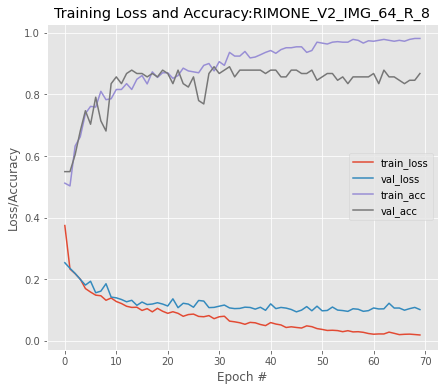

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,RIMONE_V2_IMG_64_R_8,0.89011,0.860465,0.902439,0.880952,0.89122,0.902439,0.88


Model:Dataset:RIMONE_V2, Image size:64*64, Routing Count:3
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:64 Width:64
Model: "model_40"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_48 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 56, 56, 256)         62464     
                                                                 
 primary_capsule_conv (Conv2  (32, 48, 48, 512)        10617344  
 D)                                                              
                                                                 
 primarycap_reshape (Reshape  (32, 73728, 16)          0         
 )                          

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy improved from 0.54945 to 0.61538, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.61538 to 0.67033, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.67033 to 0.72527, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.72527

Epoch 7: val_accuracy improved from 0.72527 to 0.79121, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.79121

Epoch 9: val_accuracy did not improve from 0.79121

Epoch 10: val_accuracy improved from 0.79121 to 0.86813, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.86813

Epoch 12: val_accuracy did not improve from 0.86813

Epoch 13: val_accuracy did not improve from 0.86813

Epoch 14: val_accuracy did not improve from 0.86813

Epoch 15: val_accuracy 

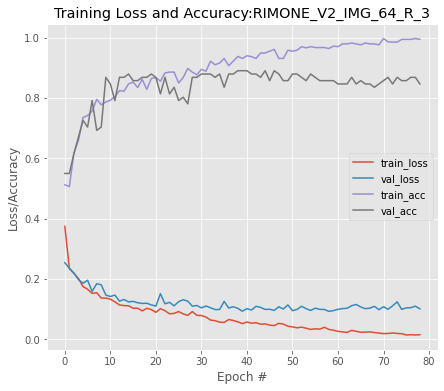

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,RIMONE_V2_IMG_64_R_3,0.89011,0.897436,0.853659,0.875,0.886829,0.853659,0.92


Model:Dataset:RIMONE_V2, Image size:64*64, Routing Count:1
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:64 Width:64
Model: "model_41"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_49 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 56, 56, 256)         62464     
                                                                 
 primary_capsule_conv (Conv2  (32, 48, 48, 512)        10617344  
 D)                                                              
                                                                 
 primarycap_reshape (Reshape  (32, 73728, 16)          0         
 )                          

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy improved from 0.54945 to 0.60440, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.60440 to 0.68132, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.68132 to 0.74725, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.74725

Epoch 7: val_accuracy improved from 0.74725 to 0.76923, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.76923

Epoch 9: val_accuracy did not improve from 0.76923

Epoch 10: val_accuracy improved from 0.76923 to 0.82418, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.82418 to 0.86813, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.86813

Epoch 13: val_accuracy did not improve from 0.86813

Epoch 14: val_accuracy did not impr

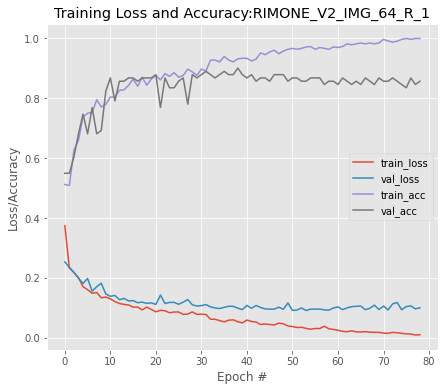

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,RIMONE_V2_IMG_64_R_1,0.901099,0.9,0.878049,0.888889,0.899024,0.878049,0.92


,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,RIMONE_V2_IMG_64_R_8,0.890110,0.860465,0.902439,0.880952,0.891220,0.902439,0.88
1,RIMONE_V2_IMG_64_R_3,0.890110,0.897436,0.853659,0.875000,0.886829,0.853659,0.92
2,RIMONE_V2_IMG_64_R_1,0.901099,0.900000,0.878049,0.888889,0.899024,0.878049,0.92


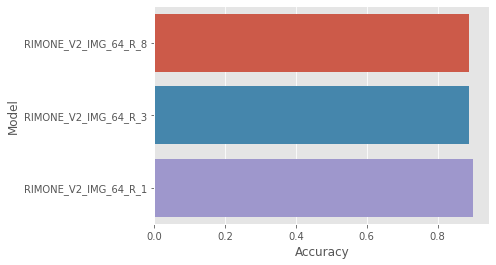

In [ ]:
call_model('RIMONE_V2')

**ACRIMA**

Model:Dataset:ACRIMA, Image size:64*64, Routing Count:8
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 56, 56, 256)         62464     
                                                                 
 primary_capsule_conv (Conv2  (32, 48, 48, 512)        10617344  
 D)                                                              
                                                                 
 primarycap_reshape (Reshape  (32, 73728, 16)          0         
 )                                                   

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.58865 to 0.78723, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.78723 to 0.82979, saving model to ./result/weights.h5

Epoch 4: val_accuracy did not improve from 0.82979

Epoch 5: val_accuracy improved from 0.82979 to 0.85816, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.85816 to 0.87943, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.87943 to 0.90071, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.90071

Epoch 9: val_accuracy did not improve from 0.90071

Epoch 10: val_accuracy improved from 0.90071 to 0.92199, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.92199

Epoch 12: val_accuracy improved from 0.92199 to 0.93617, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.9

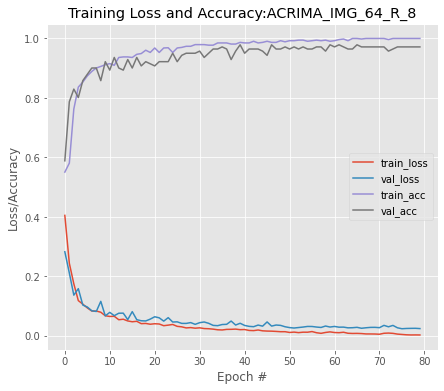

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,ACRIMA_IMG_64_R_8,0.978723,0.966102,0.982759,0.974359,0.979331,0.982759,0.975904


Model:Dataset:ACRIMA, Image size:64*64, Routing Count:3
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 56, 56, 256)         62464     
                                                                 
 primary_capsule_conv (Conv2  (32, 48, 48, 512)        10617344  
 D)                                                              
                                                                 
 primarycap_reshape (Reshape  (32, 73728, 16)          0         
 )                                                 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.58865 to 0.78723, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.78723

Epoch 4: val_accuracy did not improve from 0.78723

Epoch 5: val_accuracy improved from 0.78723 to 0.86525, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.86525

Epoch 7: val_accuracy improved from 0.86525 to 0.90071, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.90071

Epoch 9: val_accuracy did not improve from 0.90071

Epoch 10: val_accuracy improved from 0.90071 to 0.92908, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.92908

Epoch 12: val_accuracy did not improve from 0.92908

Epoch 13: val_accuracy did not improve from 0.92908

Epoch 14: val_accuracy did not improve from 0.92908

Epoch 15: val_accuracy did not improve from 0.92908

Epoch 16: v

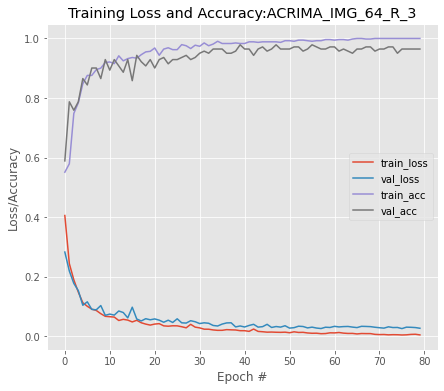

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,ACRIMA_IMG_64_R_3,0.978723,0.95082,1.0,0.97479,0.981928,1.0,0.963855


Model:Dataset:ACRIMA, Image size:64*64, Routing Count:1
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 56, 56, 256)         62464     
                                                                 
 primary_capsule_conv (Conv2  (32, 48, 48, 512)        10617344  
 D)                                                              
                                                                 
 primarycap_reshape (Reshape  (32, 73728, 16)          0         
 )                                                 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.58865 to 0.76596, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.76596 to 0.78723, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.78723 to 0.79433, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.79433 to 0.83688, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.83688 to 0.85106, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.85106 to 0.89362, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.89362

Epoch 9: val_accuracy did not improve from 0.89362

Epoch 10: val_accuracy did not improve from 0.89362

Epoch 11: val_accuracy did not improve from 0.89362

Epoch 12: val_accuracy improved from 0.89362 to 0.90780, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.9

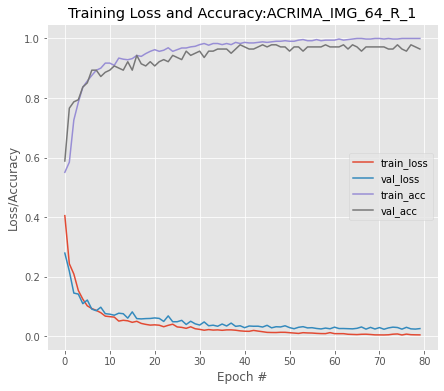

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,ACRIMA_IMG_64_R_1,0.978723,0.966102,0.982759,0.974359,0.979331,0.982759,0.975904


,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,ACRIMA_IMG_64_R_8,0.978723,0.966102,0.982759,0.974359,0.979331,0.982759,0.975904
1,ACRIMA_IMG_64_R_3,0.978723,0.950820,1.000000,0.974790,0.981928,1.000000,0.963855
2,ACRIMA_IMG_64_R_1,0.978723,0.966102,0.982759,0.974359,0.979331,0.982759,0.975904


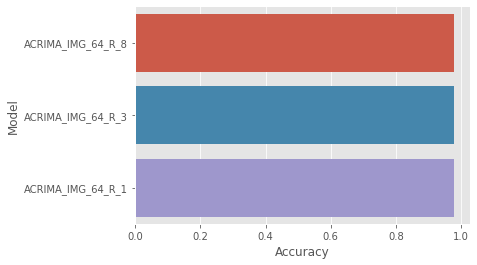

In [ ]:
call_model('ACRIMA')

**RIMONE DL**

Model:Dataset:RIMONE_DL, Image size:64*64, Routing Count:8
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 56, 56, 256)         62464     
                                                                 
 primary_capsule_conv (Conv2  (32, 48, 48, 512)        10617344  
 D)                                                              
                                                                 
 primarycap_reshape (Reshape  (32, 73728, 16)          0         
 )                                              

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy improved from 0.64384 to 0.65068, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.65068 to 0.71918, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.71918 to 0.73288, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.73288 to 0.77397, saving model to ./result/weights.h5

Epoch 8: val_accuracy improved from 0.77397 to 0.80822, saving model to ./result/weights.h5

Epoch 9: val_accuracy did not improve from 0.80822

Epoch 10: val_accuracy did not improve from 0.80822

Epoch 11: val_accuracy improved from 0.80822 to 0.89726, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.89726

Epoch 13: val_accuracy did not improve from 0.89726

Epoch 14: val_accuracy did not impr

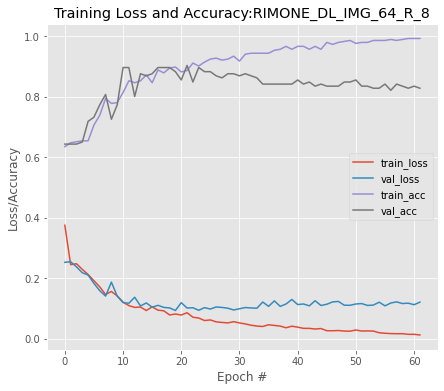

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,RIMONE_DL_IMG_64_R_8,0.90411,0.9,0.957447,0.927835,0.88257,0.957447,0.807692


Model:Dataset:RIMONE_DL, Image size:64*64, Routing Count:3
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 56, 56, 256)         62464     
                                                                 
 primary_capsule_conv (Conv2  (32, 48, 48, 512)        10617344  
 D)                                                              
                                                                 
 primarycap_reshape (Reshape  (32, 73728, 16)          0         
 )                                              

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy improved from 0.64384 to 0.65068, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.65068 to 0.67808, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.67808

Epoch 7: val_accuracy improved from 0.67808 to 0.77397, saving model to ./result/weights.h5

Epoch 8: val_accuracy improved from 0.77397 to 0.85616, saving model to ./result/weights.h5

Epoch 9: val_accuracy improved from 0.85616 to 0.86986, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.86986

Epoch 11: val_accuracy improved from 0.86986 to 0.88356, saving model to ./result/weights.h5

Epoch 12: val_accuracy improved from 0.88356 to 0.90411, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.9

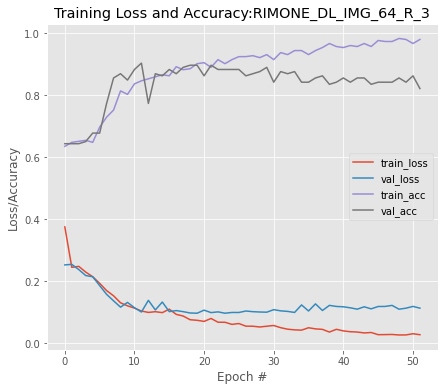

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,RIMONE_DL_IMG_64_R_3,0.90411,0.9,0.957447,0.927835,0.88257,0.957447,0.807692


Model:Dataset:RIMONE_DL, Image size:64*64, Routing Count:1
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 56, 56, 256)         62464     
                                                                 
 primary_capsule_conv (Conv2  (32, 48, 48, 512)        10617344  
 D)                                                              
                                                                 
 primarycap_reshape (Reshape  (32, 73728, 16)          0         
 )                                              

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy improved from 0.64384 to 0.65068, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.65068 to 0.67123, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.67123 to 0.67808, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.67808 to 0.78082, saving model to ./result/weights.h5

Epoch 8: val_accuracy improved from 0.78082 to 0.85616, saving model to ./result/weights.h5

Epoch 9: val_accuracy improved from 0.85616 to 0.86986, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.86986

Epoch 11: val_accuracy improved from 0.86986 to 0.87671, saving model to ./result/weights.h5

Epoch 12: val_accuracy improved from 0.87671 to 0.91781, saving model to ./result/weights.h5

Epoch 

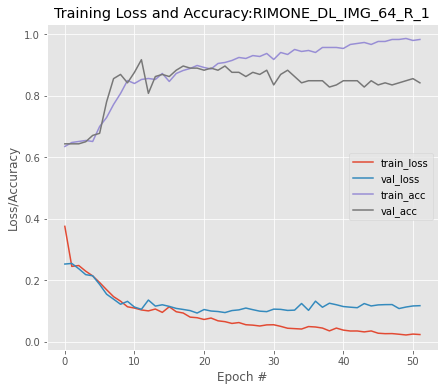

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,RIMONE_DL_IMG_64_R_1,0.917808,0.901961,0.978723,0.938776,0.893208,0.978723,0.807692


,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,RIMONE_DL_IMG_64_R_8,0.904110,0.900000,0.957447,0.927835,0.882570,0.957447,0.807692
1,RIMONE_DL_IMG_64_R_3,0.904110,0.900000,0.957447,0.927835,0.882570,0.957447,0.807692
2,RIMONE_DL_IMG_64_R_1,0.917808,0.901961,0.978723,0.938776,0.893208,0.978723,0.807692


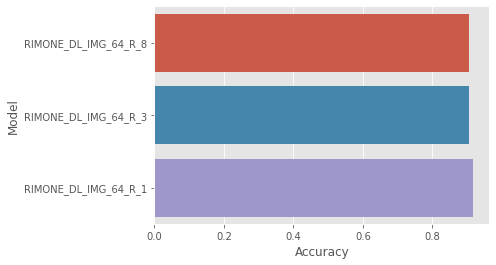

In [ ]:
call_model('RIMONE_DL')

# Transfer Learning

**RIMONE V2**

Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:224 Width:224
Building CapsNet on top of vgg16
58900480/58889256 [==============================] - 0s 0us/step
Adding capsule layer on vgg16 
Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                       

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.51648, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.51648 to 0.65934, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.65934 to 0.71429, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.71429 to 0.84615, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.84615

Epoch 6: val_accuracy did not improve from 0.84615

Epoch 7: val_accuracy did not improve from 0.84615

Epoch 8: val_accuracy improved from 0.84615 to 0.87912, saving model to ./result/weights.h5

Epoch 9: val_accuracy improved from 0.87912 to 0.90110, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.90110

Epoch 11: val_accuracy did not improve from 0.90110

Epoch 12: val_accuracy did not improve from 0.90110

Epoch 13: val_accuracy did not improve from 0.90110

Epoch 14: val_accuracy did not improve from 0.90110

Epoch 15: val_accuracy 

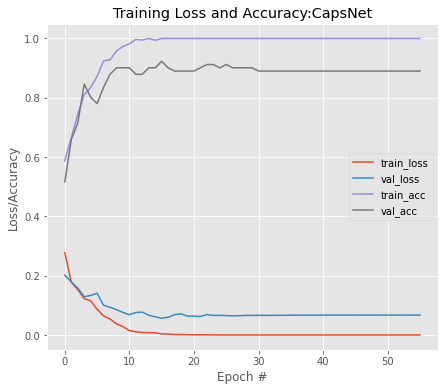

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.923077,0.904762,0.926829,0.915663,0.923415,0.926829,0.92


Building CapsNet on top of vgg19
80150528/80134624 [==============================] - 1s 0us/step
Adding capsule layer on vgg19 
Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (32, 112, 112, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (32, 112, 112, 128)       147584 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.63736, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.63736 to 0.69231, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.69231

Epoch 4: val_accuracy improved from 0.69231 to 0.70330, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.70330 to 0.78022, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.78022

Epoch 7: val_accuracy did not improve from 0.78022

Epoch 8: val_accuracy did not improve from 0.78022

Epoch 9: val_accuracy improved from 0.78022 to 0.82418, saving model to ./result/weights.h5

Epoch 10: val_accuracy improved from 0.82418 to 0.86813, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.86813

Epoch 12: val_accuracy did not improve from 0.86813

Epoch 13: val_accuracy improved from 0.86813 to 0.87912, saving model to ./result/weights.h5

Epoch 14: val_accuracy did not impr

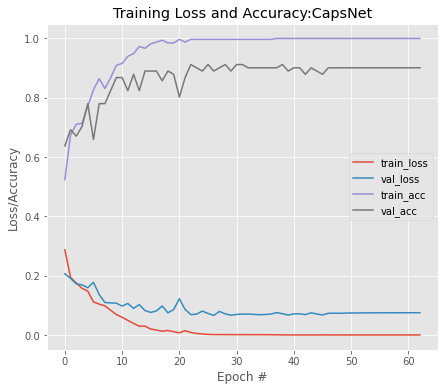

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg19,0.912088,0.923077,0.878049,0.9,0.909024,0.878049,0.94


Building CapsNet on top of resnet50
94781440/94765736 [==============================] - 1s 0us/step
Adding capsule layer on resnet50 
Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (32, 230, 230, 3)    0           ['input_9[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (32, 112, 112, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (32, 112, 112, 64)   256

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy did not improve from 0.54945

Epoch 5: val_accuracy did not improve from 0.54945

Epoch 6: val_accuracy did not improve from 0.54945

Epoch 7: val_accuracy did not improve from 0.54945

Epoch 8: val_accuracy did not improve from 0.54945

Epoch 9: val_accuracy did not improve from 0.54945

Epoch 10: val_accuracy did not improve from 0.54945

Epoch 11: val_accuracy did not improve from 0.54945

Epoch 12: val_accuracy did not improve from 0.54945

Epoch 13: val_accuracy did not improve from 0.54945

Epoch 14: val_accuracy did not improve from 0.54945

Epoch 15: val_accuracy did not improve from 0.54945

Epoch 16: val_accuracy did not improve from 0.54945

Epoch 17: val_accuracy did not improve from 0.54945

Epoch 18: val_accuracy did not improve from 0.54945

Epoch 19: val_ac

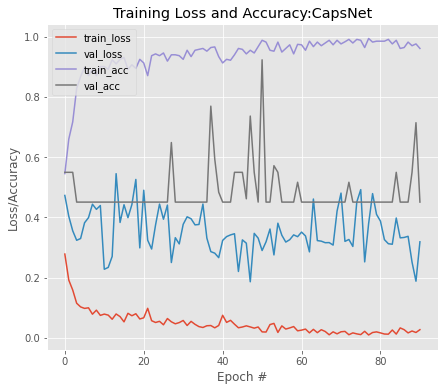

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,resnet50,0.923077,0.904762,0.926829,0.915663,0.923415,0.926829,0.92


Building CapsNet on top of densenet121
29097984/29084464 [==============================] - 0s 0us/step
Adding capsule layer on densenet121 
Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (32, 230, 230, 3)   0           ['input_10[0][0]']               
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d[0][0]']         
                                                                                                  
 conv1/bn (BatchNormalization)  (32, 112, 112, 64)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.58242, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.58242 to 0.67033, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.67033 to 0.73626, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.73626 to 0.80220, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.80220

Epoch 7: val_accuracy did not improve from 0.80220

Epoch 8: val_accuracy did not improve from 0.80220

Epoch 9: val_accuracy did not improve from 0.80220

Epoch 10: val_accuracy did not improve from 0.80220

Epoch 11: val_accuracy improved from 0.80220 to 0.81319, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.81319

Epoch 13: val_accuracy improved from 0.81319 to 0.85714, saving model to ./result/weights.h5

Epoch 14: val_accuracy did not impr

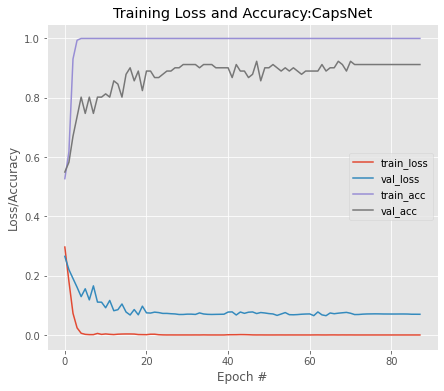

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet121,0.923077,0.947368,0.878049,0.911392,0.919024,0.878049,0.96


Building CapsNet on top of densenet169
51888128/51877672 [==============================] - 0s 0us/step
Adding capsule layer on densenet169 
Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (32, 230, 230, 3)   0           ['input_11[0][0]']               
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d_2[0][0]']       
                                                 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.63736, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.63736

Epoch 4: val_accuracy improved from 0.63736 to 0.68132, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.68132 to 0.71429, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.71429

Epoch 7: val_accuracy improved from 0.71429 to 0.81319, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.81319

Epoch 9: val_accuracy did not improve from 0.81319

Epoch 10: val_accuracy did not improve from 0.81319

Epoch 11: val_accuracy improved from 0.81319 to 0.87912, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.87912

Epoch 13: val_accuracy did not improve from 0.87912

Epoch 14: val_accuracy improved from 0.87912 to 0.89011, saving model to ./r

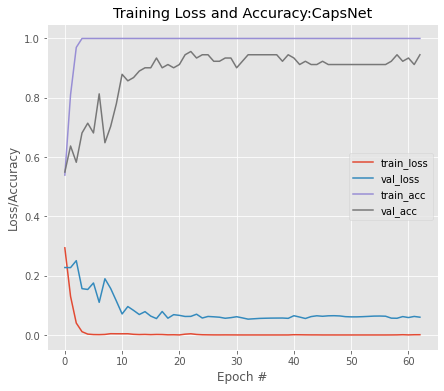

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet169,0.956044,0.95122,0.95122,0.95122,0.95561,0.95122,0.96


Building CapsNet on top of InceptionV3
87924736/87910968 [==============================] - 1s 0us/step
Adding capsule layer on InceptionV3 
Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_12 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (32, 111, 111, 32)   864         ['input_12[0][0]']               
                                                                                                  
 batch_normalization (BatchNorm  (32, 111, 111, 32)  96          ['conv2d[0][0]']                 
 alization)                                                                                       
                                                 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.56044, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.56044 to 0.57143, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.57143 to 0.62637, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.62637 to 0.63736, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.63736 to 0.64835, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.64835 to 0.72527, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.72527

Epoch 9: val_accuracy improved from 0.72527 to 0.79121, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.79121

Epoch 11: val_accuracy did not improve from 0.79121

Epoch 12: val_accuracy did not improve from 0.79121

Epoch 13: val_accuracy did not improve from 0.7

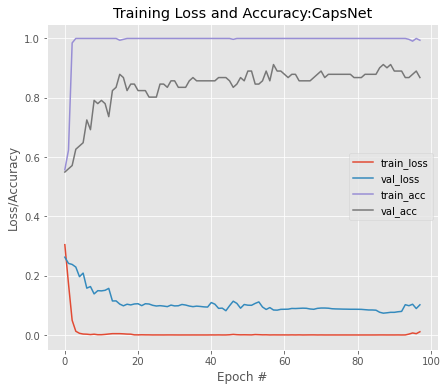

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,InceptionV3,0.912088,0.883721,0.926829,0.904762,0.913415,0.926829,0.9


Building CapsNet on top of MobileNet
17235968/17225924 [==============================] - 0s 0us/step
Adding capsule layer on MobileNet 
Model: "model_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_13 (InputLayer)       [(32, 224, 224, 3)]       0         
                                                                 
 conv1 (Conv2D)              (32, 112, 112, 32)        864       
                                                                 
 conv1_bn (BatchNormalizatio  (32, 112, 112, 32)       128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (32, 112, 112, 32)        0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (32, 112, 112, 32)       288       
                                                     

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.79121, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.79121

Epoch 4: val_accuracy did not improve from 0.79121

Epoch 5: val_accuracy did not improve from 0.79121

Epoch 6: val_accuracy did not improve from 0.79121

Epoch 7: val_accuracy did not improve from 0.79121

Epoch 8: val_accuracy did not improve from 0.79121

Epoch 9: val_accuracy improved from 0.79121 to 0.82418, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.82418

Epoch 11: val_accuracy improved from 0.82418 to 0.83516, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.83516

Epoch 13: val_accuracy improved from 0.83516 to 0.84615, saving model to ./result/weights.h5

Epoch 14: val_accuracy did not improve from 0.84615

Epoch 15: val_accuracy did not improve from 0.84615

Epoch 16: v

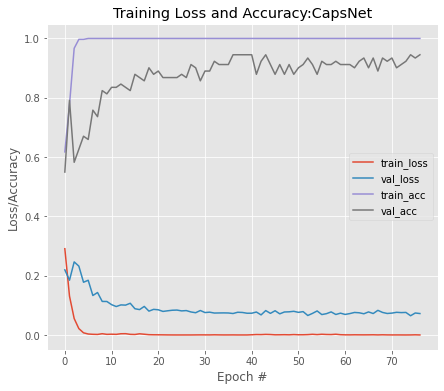

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,MobileNet,0.945055,0.95,0.926829,0.938272,0.943415,0.926829,0.96


,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.923077,0.904762,0.926829,0.915663,0.923415,0.926829,0.92
1,vgg19,0.912088,0.923077,0.878049,0.900000,0.909024,0.878049,0.94
2,resnet50,0.923077,0.904762,0.926829,0.915663,0.923415,0.926829,0.92
3,densenet121,0.923077,0.947368,0.878049,0.911392,0.919024,0.878049,0.96
4,densenet169,0.956044,0.951220,0.951220,0.951220,0.955610,0.951220,0.96
5,InceptionV3,0.912088,0.883721,0.926829,0.904762,0.913415,0.926829,0.90
6,MobileNet,0.945055,0.950000,0.926829,0.938272,0.943415,0.926829,0.96


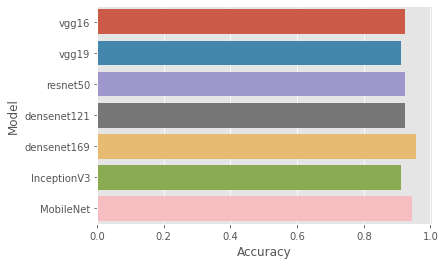

In [ ]:
rim_one_v2_trsfer_lr()

**RIMONE DL**

Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Building CapsNet on top of vgg16
Adding capsule layer on vgg16 
Model: "model_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(32, 224, 64, 3)]        0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 64, 64)         1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 64, 64)         36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 32, 64)         0         
                                                                 
 block2_conv1 (Conv2D)       (32, 112, 32,

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy did not improve from 0.64384

Epoch 5: val_accuracy improved from 0.64384 to 0.71918, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.71918

Epoch 7: val_accuracy improved from 0.71918 to 0.76712, saving model to ./result/weights.h5

Epoch 8: val_accuracy improved from 0.76712 to 0.79452, saving model to ./result/weights.h5

Epoch 9: val_accuracy did not improve from 0.79452

Epoch 10: val_accuracy improved from 0.79452 to 0.80137, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.80137 to 0.84247, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.84247

Epoch 13: val_accuracy did not improve from 0.84247

Epoch 14: val_accuracy did not improve from 0.84247

Epoch 15: val_accuracy 

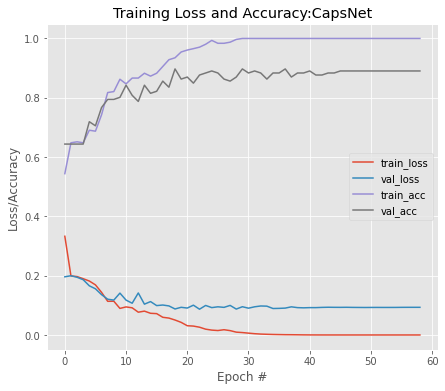

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.89726,0.915789,0.925532,0.920635,0.885843,0.925532,0.846154


Building CapsNet on top of vgg19
Adding capsule layer on vgg19 
Model: "model_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_15 (InputLayer)       [(32, 224, 64, 3)]        0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 64, 64)         1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 64, 64)         36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 32, 64)         0         
                                                                 
 block2_conv1 (Conv2D)       (32, 112, 32, 128)        73856     
                                                                 
 block2_conv2 (Conv2D)       (32, 112, 32, 128)        147584    
                                                            

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy improved from 0.64384 to 0.65068, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.65068 to 0.67808, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.67808 to 0.78767, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.78767 to 0.80137, saving model to ./result/weights.h5

Epoch 8: val_accuracy improved from 0.80137 to 0.80822, saving model to ./result/weights.h5

Epoch 9: val_accuracy did not improve from 0.80822

Epoch 10: val_accuracy improved from 0.80822 to 0.83562, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.83562

Epoch 12: val_accuracy did not improve from 0.83562

Epoch 13: val_accuracy did not improve from 0.83562

Epoch 14: val_accuracy did not impr

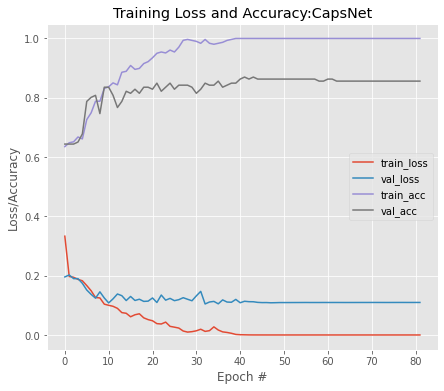

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg19,0.869863,0.864078,0.946809,0.903553,0.838789,0.946809,0.730769


Building CapsNet on top of resnet50
Adding capsule layer on resnet50 
Model: "model_15"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_16 (InputLayer)          [(32, 224, 64, 3)]   0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (32, 230, 70, 3)     0           ['input_16[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (32, 112, 32, 64)    9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (32, 112, 32, 64)    256         ['conv1_conv[0][0]']             
                     

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy did not improve from 0.64384

Epoch 5: val_accuracy did not improve from 0.64384

Epoch 6: val_accuracy did not improve from 0.64384

Epoch 7: val_accuracy did not improve from 0.64384

Epoch 8: val_accuracy did not improve from 0.64384

Epoch 9: val_accuracy did not improve from 0.64384

Epoch 10: val_accuracy did not improve from 0.64384

Epoch 11: val_accuracy did not improve from 0.64384

Epoch 12: val_accuracy did not improve from 0.64384

Epoch 13: val_accuracy did not improve from 0.64384

Epoch 14: val_accuracy did not improve from 0.64384

Epoch 15: val_accuracy improved from 0.64384 to 0.73288, saving model to ./result/weights.h5

Epoch 16: val_accuracy did not improve from 0.73288

Epoch 17: val_accuracy did not improve from 0.73288

Epoch 18: val_accuracy impro

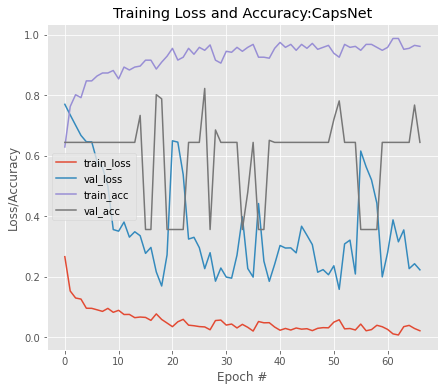

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,resnet50,0.821918,0.877778,0.840426,0.858696,0.814444,0.840426,0.788462


Building CapsNet on top of densenet121
Adding capsule layer on densenet121 
Model: "model_16"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_17 (InputLayer)          [(32, 224, 64, 3)]   0           []                               
                                                                                                  
 zero_padding2d_4 (ZeroPadding2  (32, 230, 70, 3)    0           ['input_17[0][0]']               
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 32, 64)    9408        ['zero_padding2d_4[0][0]']       
                                                                                                  
 conv1/bn (Batc

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy improved from 0.64384 to 0.67808, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.67808 to 0.73973, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.73973

Epoch 7: val_accuracy did not improve from 0.73973

Epoch 8: val_accuracy did not improve from 0.73973

Epoch 9: val_accuracy did not improve from 0.73973

Epoch 10: val_accuracy improved from 0.73973 to 0.74658, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.74658 to 0.77397, saving model to ./result/weights.h5

Epoch 12: val_accuracy improved from 0.77397 to 0.79452, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.79452

Epoch 14: val_accuracy did not improve from 0.79452

Epoch 15: val_accuracy 

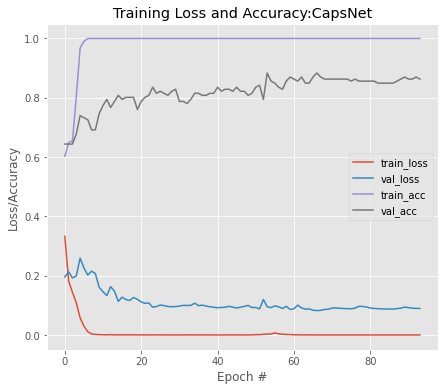

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet121,0.883562,0.942529,0.87234,0.906077,0.888093,0.87234,0.903846


Building CapsNet on top of densenet169
Adding capsule layer on densenet169 
Model: "model_17"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_18 (InputLayer)          [(32, 224, 64, 3)]   0           []                               
                                                                                                  
 zero_padding2d_6 (ZeroPadding2  (32, 230, 70, 3)    0           ['input_18[0][0]']               
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 32, 64)    9408        ['zero_padding2d_6[0][0]']       
                                                                                                  
 conv1/bn (Batc

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy improved from 0.64384 to 0.78767, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.78767 to 0.81507, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.81507

Epoch 7: val_accuracy did not improve from 0.81507

Epoch 8: val_accuracy improved from 0.81507 to 0.82877, saving model to ./result/weights.h5

Epoch 9: val_accuracy did not improve from 0.82877

Epoch 10: val_accuracy did not improve from 0.82877

Epoch 11: val_accuracy did not improve from 0.82877

Epoch 12: val_accuracy did not improve from 0.82877

Epoch 13: val_accuracy improved from 0.82877 to 0.84932, saving model to ./result/weights.h5

Epoch 14: val_accuracy did not improve from 0.84932

Epoch 15: val_accuracy did not improve from 0.84932

Epoch 16: v

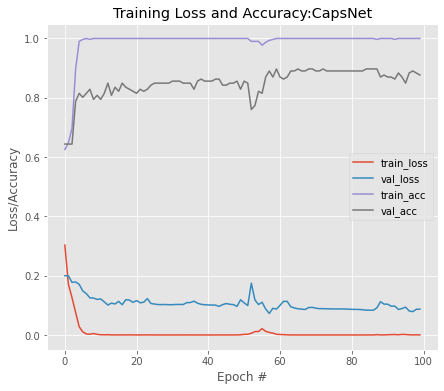

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet169,0.89726,0.869159,0.989362,0.925373,0.860065,0.989362,0.730769


Building CapsNet on top of MobileNet
Adding capsule layer on MobileNet 
Model: "model_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_19 (InputLayer)       [(32, 224, 64, 3)]        0         
                                                                 
 conv1 (Conv2D)              (32, 112, 32, 32)         864       
                                                                 
 conv1_bn (BatchNormalizatio  (32, 112, 32, 32)        128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (32, 112, 32, 32)         0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (32, 112, 32, 32)        288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (32, 112, 32, 32)     

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.62329, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.62329 to 0.64384, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy improved from 0.64384 to 0.67123, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.67123

Epoch 6: val_accuracy did not improve from 0.67123

Epoch 7: val_accuracy did not improve from 0.67123

Epoch 8: val_accuracy did not improve from 0.67123

Epoch 9: val_accuracy did not improve from 0.67123

Epoch 10: val_accuracy did not improve from 0.67123

Epoch 11: val_accuracy did not improve from 0.67123

Epoch 12: val_accuracy did not improve from 0.67123

Epoch 13: val_accuracy did not improve from 0.67123

Epoch 14: val_accuracy did not improve from 0.67123

Epoch 15: val_accuracy did not improve from 0.67123

Epoch 16: val_accuracy did not improve from 0.67123

Epoch 17: val_accuracy did not improve f

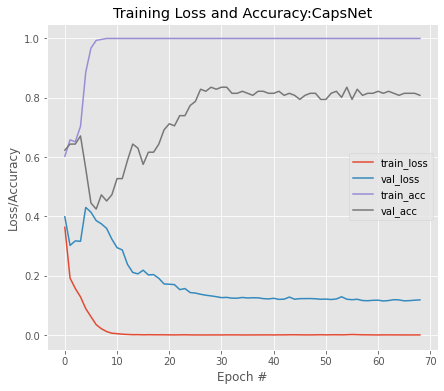

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,MobileNet,0.835616,0.87234,0.87234,0.87234,0.820786,0.87234,0.769231


,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.897260,0.915789,0.925532,0.920635,0.885843,0.925532,0.846154
1,vgg19,0.869863,0.864078,0.946809,0.903553,0.838789,0.946809,0.730769
2,resnet50,0.821918,0.877778,0.840426,0.858696,0.814444,0.840426,0.788462
3,densenet121,0.883562,0.942529,0.872340,0.906077,0.888093,0.872340,0.903846
4,densenet169,0.897260,0.869159,0.989362,0.925373,0.860065,0.989362,0.730769
5,MobileNet,0.835616,0.872340,0.872340,0.872340,0.820786,0.872340,0.769231


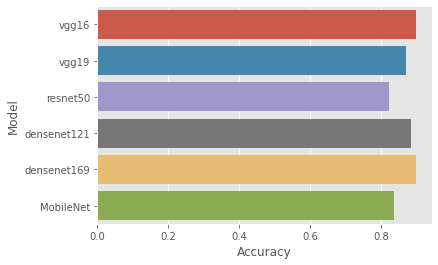

In [ ]:
rim_one_dl_trsfer_lr()

**ACRIMA**

Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:224 Width:224
Building CapsNet on top of vgg16
Adding capsule layer on vgg16 
Model: "model_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_20 (InputLayer)       [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                                                                 
 block2_conv1 (Conv2D

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.89362, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.89362

Epoch 3: val_accuracy improved from 0.89362 to 0.92199, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.92199 to 0.93617, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.93617 to 0.94326, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.94326

Epoch 7: val_accuracy did not improve from 0.94326

Epoch 8: val_accuracy did not improve from 0.94326

Epoch 9: val_accuracy did not improve from 0.94326

Epoch 10: val_accuracy did not improve from 0.94326

Epoch 11: val_accuracy did not improve from 0.94326

Epoch 12: val_accuracy improved from 0.94326 to 0.95745, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.95745

Epoch 14: val_accuracy did not improve from 0.95745

Epoch 15: val_accuracy did not improve from 0.95745

Epoch 16: v

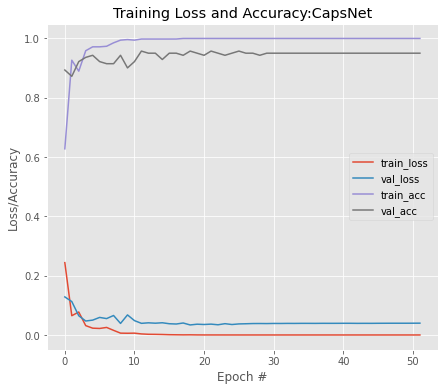

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.957447,0.919355,0.982759,0.95,0.961259,0.982759,0.939759


Building CapsNet on top of vgg19
Adding capsule layer on vgg19 
Model: "model_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_21 (InputLayer)       [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (32, 112, 112, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (32, 112, 112, 128)       147584    
                                                            

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.84397, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.84397

Epoch 3: val_accuracy improved from 0.84397 to 0.87234, saving model to ./result/weights.h5

Epoch 4: val_accuracy did not improve from 0.87234

Epoch 5: val_accuracy improved from 0.87234 to 0.89362, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.89362 to 0.90780, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.90780 to 0.93617, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.93617

Epoch 9: val_accuracy did not improve from 0.93617

Epoch 10: val_accuracy did not improve from 0.93617

Epoch 11: val_accuracy did not improve from 0.93617

Epoch 12: val_accuracy did not improve from 0.93617

Epoch 13: val_accuracy did not improve from 0.93617

Epoch 14: val_accuracy improved from 0.93617 to 0.94326, saving model to ./result/weights.h5

Epoch 15: val_accuracy 

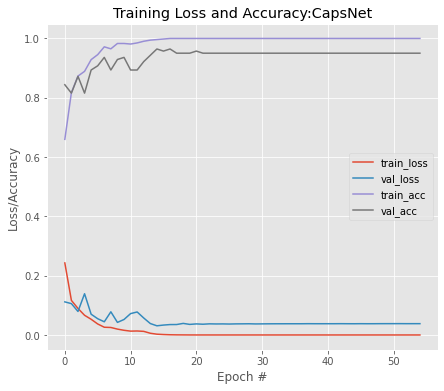

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg19,0.964539,0.949153,0.965517,0.957265,0.964686,0.965517,0.963855


Building CapsNet on top of resnet50
Adding capsule layer on resnet50 
Model: "model_21"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_22 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (32, 230, 230, 3)    0           ['input_22[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (32, 112, 112, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (32, 112, 112, 64)   256         ['conv1_conv[0][0]']             
                     

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.58865

Epoch 3: val_accuracy did not improve from 0.58865

Epoch 4: val_accuracy did not improve from 0.58865

Epoch 5: val_accuracy did not improve from 0.58865

Epoch 6: val_accuracy did not improve from 0.58865

Epoch 7: val_accuracy did not improve from 0.58865

Epoch 8: val_accuracy did not improve from 0.58865

Epoch 9: val_accuracy did not improve from 0.58865

Epoch 10: val_accuracy did not improve from 0.58865

Epoch 11: val_accuracy did not improve from 0.58865

Epoch 12: val_accuracy did not improve from 0.58865

Epoch 13: val_accuracy did not improve from 0.58865

Epoch 14: val_accuracy did not improve from 0.58865

Epoch 15: val_accuracy did not improve from 0.58865

Epoch 16: val_accuracy did not improve from 0.58865

Epoch 17: val_accuracy improved from 0.58865 to 0.60284, saving model to ./result/weights.h5

Epoch 18: val_accuracy did n

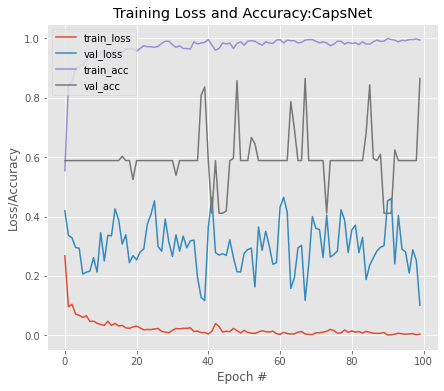

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,resnet50,0.865248,0.854545,0.810345,0.831858,0.85698,0.810345,0.903614


Building CapsNet on top of densenet121
Adding capsule layer on densenet121 
Model: "model_22"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_23 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d_8 (ZeroPadding2  (32, 230, 230, 3)   0           ['input_23[0][0]']               
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d_8[0][0]']       
                                                                                                  
 conv1/bn (Batc

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.58865 to 0.92199, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.92199 to 0.93617, saving model to ./result/weights.h5

Epoch 4: val_accuracy did not improve from 0.93617

Epoch 5: val_accuracy improved from 0.93617 to 0.95035, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.95035

Epoch 7: val_accuracy did not improve from 0.95035

Epoch 8: val_accuracy did not improve from 0.95035

Epoch 9: val_accuracy did not improve from 0.95035

Epoch 10: val_accuracy did not improve from 0.95035

Epoch 11: val_accuracy did not improve from 0.95035

Epoch 12: val_accuracy did not improve from 0.95035

Epoch 13: val_accuracy did not improve from 0.95035

Epoch 14: val_accuracy did not improve from 0.95035

Epoch 15: val_accuracy did not improve from 0.95035

Epoch 16: val_accuracy did not improve from 0.95035


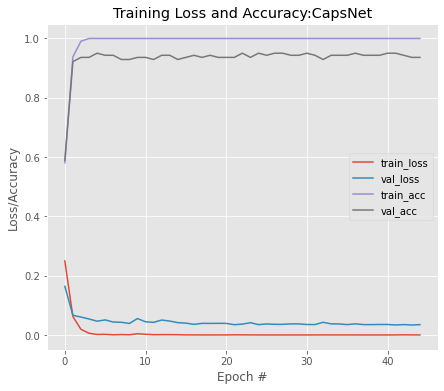

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet121,0.950355,0.932203,0.948276,0.940171,0.950042,0.948276,0.951807


Building CapsNet on top of densenet169
Adding capsule layer on densenet169 
Model: "model_23"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_24 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d_10 (ZeroPadding  (32, 230, 230, 3)   0           ['input_24[0][0]']               
 2D)                                                                                              
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d_10[0][0]']      
                                                                                                  
 conv1/bn (Batc

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.88652, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.88652 to 0.95035, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.95035 to 0.95745, saving model to ./result/weights.h5

Epoch 4: val_accuracy did not improve from 0.95745

Epoch 5: val_accuracy did not improve from 0.95745

Epoch 6: val_accuracy did not improve from 0.95745

Epoch 7: val_accuracy did not improve from 0.95745

Epoch 8: val_accuracy did not improve from 0.95745

Epoch 9: val_accuracy did not improve from 0.95745

Epoch 10: val_accuracy did not improve from 0.95745

Epoch 11: val_accuracy did not improve from 0.95745

Epoch 12: val_accuracy did not improve from 0.95745

Epoch 13: val_accuracy did not improve from 0.95745

Epoch 14: val_accuracy did not improve from 0.95745

Epoch 15: val_accuracy did not improve from 0.95745

Epoch 16: val_accuracy did not improve from 0.95745

Epoch 17: val_accuracy did not improve f

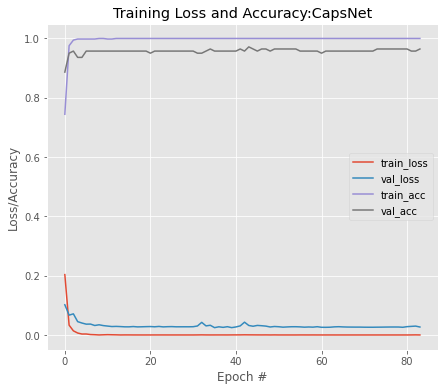

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet169,0.971631,0.935484,1.0,0.966667,0.975904,1.0,0.951807


Building CapsNet on top of MobileNet
Adding capsule layer on MobileNet 
Model: "model_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_25 (InputLayer)       [(32, 224, 224, 3)]       0         
                                                                 
 conv1 (Conv2D)              (32, 112, 112, 32)        864       
                                                                 
 conv1_bn (BatchNormalizatio  (32, 112, 112, 32)       128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (32, 112, 112, 32)        0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (32, 112, 112, 32)       288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (32, 112, 112, 32)    

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.58865 to 0.63830, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.63830 to 0.91489, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.91489 to 0.93617, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.93617

Epoch 6: val_accuracy did not improve from 0.93617

Epoch 7: val_accuracy improved from 0.93617 to 0.94326, saving model to ./result/weights.h5

Epoch 8: val_accuracy improved from 0.94326 to 0.95035, saving model to ./result/weights.h5

Epoch 9: val_accuracy did not improve from 0.95035

Epoch 10: val_accuracy did not improve from 0.95035

Epoch 11: val_accuracy improved from 0.95035 to 0.95745, saving model to ./result/weights.h5

Epoch 12: val_accuracy improved from 0.95745 to 0.96454, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.9

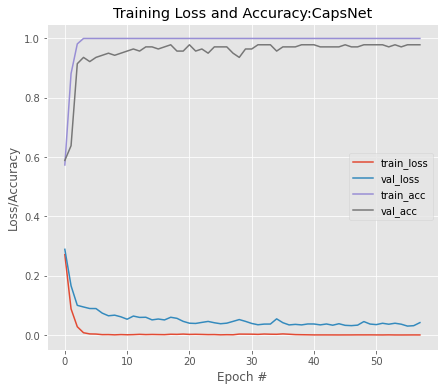

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,MobileNet,0.978723,0.966102,0.982759,0.974359,0.979331,0.982759,0.975904


,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.957447,0.919355,0.982759,0.950000,0.961259,0.982759,0.939759
1,vgg19,0.964539,0.949153,0.965517,0.957265,0.964686,0.965517,0.963855
2,resnet50,0.865248,0.854545,0.810345,0.831858,0.856980,0.810345,0.903614
3,densenet121,0.950355,0.932203,0.948276,0.940171,0.950042,0.948276,0.951807
4,densenet169,0.971631,0.935484,1.000000,0.966667,0.975904,1.000000,0.951807
5,MobileNet,0.978723,0.966102,0.982759,0.974359,0.979331,0.982759,0.975904


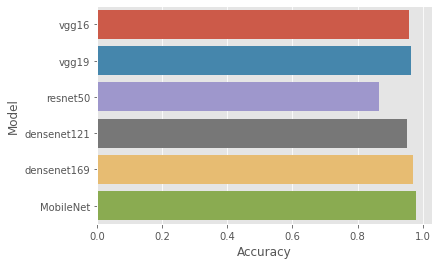

In [ ]:
acrima_trsfer_lr()

# Varying Filter size

**RIMONE V2**

Model:Dataset:RIMONE_V2, Image size:64*64, Routing Count:1
Model:Filters:[32, 64], Kernels:[7, 9], Strides:1
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:64 Width:64
Model: "model_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_30 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 58, 58, 32)          4736      
                                                                 
 conv1 (Conv2D)              (32, 25, 25, 64)          165952    
                                                                 
 primary_capsule_conv (Conv2  (32, 9, 9, 512)          2654720   
 D)                                         

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy improved from 0.54945 to 0.61538, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.61538

Epoch 6: val_accuracy did not improve from 0.61538

Epoch 7: val_accuracy improved from 0.61538 to 0.63736, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.63736

Epoch 9: val_accuracy did not improve from 0.63736

Epoch 10: val_accuracy improved from 0.63736 to 0.69231, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.69231 to 0.78022, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.78022

Epoch 13: val_accuracy did not improve from 0.78022

Epoch 14: val_accuracy did not improve from 0.78022

Epoch 15: val_accuracy did not improve from 0.78022

Epoch 16: v

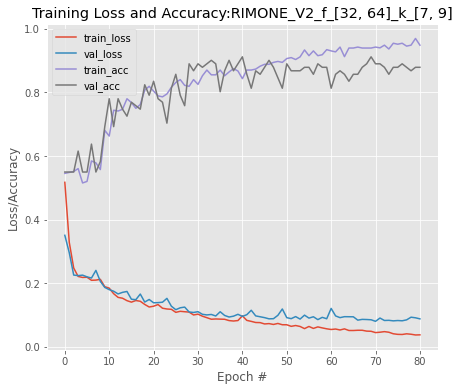

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,"RIMONE_V2_f_[32, 64]_k_[7, 9]",0.912088,0.883721,0.926829,0.904762,0.913415,0.926829,0.9


Model:Dataset:RIMONE_V2, Image size:64*64, Routing Count:1
Model:Filters:[32, 64], Kernels:[5, 7], Strides:1
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:64 Width:64
Model: "model_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_31 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 60, 60, 32)          2432      
                                                                 
 conv1 (Conv2D)              (32, 27, 27, 64)          100416    
                                                                 
 primary_capsule_conv (Conv2  (32, 11, 11, 512)        1606144   
 D)                                         

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy did not improve from 0.54945

Epoch 5: val_accuracy did not improve from 0.54945

Epoch 6: val_accuracy improved from 0.54945 to 0.58242, saving model to ./result/weights.h5

Epoch 7: val_accuracy did not improve from 0.58242

Epoch 8: val_accuracy did not improve from 0.58242

Epoch 9: val_accuracy improved from 0.58242 to 0.65934, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.65934

Epoch 11: val_accuracy improved from 0.65934 to 0.70330, saving model to ./result/weights.h5

Epoch 12: val_accuracy improved from 0.70330 to 0.75824, saving model to ./result/weights.h5

Epoch 13: val_accuracy improved from 0.75824 to 0.79121, saving model to ./result/weights.h5

Epoch 14: val_accuracy did not improve from 0.79121

Epoch 15: val_accuracy 

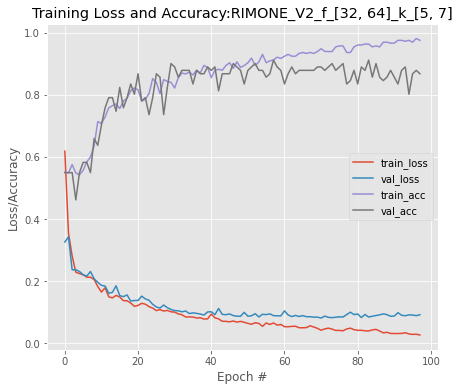

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,"RIMONE_V2_f_[32, 64]_k_[5, 7]",0.912088,0.866667,0.95122,0.906977,0.91561,0.95122,0.88


Model:Dataset:RIMONE_V2, Image size:64*64, Routing Count:1
Model:Filters:[32, 64, 128], Kernels:[5, 7, 9], Strides:1
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:64 Width:64
Model: "model_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_32 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 60, 60, 32)          2432      
                                                                 
 conv1 (Conv2D)              (32, 27, 27, 64)          100416    
                                                                 
 conv2 (Conv2D)              (32, 10, 10, 128)         663680    
                                    

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.45055, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.45055 to 0.54945, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy did not improve from 0.54945

Epoch 5: val_accuracy did not improve from 0.54945

Epoch 6: val_accuracy did not improve from 0.54945

Epoch 7: val_accuracy did not improve from 0.54945

Epoch 8: val_accuracy did not improve from 0.54945

Epoch 9: val_accuracy did not improve from 0.54945

Epoch 10: val_accuracy did not improve from 0.54945

Epoch 11: val_accuracy did not improve from 0.54945

Epoch 12: val_accuracy improved from 0.54945 to 0.56044, saving model to ./result/weights.h5

Epoch 13: val_accuracy improved from 0.56044 to 0.68132, saving model to ./result/weights.h5

Epoch 14: val_accuracy did not improve from 0.68132

Epoch 15: val_accuracy improved from 0.68132 to 0.69231, saving model to ./result/weights.h5

Epoch 16: v

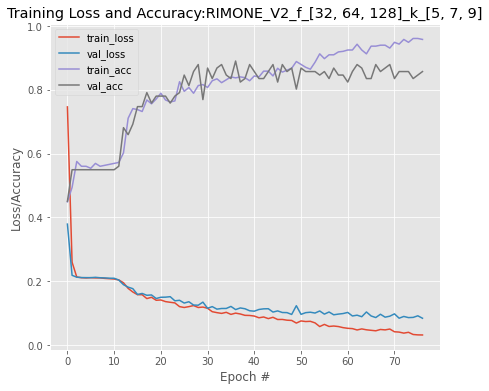

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,"RIMONE_V2_f_[32, 64, 128]_k_[5, 7, 9]",0.89011,0.860465,0.902439,0.880952,0.89122,0.902439,0.88


Model:Dataset:RIMONE_V2, Image size:64*64, Routing Count:1
Model:Filters:[128], Kernels:[7], Strides:1
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:64 Width:64
Model: "model_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_33 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 29, 29, 128)         18944     
                                                                 
 primary_capsule_conv (Conv2  (32, 12, 12, 512)        3211776   
 D)                                                              
                                                                 
 primarycap_reshape (Reshape  (32, 4608, 16)      

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy did not improve from 0.54945

Epoch 5: val_accuracy did not improve from 0.54945

Epoch 6: val_accuracy improved from 0.54945 to 0.57143, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.57143 to 0.58242, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.58242

Epoch 9: val_accuracy improved from 0.58242 to 0.67033, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.67033

Epoch 11: val_accuracy improved from 0.67033 to 0.70330, saving model to ./result/weights.h5

Epoch 12: val_accuracy improved from 0.70330 to 0.78022, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.78022

Epoch 14: val_accuracy did not improve from 0.78022

Epoch 15: val_accuracy 

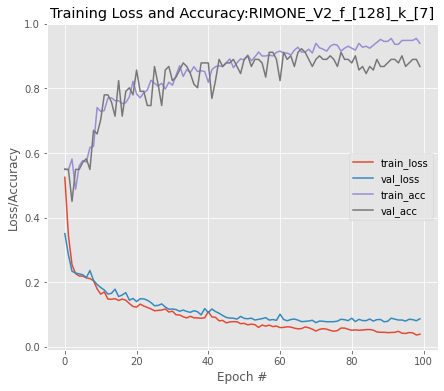

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,RIMONE_V2_f_[128]_k_[7],0.923077,0.886364,0.95122,0.917647,0.92561,0.95122,0.9


Model:Dataset:RIMONE_V2, Image size:64*64, Routing Count:1
Model:Filters:[128], Kernels:[5], Strides:1
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:64 Width:64
Model: "model_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_34 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 30, 30, 128)         9728      
                                                                 
 primary_capsule_conv (Conv2  (32, 13, 13, 512)        1638912   
 D)                                                              
                                                                 
 primarycap_reshape (Reshape  (32, 5408, 16)      

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy improved from 0.54945 to 0.60440, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.60440

Epoch 6: val_accuracy did not improve from 0.60440

Epoch 7: val_accuracy improved from 0.60440 to 0.65934, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.65934

Epoch 9: val_accuracy improved from 0.65934 to 0.68132, saving model to ./result/weights.h5

Epoch 10: val_accuracy improved from 0.68132 to 0.72527, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.72527 to 0.74725, saving model to ./result/weights.h5

Epoch 12: val_accuracy improved from 0.74725 to 0.78022, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.78022

Epoch 14: val_accuracy did not impr

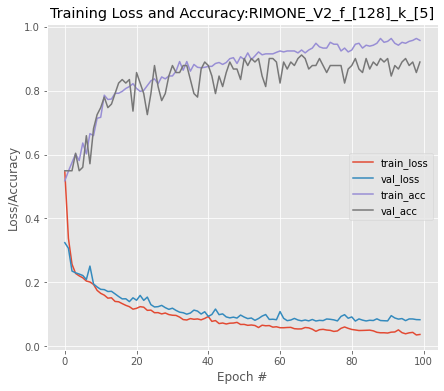

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,RIMONE_V2_f_[128]_k_[5],0.912088,0.883721,0.926829,0.904762,0.913415,0.926829,0.9


Model:Dataset:RIMONE_V2, Image size:64*64, Routing Count:1
Model:Filters:[64], Kernels:[7], Strides:1
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:64 Width:64
Model: "model_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_35 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 29, 29, 64)          9472      
                                                                 
 primary_capsule_conv (Conv2  (32, 12, 12, 512)        1606144   
 D)                                                              
                                                                 
 primarycap_reshape (Reshape  (32, 4608, 16)       

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy did not improve from 0.54945

Epoch 5: val_accuracy did not improve from 0.54945

Epoch 6: val_accuracy improved from 0.54945 to 0.57143, saving model to ./result/weights.h5

Epoch 7: val_accuracy did not improve from 0.57143

Epoch 8: val_accuracy improved from 0.57143 to 0.58242, saving model to ./result/weights.h5

Epoch 9: val_accuracy improved from 0.58242 to 0.63736, saving model to ./result/weights.h5

Epoch 10: val_accuracy improved from 0.63736 to 0.64835, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.64835 to 0.74725, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.74725

Epoch 13: val_accuracy improved from 0.74725 to 0.75824, saving model to ./result/weights.h5

Epoch 14: val_accuracy did not impr

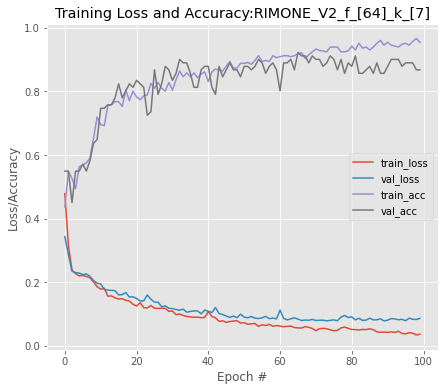

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,RIMONE_V2_f_[64]_k_[7],0.923077,0.904762,0.926829,0.915663,0.923415,0.926829,0.92


Model:Dataset:RIMONE_V2, Image size:64*64, Routing Count:1
Model:Filters:[256], Kernels:[7], Strides:1
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:64 Width:64
Model: "model_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_36 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 29, 29, 256)         37888     
                                                                 
 primary_capsule_conv (Conv2  (32, 12, 12, 512)        6423040   
 D)                                                              
                                                                 
 primarycap_reshape (Reshape  (32, 4608, 16)      

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy did not improve from 0.54945

Epoch 5: val_accuracy improved from 0.54945 to 0.65934, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.65934

Epoch 7: val_accuracy did not improve from 0.65934

Epoch 8: val_accuracy did not improve from 0.65934

Epoch 9: val_accuracy improved from 0.65934 to 0.68132, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.68132

Epoch 11: val_accuracy improved from 0.68132 to 0.69231, saving model to ./result/weights.h5

Epoch 12: val_accuracy improved from 0.69231 to 0.78022, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.78022

Epoch 14: val_accuracy improved from 0.78022 to 0.80220, saving model to ./result/weights.h5

Epoch 15: val_accuracy 

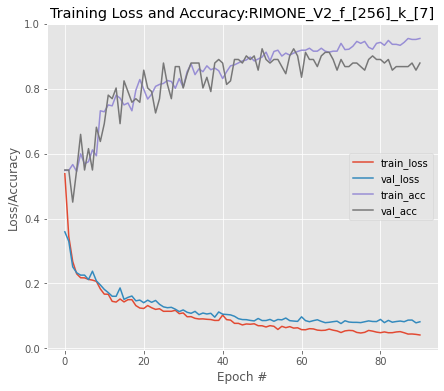

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,RIMONE_V2_f_[256]_k_[7],0.923077,0.904762,0.926829,0.915663,0.923415,0.926829,0.92


Model:Dataset:RIMONE_V2, Image size:64*64, Routing Count:1
Model:Filters:[128, 256], Kernels:[7, 9], Strides:1
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:64 Width:64
Model: "model_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_37 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 29, 29, 128)         18944     
                                                                 
 conv1 (Conv2D)              (32, 11, 11, 256)         2654464   
                                                                 
 primary_capsule_conv (Conv2  (32, 2, 2, 512)          10617344  
 D)                                       

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy did not improve from 0.54945

Epoch 5: val_accuracy did not improve from 0.54945

Epoch 6: val_accuracy did not improve from 0.54945

Epoch 7: val_accuracy did not improve from 0.54945

Epoch 8: val_accuracy did not improve from 0.54945

Epoch 9: val_accuracy did not improve from 0.54945

Epoch 10: val_accuracy did not improve from 0.54945

Epoch 11: val_accuracy did not improve from 0.54945

Epoch 12: val_accuracy improved from 0.54945 to 0.58242, saving model to ./result/weights.h5

Epoch 13: val_accuracy improved from 0.58242 to 0.70330, saving model to ./result/weights.h5

Epoch 14: val_accuracy did not improve from 0.70330

Epoch 15: val_accuracy did not improve from 0.70330

Epoch 16: val_accuracy improved from 0.70330 to 0.76923, saving model to ./result/weights.h5


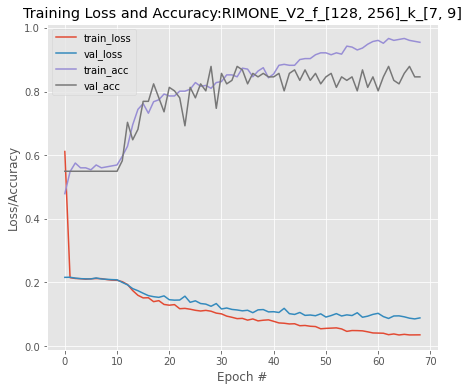

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,"RIMONE_V2_f_[128, 256]_k_[7, 9]",0.879121,0.857143,0.878049,0.86747,0.879024,0.878049,0.88


,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,"RIMONE_V2_f_[32, 64]_k_[7, 9]",0.912088,0.883721,0.926829,0.904762,0.913415,0.926829,0.90
1,"RIMONE_V2_f_[32, 64]_k_[5, 7]",0.912088,0.866667,0.951220,0.906977,0.915610,0.951220,0.88
2,"RIMONE_V2_f_[32, 64, 128]_k_[5, 7, 9]",0.890110,0.860465,0.902439,0.880952,0.891220,0.902439,0.88
3,RIMONE_V2_f_[128]_k_[7],0.923077,0.886364,0.951220,0.917647,0.925610,0.951220,0.90
4,RIMONE_V2_f_[128]_k_[5],0.912088,0.883721,0.926829,0.904762,0.913415,0.926829,0.90
5,RIMONE_V2_f_[64]_k_[7],0.923077,0.904762,0.926829,0.915663,0.923415,0.926829,0.92
6,RIMONE_V2_f_[256]_k_[7],0.923077,0.904762,0.926829,0.915663,0.923415,0.926829,0.92
7,"RIMONE_V2_f_[128, 256]_k_[7, 9]",0.879121,0.857143,0.878049,0.867470,0.879024,0.878049,0.88


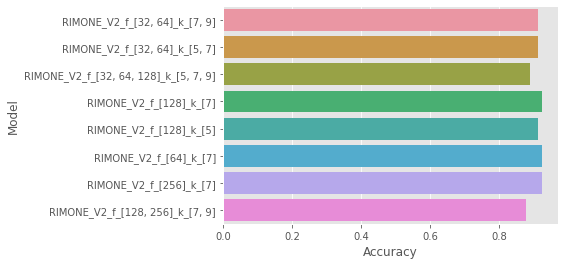

In [ ]:
vary_filters('RIMONE_V2')

Model:Dataset:ACRIMA, Image size:64*64, Routing Count:1
Model:Filters:[32, 64], Kernels:[7, 9], Strides:[1, 2]
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:64 Width:64
Model: "model_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_38 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 58, 58, 32)          4736      
                                                                 
 conv1 (Conv2D)              (32, 25, 25, 64)          165952    
                                                                 
 primary_capsule_conv (Conv2  (32, 9, 9, 512)          2654720   
 D)                                       

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.58865

Epoch 3: val_accuracy did not improve from 0.58865

Epoch 4: val_accuracy did not improve from 0.58865

Epoch 5: val_accuracy improved from 0.58865 to 0.74468, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.74468

Epoch 7: val_accuracy did not improve from 0.74468

Epoch 8: val_accuracy improved from 0.74468 to 0.76596, saving model to ./result/weights.h5

Epoch 9: val_accuracy improved from 0.76596 to 0.78723, saving model to ./result/weights.h5

Epoch 10: val_accuracy improved from 0.78723 to 0.84397, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.84397

Epoch 12: val_accuracy improved from 0.84397 to 0.86525, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.86525

Epoch 14: val_accuracy improved from 0.86525 to 0.90071, saving model to ./r

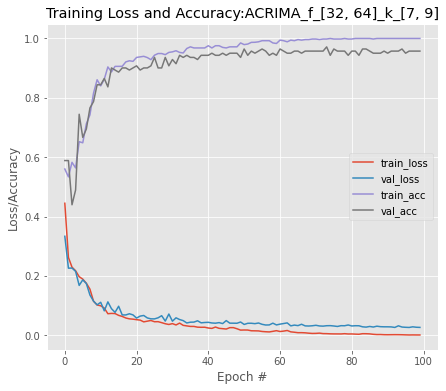

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,"ACRIMA_f_[32, 64]_k_[7, 9]",0.971631,0.95,0.982759,0.966102,0.973307,0.982759,0.963855


Model:Dataset:ACRIMA, Image size:64*64, Routing Count:1
Model:Filters:[32, 64], Kernels:[5, 7], Strides:[1, 2]
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:64 Width:64
Model: "model_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_39 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 60, 60, 32)          2432      
                                                                 
 conv1 (Conv2D)              (32, 27, 27, 64)          100416    
                                                                 
 primary_capsule_conv (Conv2  (32, 11, 11, 512)        1606144   
 D)                                       

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.58865

Epoch 3: val_accuracy improved from 0.58865 to 0.76596, saving model to ./result/weights.h5

Epoch 4: val_accuracy did not improve from 0.76596

Epoch 5: val_accuracy improved from 0.76596 to 0.80142, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.80142

Epoch 7: val_accuracy improved from 0.80142 to 0.85106, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.85106

Epoch 9: val_accuracy did not improve from 0.85106

Epoch 10: val_accuracy improved from 0.85106 to 0.87943, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.87943 to 0.89362, saving model to ./result/weights.h5

Epoch 12: val_accuracy improved from 0.89362 to 0.90071, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.90071

Epoch 14: val_accuracy did not impr

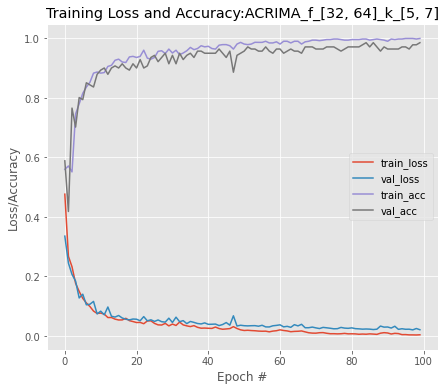

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,"ACRIMA_f_[32, 64]_k_[5, 7]",0.985816,0.966667,1.0,0.983051,0.987952,1.0,0.975904


Model:Dataset:ACRIMA, Image size:64*64, Routing Count:1
Model:Filters:[32, 64, 128], Kernels:[5, 7, 9], Strides:[1, 2, 2]
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:64 Width:64
Model: "model_39"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_40 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 60, 60, 32)          2432      
                                                                 
 conv1 (Conv2D)              (32, 27, 27, 64)          100416    
                                                                 
 conv2 (Conv2D)              (32, 10, 10, 128)         663680    
                               

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.58865

Epoch 3: val_accuracy did not improve from 0.58865

Epoch 4: val_accuracy did not improve from 0.58865

Epoch 5: val_accuracy did not improve from 0.58865

Epoch 6: val_accuracy improved from 0.58865 to 0.74468, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.74468 to 0.75887, saving model to ./result/weights.h5

Epoch 8: val_accuracy improved from 0.75887 to 0.78014, saving model to ./result/weights.h5

Epoch 9: val_accuracy did not improve from 0.78014

Epoch 10: val_accuracy improved from 0.78014 to 0.80851, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.80851 to 0.82979, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.82979

Epoch 13: val_accuracy improved from 0.82979 to 0.84397, saving model to ./result/weights.h5

Epoch 14: val_accuracy improved fro

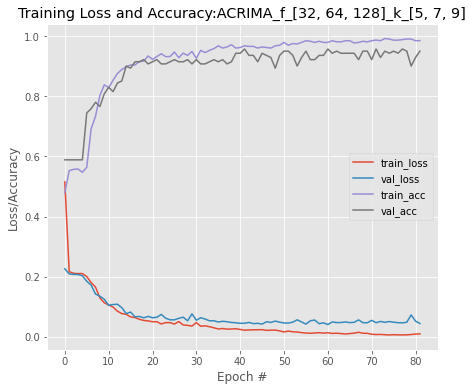

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,"ACRIMA_f_[32, 64, 128]_k_[5, 7, 9]",0.957447,0.964286,0.931034,0.947368,0.953469,0.931034,0.975904


Model:Dataset:ACRIMA, Image size:64*64, Routing Count:1
Model:Filters:[128], Kernels:[7], Strides:[2]
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:64 Width:64
Model: "model_40"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_41 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 29, 29, 128)         18944     
                                                                 
 primary_capsule_conv (Conv2  (32, 12, 12, 512)        3211776   
 D)                                                              
                                                                 
 primarycap_reshape (Reshape  (32, 4608, 16)       

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.58865

Epoch 3: val_accuracy improved from 0.58865 to 0.68794, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.68794 to 0.73050, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.73050 to 0.81560, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.81560

Epoch 7: val_accuracy improved from 0.81560 to 0.85816, saving model to ./result/weights.h5

Epoch 8: val_accuracy improved from 0.85816 to 0.87234, saving model to ./result/weights.h5

Epoch 9: val_accuracy improved from 0.87234 to 0.88652, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.88652

Epoch 11: val_accuracy improved from 0.88652 to 0.89362, saving model to ./result/weights.h5

Epoch 12: val_accuracy improved from 0.89362 to 0.90071, saving model to ./result/weights.h5

Epoch 

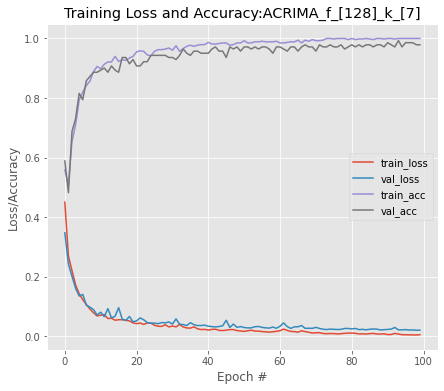

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,ACRIMA_f_[128]_k_[7],0.992908,0.983051,1.0,0.991453,0.993976,1.0,0.987952


Model:Dataset:ACRIMA, Image size:64*64, Routing Count:1
Model:Filters:[128], Kernels:[5], Strides:[2]
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:64 Width:64
Model: "model_41"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_42 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 30, 30, 128)         9728      
                                                                 
 primary_capsule_conv (Conv2  (32, 13, 13, 512)        1638912   
 D)                                                              
                                                                 
 primarycap_reshape (Reshape  (32, 5408, 16)       

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.58865 to 0.71631, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.71631 to 0.81560, saving model to ./result/weights.h5

Epoch 4: val_accuracy did not improve from 0.81560

Epoch 5: val_accuracy improved from 0.81560 to 0.84397, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.84397

Epoch 7: val_accuracy improved from 0.84397 to 0.87943, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.87943

Epoch 9: val_accuracy did not improve from 0.87943

Epoch 10: val_accuracy improved from 0.87943 to 0.90071, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.90071

Epoch 12: val_accuracy did not improve from 0.90071

Epoch 13: val_accuracy did not improve from 0.90071

Epoch 14: val_accuracy improved from 0.90071 to 0.90780, saving model to ./r

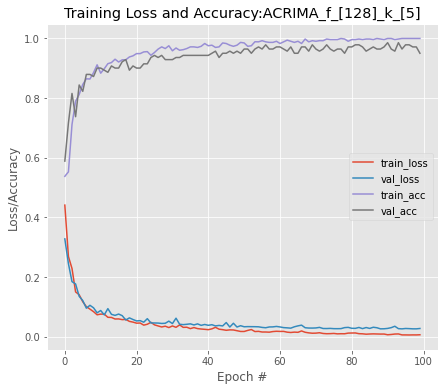

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,ACRIMA_f_[128]_k_[5],0.985816,0.966667,1.0,0.983051,0.987952,1.0,0.975904


Model:Dataset:ACRIMA, Image size:64*64, Routing Count:1
Model:Filters:[64], Kernels:[7], Strides:[2]
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:64 Width:64
Model: "model_42"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_43 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 29, 29, 64)          9472      
                                                                 
 primary_capsule_conv (Conv2  (32, 12, 12, 512)        1606144   
 D)                                                              
                                                                 
 primarycap_reshape (Reshape  (32, 4608, 16)        

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.58865 to 0.73759, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.73759 to 0.75887, saving model to ./result/weights.h5

Epoch 4: val_accuracy did not improve from 0.75887

Epoch 5: val_accuracy improved from 0.75887 to 0.84397, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.84397

Epoch 7: val_accuracy improved from 0.84397 to 0.87234, saving model to ./result/weights.h5

Epoch 8: val_accuracy improved from 0.87234 to 0.87943, saving model to ./result/weights.h5

Epoch 9: val_accuracy improved from 0.87943 to 0.89362, saving model to ./result/weights.h5

Epoch 10: val_accuracy improved from 0.89362 to 0.90071, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.90071

Epoch 12: val_accuracy did not improve from 0.90071

Epoch 13: val_accuracy did not improve from 0.9

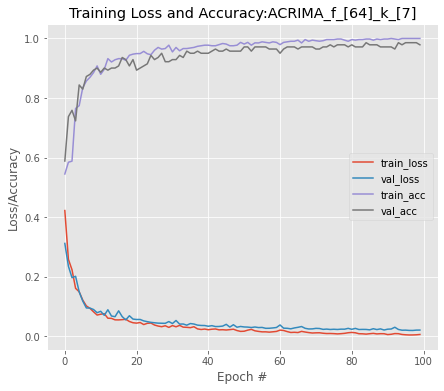

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,ACRIMA_f_[64]_k_[7],0.985816,0.982759,0.982759,0.982759,0.985355,0.982759,0.987952


Model:Dataset:ACRIMA, Image size:64*64, Routing Count:1
Model:Filters:[256], Kernels:[7], Strides:[2]
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:64 Width:64
Model: "model_43"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_44 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 29, 29, 256)         37888     
                                                                 
 primary_capsule_conv (Conv2  (32, 12, 12, 512)        6423040   
 D)                                                              
                                                                 
 primarycap_reshape (Reshape  (32, 4608, 16)       

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.58865

Epoch 3: val_accuracy improved from 0.58865 to 0.74468, saving model to ./result/weights.h5

Epoch 4: val_accuracy did not improve from 0.74468

Epoch 5: val_accuracy improved from 0.74468 to 0.80142, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.80142 to 0.82270, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.82270 to 0.87234, saving model to ./result/weights.h5

Epoch 8: val_accuracy improved from 0.87234 to 0.87943, saving model to ./result/weights.h5

Epoch 9: val_accuracy improved from 0.87943 to 0.88652, saving model to ./result/weights.h5

Epoch 10: val_accuracy improved from 0.88652 to 0.89362, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.89362

Epoch 12: val_accuracy did not improve from 0.89362

Epoch 13: val_accuracy did not improve from 0.8

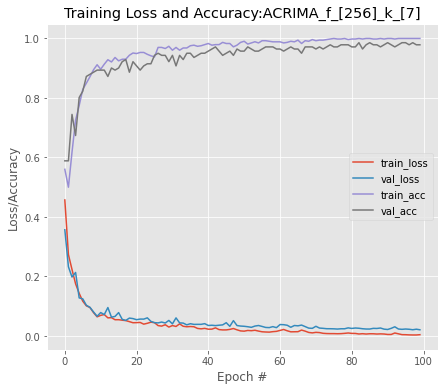

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,ACRIMA_f_[256]_k_[7],0.985816,0.966667,1.0,0.983051,0.987952,1.0,0.975904


Model:Dataset:ACRIMA, Image size:64*64, Routing Count:1
Model:Filters:[128, 256], Kernels:[7, 9], Strides:[2, 2]
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:64 Width:64
Model: "model_44"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_45 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 29, 29, 128)         18944     
                                                                 
 conv1 (Conv2D)              (32, 11, 11, 256)         2654464   
                                                                 
 primary_capsule_conv (Conv2  (32, 2, 2, 512)          10617344  
 D)                                     

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.58865

Epoch 3: val_accuracy did not improve from 0.58865

Epoch 4: val_accuracy improved from 0.58865 to 0.61702, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.61702 to 0.73759, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.73759

Epoch 7: val_accuracy improved from 0.73759 to 0.78723, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.78723

Epoch 9: val_accuracy improved from 0.78723 to 0.80142, saving model to ./result/weights.h5

Epoch 10: val_accuracy improved from 0.80142 to 0.82979, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.82979 to 0.83688, saving model to ./result/weights.h5

Epoch 12: val_accuracy improved from 0.83688 to 0.86525, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.8

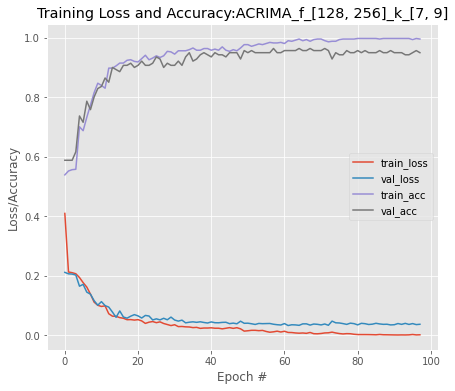

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,"ACRIMA_f_[128, 256]_k_[7, 9]",0.964539,0.934426,0.982759,0.957983,0.967283,0.982759,0.951807


,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,"ACRIMA_f_[32, 64]_k_[7, 9]",0.971631,0.950000,0.982759,0.966102,0.973307,0.982759,0.963855
1,"ACRIMA_f_[32, 64]_k_[5, 7]",0.985816,0.966667,1.000000,0.983051,0.987952,1.000000,0.975904
2,"ACRIMA_f_[32, 64, 128]_k_[5, 7, 9]",0.957447,0.964286,0.931034,0.947368,0.953469,0.931034,0.975904
3,ACRIMA_f_[128]_k_[7],0.992908,0.983051,1.000000,0.991453,0.993976,1.000000,0.987952
4,ACRIMA_f_[128]_k_[5],0.985816,0.966667,1.000000,0.983051,0.987952,1.000000,0.975904
5,ACRIMA_f_[64]_k_[7],0.985816,0.982759,0.982759,0.982759,0.985355,0.982759,0.987952
6,ACRIMA_f_[256]_k_[7],0.985816,0.966667,1.000000,0.983051,0.987952,1.000000,0.975904
7,"ACRIMA_f_[128, 256]_k_[7, 9]",0.964539,0.934426,0.982759,0.957983,0.967283,0.982759,0.951807


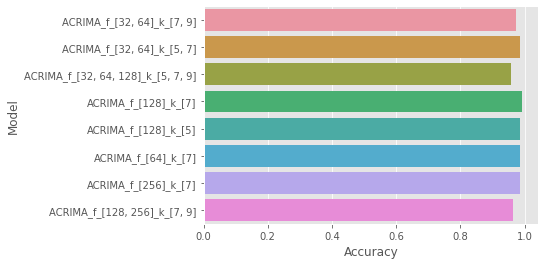

In [ ]:
vary_filters('ACRIMA')

Model:Dataset:RIMONE_DL, Image size:64*64, Routing Count:1
Model:Filters:[32, 64], Kernels:[7, 9], Strides:[1, 2]
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Model: "model_45"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_46 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 58, 58, 32)          4736      
                                                                 
 conv1 (Conv2D)              (32, 25, 25, 64)          165952    
                                                                 
 primary_capsule_conv (Conv2  (32, 9, 9, 512)          2654720   
 D)                                                       

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy did not improve from 0.64384

Epoch 5: val_accuracy did not improve from 0.64384

Epoch 6: val_accuracy did not improve from 0.64384

Epoch 7: val_accuracy did not improve from 0.64384

Epoch 8: val_accuracy did not improve from 0.64384

Epoch 9: val_accuracy did not improve from 0.64384

Epoch 10: val_accuracy did not improve from 0.64384

Epoch 11: val_accuracy did not improve from 0.64384

Epoch 12: val_accuracy improved from 0.64384 to 0.65068, saving model to ./result/weights.h5

Epoch 13: val_accuracy improved from 0.65068 to 0.67123, saving model to ./result/weights.h5

Epoch 14: val_accuracy improved from 0.67123 to 0.69863, saving model to ./result/weights.h5

Epoch 15: val_accuracy did not improve from 0.69863

Epoch 16: val_accuracy did not improve from 0.69863


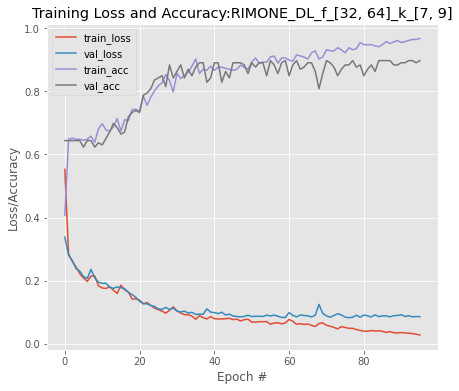

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,"RIMONE_DL_f_[32, 64]_k_[7, 9]",0.89726,0.89899,0.946809,0.92228,0.87725,0.946809,0.807692


Model:Dataset:RIMONE_DL, Image size:64*64, Routing Count:1
Model:Filters:[32, 64], Kernels:[5, 7], Strides:[1, 2]
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Model: "model_46"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_47 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 60, 60, 32)          2432      
                                                                 
 conv1 (Conv2D)              (32, 27, 27, 64)          100416    
                                                                 
 primary_capsule_conv (Conv2  (32, 11, 11, 512)        1606144   
 D)                                                       

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.35616, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.35616 to 0.64384, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy did not improve from 0.64384

Epoch 5: val_accuracy did not improve from 0.64384

Epoch 6: val_accuracy did not improve from 0.64384

Epoch 7: val_accuracy improved from 0.64384 to 0.65068, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.65068

Epoch 9: val_accuracy did not improve from 0.65068

Epoch 10: val_accuracy did not improve from 0.65068

Epoch 11: val_accuracy improved from 0.65068 to 0.66438, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.66438

Epoch 13: val_accuracy improved from 0.66438 to 0.72603, saving model to ./result/weights.h5

Epoch 14: val_accuracy improved from 0.72603 to 0.73288, saving model to ./result/weights.h5

Epoch 15: val_accuracy 

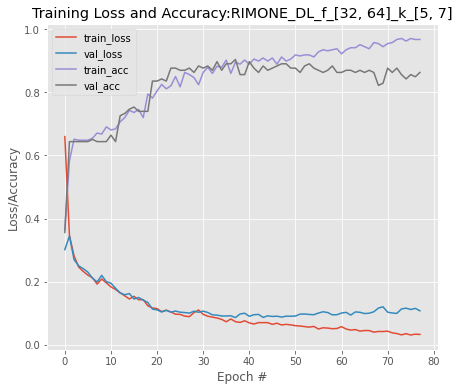

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,"RIMONE_DL_f_[32, 64]_k_[5, 7]",0.90411,0.892157,0.968085,0.928571,0.878273,0.968085,0.788462


Model:Dataset:RIMONE_DL, Image size:64*64, Routing Count:1
Model:Filters:[32, 64, 128], Kernels:[5, 7, 9], Strides:[1, 2, 2]
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Model: "model_47"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_48 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 60, 60, 32)          2432      
                                                                 
 conv1 (Conv2D)              (32, 27, 27, 64)          100416    
                                                                 
 conv2 (Conv2D)              (32, 10, 10, 128)         663680    
                                               

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy did not improve from 0.64384

Epoch 5: val_accuracy did not improve from 0.64384

Epoch 6: val_accuracy did not improve from 0.64384

Epoch 7: val_accuracy did not improve from 0.64384

Epoch 8: val_accuracy did not improve from 0.64384

Epoch 9: val_accuracy did not improve from 0.64384

Epoch 10: val_accuracy did not improve from 0.64384

Epoch 11: val_accuracy did not improve from 0.64384

Epoch 12: val_accuracy did not improve from 0.64384

Epoch 13: val_accuracy did not improve from 0.64384

Epoch 14: val_accuracy improved from 0.64384 to 0.65068, saving model to ./result/weights.h5

Epoch 15: val_accuracy did not improve from 0.65068

Epoch 16: val_accuracy improved from 0.65068 to 0.66438, saving model to ./result/weights.h5

Epoch 17: val_accuracy did not improve f

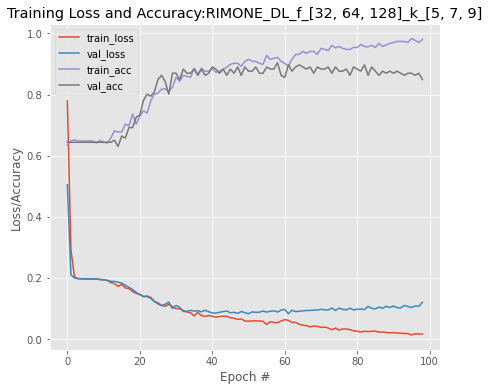

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,"RIMONE_DL_f_[32, 64, 128]_k_[5, 7, 9]",0.90411,0.908163,0.946809,0.927083,0.886866,0.946809,0.826923


Model:Dataset:RIMONE_DL, Image size:64*64, Routing Count:1
Model:Filters:[128], Kernels:[7], Strides:[2]
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Model: "model_48"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_49 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 29, 29, 128)         18944     
                                                                 
 primary_capsule_conv (Conv2  (32, 12, 12, 512)        3211776   
 D)                                                              
                                                                 
 primarycap_reshape (Reshape  (32, 4608, 16)           0         
 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy did not improve from 0.64384

Epoch 5: val_accuracy did not improve from 0.64384

Epoch 6: val_accuracy did not improve from 0.64384

Epoch 7: val_accuracy improved from 0.64384 to 0.65068, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.65068

Epoch 9: val_accuracy improved from 0.65068 to 0.67123, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.67123

Epoch 11: val_accuracy did not improve from 0.67123

Epoch 12: val_accuracy improved from 0.67123 to 0.68493, saving model to ./result/weights.h5

Epoch 13: val_accuracy improved from 0.68493 to 0.69863, saving model to ./result/weights.h5

Epoch 14: val_accuracy improved from 0.69863 to 0.74658, saving model to ./result/weights.h5

Epoch 15: val_accuracy 

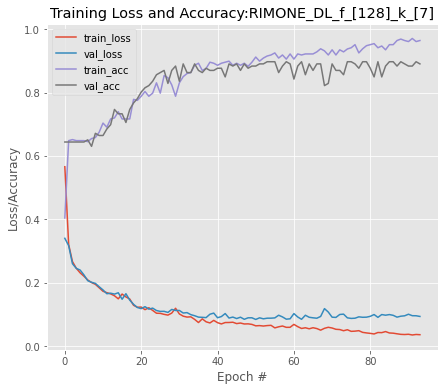

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,RIMONE_DL_f_[128]_k_[7],0.89726,0.891089,0.957447,0.923077,0.872954,0.957447,0.788462


Model:Dataset:RIMONE_DL, Image size:64*64, Routing Count:1
Model:Filters:[128], Kernels:[5], Strides:[2]
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Model: "model_49"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_50 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 30, 30, 128)         9728      
                                                                 
 primary_capsule_conv (Conv2  (32, 13, 13, 512)        1638912   
 D)                                                              
                                                                 
 primarycap_reshape (Reshape  (32, 5408, 16)           0         
 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy did not improve from 0.64384

Epoch 5: val_accuracy did not improve from 0.64384

Epoch 6: val_accuracy did not improve from 0.64384

Epoch 7: val_accuracy improved from 0.64384 to 0.65068, saving model to ./result/weights.h5

Epoch 8: val_accuracy improved from 0.65068 to 0.66438, saving model to ./result/weights.h5

Epoch 9: val_accuracy did not improve from 0.66438

Epoch 10: val_accuracy improved from 0.66438 to 0.67808, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.67808 to 0.71233, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.71233

Epoch 13: val_accuracy improved from 0.71233 to 0.73288, saving model to ./result/weights.h5

Epoch 14: val_accuracy improved from 0.73288 to 0.76027, saving model to ./r

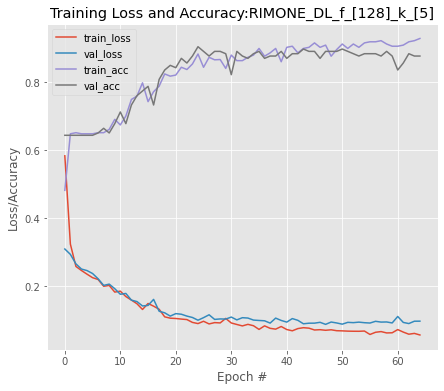

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,RIMONE_DL_f_[128]_k_[5],0.90411,0.892157,0.968085,0.928571,0.878273,0.968085,0.788462


Model:Dataset:RIMONE_DL, Image size:64*64, Routing Count:1
Model:Filters:[64], Kernels:[7], Strides:[2]
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Model: "model_50"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_51 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 29, 29, 64)          9472      
                                                                 
 primary_capsule_conv (Conv2  (32, 12, 12, 512)        1606144   
 D)                                                              
                                                                 
 primarycap_reshape (Reshape  (32, 4608, 16)           0         
 )

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy did not improve from 0.64384

Epoch 5: val_accuracy did not improve from 0.64384

Epoch 6: val_accuracy did not improve from 0.64384

Epoch 7: val_accuracy improved from 0.64384 to 0.65068, saving model to ./result/weights.h5

Epoch 8: val_accuracy improved from 0.65068 to 0.66438, saving model to ./result/weights.h5

Epoch 9: val_accuracy did not improve from 0.66438

Epoch 10: val_accuracy improved from 0.66438 to 0.68493, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.68493

Epoch 12: val_accuracy did not improve from 0.68493

Epoch 13: val_accuracy improved from 0.68493 to 0.69178, saving model to ./result/weights.h5

Epoch 14: val_accuracy improved from 0.69178 to 0.74658, saving model to ./result/weights.h5

Epoch 15: val_accuracy 

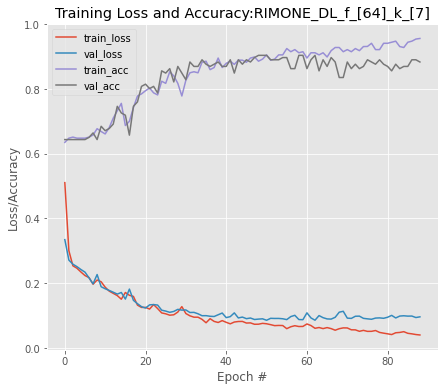

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,RIMONE_DL_f_[64]_k_[7],0.90411,0.9,0.957447,0.927835,0.88257,0.957447,0.807692


Model:Dataset:RIMONE_DL, Image size:64*64, Routing Count:1
Model:Filters:[256], Kernels:[7], Strides:[2]
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Model: "model_51"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_52 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 29, 29, 256)         37888     
                                                                 
 primary_capsule_conv (Conv2  (32, 12, 12, 512)        6423040   
 D)                                                              
                                                                 
 primarycap_reshape (Reshape  (32, 4608, 16)           0         
 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy did not improve from 0.64384

Epoch 5: val_accuracy improved from 0.64384 to 0.65068, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.65068

Epoch 7: val_accuracy did not improve from 0.65068

Epoch 8: val_accuracy improved from 0.65068 to 0.66438, saving model to ./result/weights.h5

Epoch 9: val_accuracy improved from 0.66438 to 0.69863, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.69863

Epoch 11: val_accuracy did not improve from 0.69863

Epoch 12: val_accuracy improved from 0.69863 to 0.71233, saving model to ./result/weights.h5

Epoch 13: val_accuracy improved from 0.71233 to 0.75342, saving model to ./result/weights.h5

Epoch 14: val_accuracy did not improve from 0.75342

Epoch 15: val_accuracy 

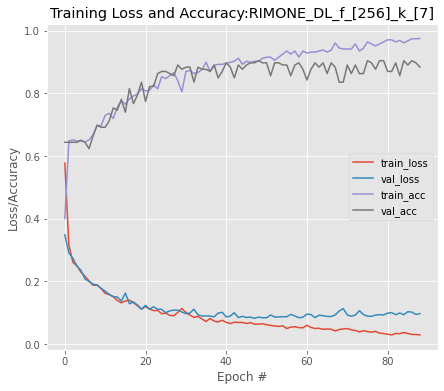

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,RIMONE_DL_f_[256]_k_[7],0.90411,0.9,0.957447,0.927835,0.88257,0.957447,0.807692


Model:Dataset:RIMONE_DL, Image size:64*64, Routing Count:1
Model:Filters:[128, 256], Kernels:[7, 9], Strides:[2, 2]
Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Model: "model_52"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_53 (InputLayer)       [(32, 64, 64, 3)]         0         
                                                                 
 conv0 (Conv2D)              (32, 29, 29, 128)         18944     
                                                                 
 conv1 (Conv2D)              (32, 11, 11, 256)         2654464   
                                                                 
 primary_capsule_conv (Conv2  (32, 2, 2, 512)          10617344  
 D)                                                     

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy did not improve from 0.64384

Epoch 5: val_accuracy did not improve from 0.64384

Epoch 6: val_accuracy did not improve from 0.64384

Epoch 7: val_accuracy did not improve from 0.64384

Epoch 8: val_accuracy did not improve from 0.64384

Epoch 9: val_accuracy did not improve from 0.64384

Epoch 10: val_accuracy did not improve from 0.64384

Epoch 11: val_accuracy did not improve from 0.64384

Epoch 12: val_accuracy did not improve from 0.64384

Epoch 13: val_accuracy improved from 0.64384 to 0.66438, saving model to ./result/weights.h5

Epoch 14: val_accuracy did not improve from 0.66438

Epoch 15: val_accuracy improved from 0.66438 to 0.67123, saving model to ./result/weights.h5

Epoch 16: val_accuracy did not improve from 0.67123

Epoch 17: val_accuracy improved from 0.6

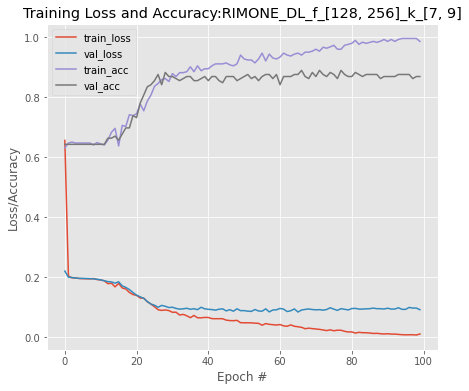

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,"RIMONE_DL_f_[128, 256]_k_[7, 9]",0.890411,0.897959,0.93617,0.916667,0.871931,0.93617,0.807692


,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,"RIMONE_DL_f_[32, 64]_k_[7, 9]",0.897260,0.898990,0.946809,0.922280,0.877250,0.946809,0.807692
1,"RIMONE_DL_f_[32, 64]_k_[5, 7]",0.904110,0.892157,0.968085,0.928571,0.878273,0.968085,0.788462
2,"RIMONE_DL_f_[32, 64, 128]_k_[5, 7, 9]",0.904110,0.908163,0.946809,0.927083,0.886866,0.946809,0.826923
3,RIMONE_DL_f_[128]_k_[7],0.897260,0.891089,0.957447,0.923077,0.872954,0.957447,0.788462
4,RIMONE_DL_f_[128]_k_[5],0.904110,0.892157,0.968085,0.928571,0.878273,0.968085,0.788462
5,RIMONE_DL_f_[64]_k_[7],0.904110,0.900000,0.957447,0.927835,0.882570,0.957447,0.807692
6,RIMONE_DL_f_[256]_k_[7],0.904110,0.900000,0.957447,0.927835,0.882570,0.957447,0.807692
7,"RIMONE_DL_f_[128, 256]_k_[7, 9]",0.890411,0.897959,0.936170,0.916667,0.871931,0.936170,0.807692


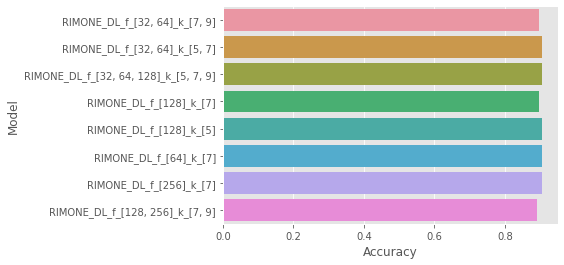

In [ ]:
vary_filters('RIMONE_DL')

# TRansfer Learning Fresh

Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:224 Width:224
Building CapsNet on top of vgg16
58900480/58889256 [==============================] - 0s 0us/step
Adding capsule layer on vgg16 
Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                       

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy improved from 0.54945 to 0.69231, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.69231 to 0.72527, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.72527 to 0.74725, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.74725 to 0.76923, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.76923

Epoch 9: val_accuracy did not improve from 0.76923

Epoch 10: val_accuracy did not improve from 0.76923

Epoch 11: val_accuracy did not improve from 0.76923

Epoch 12: val_accuracy improved from 0.76923 to 0.79121, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.79121

Epoch 14: val_accuracy did not improve from 0.79121

Epoch 15: val_accuracy 

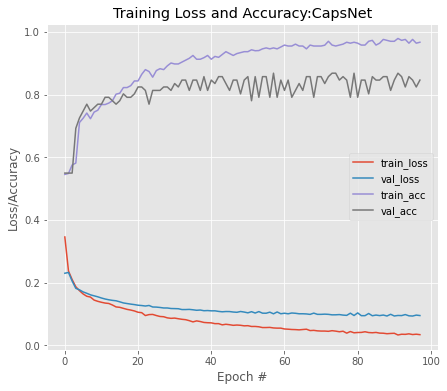

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.868132,0.853659,0.853659,0.853659,0.866829,0.853659,0.88


Building CapsNet on top of vgg19
80150528/80134624 [==============================] - 0s 0us/step
Adding capsule layer on vgg19 
Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (32, 112, 112, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (32, 112, 112, 128)       147584 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy improved from 0.54945 to 0.70330, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.70330

Epoch 6: val_accuracy did not improve from 0.70330

Epoch 7: val_accuracy improved from 0.70330 to 0.72527, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.72527

Epoch 9: val_accuracy improved from 0.72527 to 0.73626, saving model to ./result/weights.h5

Epoch 10: val_accuracy improved from 0.73626 to 0.74725, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.74725 to 0.76923, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.76923

Epoch 13: val_accuracy did not improve from 0.76923

Epoch 14: val_accuracy did not improve from 0.76923

Epoch 15: val_accuracy 

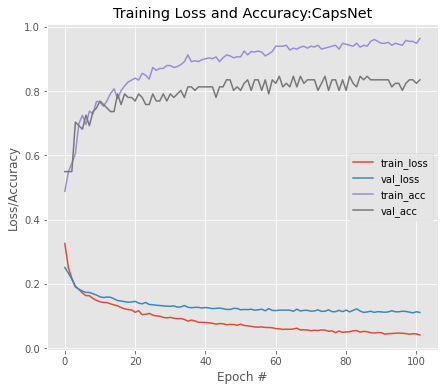

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg19,0.846154,0.846154,0.804878,0.825,0.842439,0.804878,0.88


Building CapsNet on top of densenet121
29097984/29084464 [==============================] - 0s 0us/step
Adding capsule layer on densenet121 
Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (32, 230, 230, 3)   0           ['input_9[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d[0][0]']         
                                                                                                  
 conv1/bn (BatchNormalization)  (32, 112, 112, 64)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.60440, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.60440 to 0.79121, saving model to ./result/weights.h5

Epoch 4: val_accuracy did not improve from 0.79121

Epoch 5: val_accuracy improved from 0.79121 to 0.82418, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.82418 to 0.84615, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.84615 to 0.86813, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.86813

Epoch 9: val_accuracy improved from 0.86813 to 0.87912, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.87912

Epoch 11: val_accuracy did not improve from 0.87912

Epoch 12: val_accuracy did not improve from 0.87912

Epoch 13: val_accuracy improved from 0.87912 to 0.89011, saving model to ./result/weight

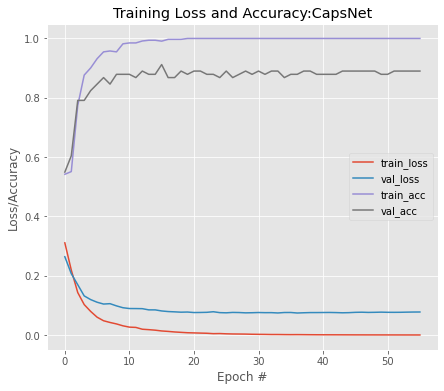

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet121,0.912088,0.923077,0.878049,0.9,0.909024,0.878049,0.94


Building CapsNet on top of MobileNet
Adding capsule layer on MobileNet 
Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(32, 224, 224, 3)]       0         
                                                                 
 conv1 (Conv2D)              (32, 112, 112, 32)        864       
                                                                 
 conv1_bn (BatchNormalizatio  (32, 112, 112, 32)       128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (32, 112, 112, 32)        0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (32, 112, 112, 32)       288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (32, 112, 112, 32)     

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.67033, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.67033 to 0.83516, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.83516 to 0.89011, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.89011 to 0.90110, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.90110

Epoch 7: val_accuracy did not improve from 0.90110

Epoch 8: val_accuracy did not improve from 0.90110

Epoch 9: val_accuracy did not improve from 0.90110

Epoch 10: val_accuracy improved from 0.90110 to 0.91209, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.91209

Epoch 12: val_accuracy did not improve from 0.91209

Epoch 13: val_accuracy did not improve from 0.91209

Epoch 14: val_accuracy did not improve from 0.91209

Epoch 15: val_accuracy 

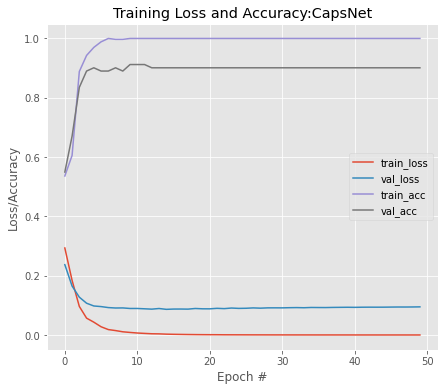

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,MobileNet,0.912088,0.945946,0.853659,0.897436,0.906829,0.853659,0.96


,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.868132,0.853659,0.853659,0.853659,0.866829,0.853659,0.88
1,vgg19,0.846154,0.846154,0.804878,0.825000,0.842439,0.804878,0.88
2,densenet121,0.912088,0.923077,0.878049,0.900000,0.909024,0.878049,0.94
3,MobileNet,0.912088,0.945946,0.853659,0.897436,0.906829,0.853659,0.96


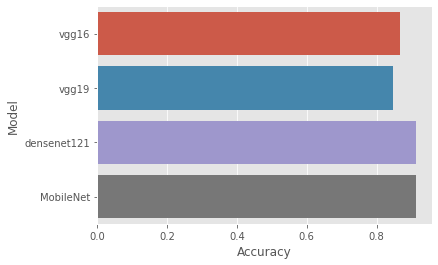

In [ ]:
rim_one_v2_trsfer_lr()

Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Building CapsNet on top of vgg16
Adding capsule layer on vgg16 
Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(32, 224, 64, 3)]        0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 64, 64)         1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 64, 64)         36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 32, 64)         0         
                                                                 
 block2_conv1 (Conv2D)       (32, 112, 32, 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy did not improve from 0.64384

Epoch 5: val_accuracy improved from 0.64384 to 0.73973, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.73973

Epoch 7: val_accuracy improved from 0.73973 to 0.76712, saving model to ./result/weights.h5

Epoch 8: val_accuracy improved from 0.76712 to 0.77397, saving model to ./result/weights.h5

Epoch 9: val_accuracy improved from 0.77397 to 0.82192, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.82192

Epoch 11: val_accuracy did not improve from 0.82192

Epoch 12: val_accuracy did not improve from 0.82192

Epoch 13: val_accuracy did not improve from 0.82192

Epoch 14: val_accuracy improved from 0.82192 to 0.83562, saving model to ./result/weights.h5

Epoch 15: val_accuracy 

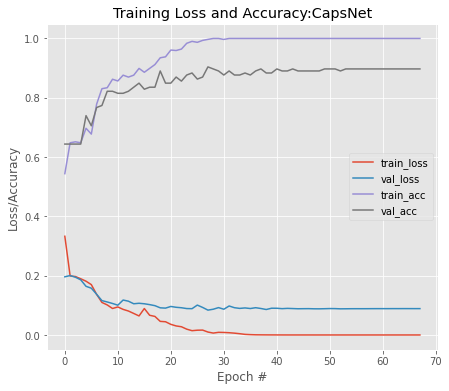

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.90411,0.9,0.957447,0.927835,0.88257,0.957447,0.807692


Building CapsNet on top of vgg19
Adding capsule layer on vgg19 
Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_12 (InputLayer)       [(32, 224, 64, 3)]        0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 64, 64)         1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 64, 64)         36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 32, 64)         0         
                                                                 
 block2_conv1 (Conv2D)       (32, 112, 32, 128)        73856     
                                                                 
 block2_conv2 (Conv2D)       (32, 112, 32, 128)        147584    
                                                             

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy improved from 0.64384 to 0.65068, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.65068 to 0.67123, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.67123 to 0.78767, saving model to ./result/weights.h5

Epoch 7: val_accuracy did not improve from 0.78767

Epoch 8: val_accuracy improved from 0.78767 to 0.81507, saving model to ./result/weights.h5

Epoch 9: val_accuracy did not improve from 0.81507

Epoch 10: val_accuracy did not improve from 0.81507

Epoch 11: val_accuracy did not improve from 0.81507

Epoch 12: val_accuracy improved from 0.81507 to 0.84247, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.84247

Epoch 14: val_accuracy did not improve from 0.84247

Epoch 15: val_accuracy 

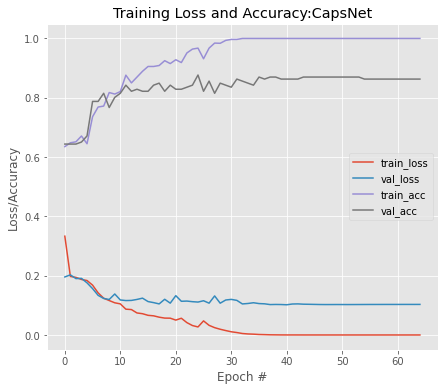

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg19,0.876712,0.913043,0.893617,0.903226,0.869885,0.893617,0.846154


Building CapsNet on top of resnet50
94781440/94765736 [==============================] - 1s 0us/step
Adding capsule layer on resnet50 
Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_13 (InputLayer)          [(32, 224, 64, 3)]   0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (32, 230, 70, 3)     0           ['input_13[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (32, 112, 32, 64)    9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (32, 112, 32, 64)    25

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy did not improve from 0.64384

Epoch 5: val_accuracy did not improve from 0.64384

Epoch 6: val_accuracy did not improve from 0.64384

Epoch 7: val_accuracy did not improve from 0.64384

Epoch 8: val_accuracy did not improve from 0.64384

Epoch 9: val_accuracy did not improve from 0.64384

Epoch 10: val_accuracy did not improve from 0.64384

Epoch 11: val_accuracy did not improve from 0.64384

Epoch 12: val_accuracy did not improve from 0.64384

Epoch 13: val_accuracy did not improve from 0.64384

Epoch 14: val_accuracy did not improve from 0.64384

Epoch 15: val_accuracy did not improve from 0.64384

Epoch 16: val_accuracy improved from 0.64384 to 0.78082, saving model to ./result/weights.h5

Epoch 17: val_accuracy did not improve from 0.78082

Epoch 18: val_accuracy did n

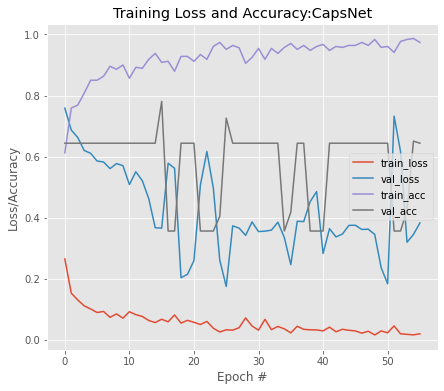

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,resnet50,0.780822,0.776786,0.925532,0.84466,0.722381,0.925532,0.519231


Building CapsNet on top of densenet121
Adding capsule layer on densenet121 
Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_14 (InputLayer)          [(32, 224, 64, 3)]   0           []                               
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (32, 230, 70, 3)    0           ['input_14[0][0]']               
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 32, 64)    9408        ['zero_padding2d_2[0][0]']       
                                                                                                  
 conv1/bn (Batc

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy improved from 0.64384 to 0.68493, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.68493 to 0.73973, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.73973

Epoch 7: val_accuracy improved from 0.73973 to 0.74658, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.74658

Epoch 9: val_accuracy did not improve from 0.74658

Epoch 10: val_accuracy improved from 0.74658 to 0.78082, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.78082 to 0.80137, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.80137

Epoch 13: val_accuracy did not improve from 0.80137

Epoch 14: val_accuracy did not improve from 0.80137

Epoch 15: val_accuracy 

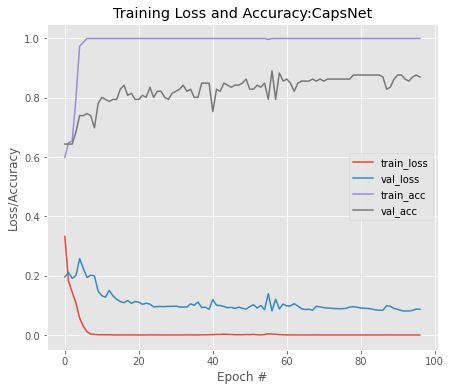

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet121,0.890411,0.914894,0.914894,0.914894,0.880524,0.914894,0.846154


Building CapsNet on top of densenet169
51888128/51877672 [==============================] - 0s 0us/step
Adding capsule layer on densenet169 
Model: "model_12"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_15 (InputLayer)          [(32, 224, 64, 3)]   0           []                               
                                                                                                  
 zero_padding2d_4 (ZeroPadding2  (32, 230, 70, 3)    0           ['input_15[0][0]']               
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 32, 64)    9408        ['zero_padding2d_4[0][0]']       
                                                 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy improved from 0.64384 to 0.77397, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.77397 to 0.81507, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.81507

Epoch 7: val_accuracy did not improve from 0.81507

Epoch 8: val_accuracy did not improve from 0.81507

Epoch 9: val_accuracy did not improve from 0.81507

Epoch 10: val_accuracy did not improve from 0.81507

Epoch 11: val_accuracy did not improve from 0.81507

Epoch 12: val_accuracy improved from 0.81507 to 0.84932, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.84932

Epoch 14: val_accuracy did not improve from 0.84932

Epoch 15: val_accuracy did not improve from 0.84932

Epoch 16: val_accuracy did not improve from 0.84932


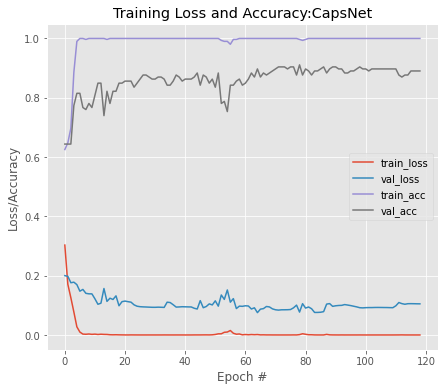

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet169,0.910959,0.893204,0.978723,0.93401,0.883592,0.978723,0.788462


Building CapsNet on top of MobileNet
Adding capsule layer on MobileNet 
Model: "model_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(32, 224, 64, 3)]        0         
                                                                 
 conv1 (Conv2D)              (32, 112, 32, 32)         864       
                                                                 
 conv1_bn (BatchNormalizatio  (32, 112, 32, 32)        128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (32, 112, 32, 32)         0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (32, 112, 32, 32)        288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (32, 112, 32, 32)     

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.62329, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.62329 to 0.64384, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy improved from 0.64384 to 0.66438, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.66438

Epoch 6: val_accuracy did not improve from 0.66438

Epoch 7: val_accuracy did not improve from 0.66438

Epoch 8: val_accuracy did not improve from 0.66438

Epoch 9: val_accuracy did not improve from 0.66438

Epoch 10: val_accuracy did not improve from 0.66438

Epoch 11: val_accuracy did not improve from 0.66438

Epoch 12: val_accuracy did not improve from 0.66438

Epoch 13: val_accuracy did not improve from 0.66438

Epoch 14: val_accuracy did not improve from 0.66438

Epoch 15: val_accuracy did not improve from 0.66438

Epoch 16: val_accuracy did not improve from 0.66438

Epoch 17: val_accuracy did not improve f

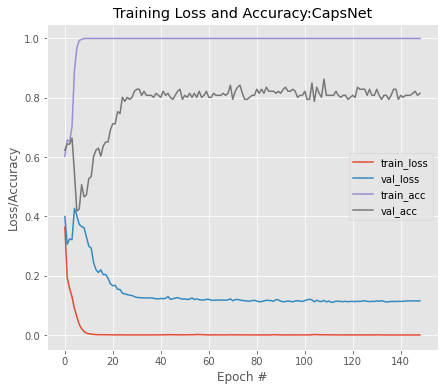

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,MobileNet,0.863014,0.902174,0.882979,0.892473,0.854951,0.882979,0.826923


,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.904110,0.900000,0.957447,0.927835,0.882570,0.957447,0.807692
1,vgg19,0.876712,0.913043,0.893617,0.903226,0.869885,0.893617,0.846154
2,resnet50,0.780822,0.776786,0.925532,0.844660,0.722381,0.925532,0.519231
3,densenet121,0.890411,0.914894,0.914894,0.914894,0.880524,0.914894,0.846154
4,densenet169,0.910959,0.893204,0.978723,0.934010,0.883592,0.978723,0.788462
5,MobileNet,0.863014,0.902174,0.882979,0.892473,0.854951,0.882979,0.826923


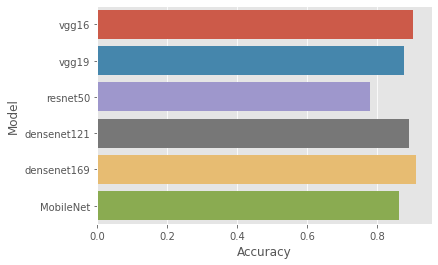

In [ ]:
rim_one_dl_trsfer_lr()

Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:224 Width:224
Building CapsNet on top of vgg16
58900480/58889256 [==============================] - 1s 0us/step
Adding capsule layer on vgg16 
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                         

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.89362, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.89362

Epoch 3: val_accuracy improved from 0.89362 to 0.92908, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.92908 to 0.93617, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.93617

Epoch 6: val_accuracy did not improve from 0.93617

Epoch 7: val_accuracy improved from 0.93617 to 0.94326, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.94326

Epoch 9: val_accuracy did not improve from 0.94326

Epoch 10: val_accuracy did not improve from 0.94326

Epoch 11: val_accuracy did not improve from 0.94326

Epoch 12: val_accuracy did not improve from 0.94326

Epoch 13: val_accuracy improved from 0.94326 to 0.95745, saving model to ./result/weights.h5

Epoch 14: val_accuracy did not improve from 0.95745

Epoch 15: val_accuracy did not improve from 0.95745

Epoch 16: v

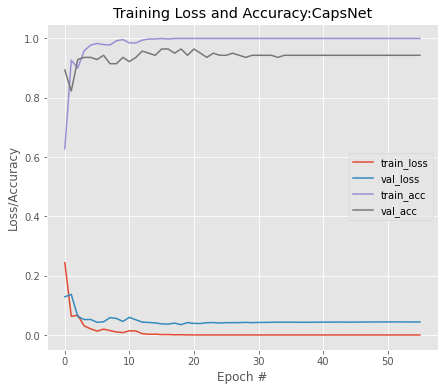

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.964539,0.964912,0.948276,0.956522,0.96209,0.948276,0.975904


Building CapsNet on top of vgg19
80150528/80134624 [==============================] - 2s 0us/step
Adding capsule layer on vgg19 
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (32, 112, 112, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (32, 112, 112, 128)       147584 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.85816, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.85816 to 0.90780, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.90780

Epoch 4: val_accuracy did not improve from 0.90780

Epoch 5: val_accuracy improved from 0.90780 to 0.91489, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.91489 to 0.92908, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.92908 to 0.94326, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.94326

Epoch 9: val_accuracy did not improve from 0.94326

Epoch 10: val_accuracy improved from 0.94326 to 0.95035, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.95035

Epoch 12: val_accuracy did not improve from 0.95035

Epoch 13: val_accuracy did not improve from 0.95035

Epoch 14: val_accuracy did not improve from 0.95035

Epoch 15: val_accuracy 

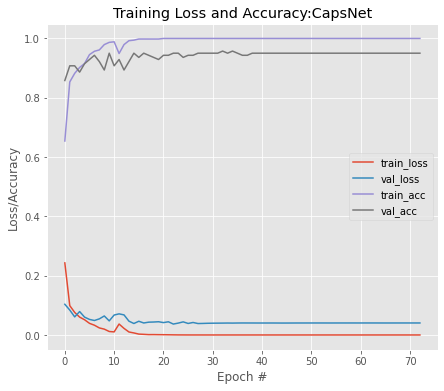

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg19,0.957447,0.933333,0.965517,0.949153,0.958662,0.965517,0.951807


Building CapsNet on top of resnet50
94781440/94765736 [==============================] - 3s 0us/step
Adding capsule layer on resnet50 
Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (32, 230, 230, 3)    0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (32, 112, 112, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (32, 112, 112, 64)   256

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.58865

Epoch 3: val_accuracy did not improve from 0.58865

Epoch 4: val_accuracy did not improve from 0.58865

Epoch 5: val_accuracy did not improve from 0.58865

Epoch 6: val_accuracy did not improve from 0.58865

Epoch 7: val_accuracy did not improve from 0.58865

Epoch 8: val_accuracy improved from 0.58865 to 0.62411, saving model to ./result/weights.h5

Epoch 9: val_accuracy did not improve from 0.62411

Epoch 10: val_accuracy did not improve from 0.62411

Epoch 11: val_accuracy did not improve from 0.62411

Epoch 12: val_accuracy did not improve from 0.62411

Epoch 13: val_accuracy did not improve from 0.62411

Epoch 14: val_accuracy did not improve from 0.62411

Epoch 15: val_accuracy did not improve from 0.62411

Epoch 16: val_accuracy did not improve from 0.62411

Epoch 17: val_accuracy did not improve from 0.62411

Epoch 18: val_accuracy did n

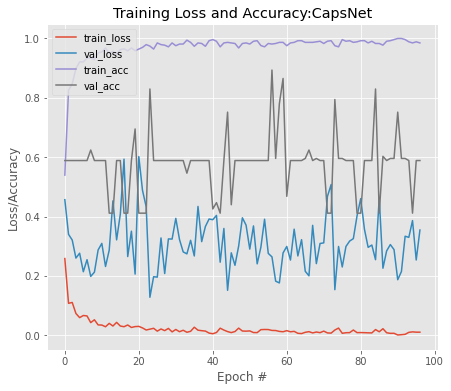

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,resnet50,0.893617,0.820896,0.948276,0.88,0.901849,0.948276,0.855422


Building CapsNet on top of densenet121
29097984/29084464 [==============================] - 0s 0us/step
Adding capsule layer on densenet121 
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (32, 230, 230, 3)   0           ['input_4[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d[0][0]']         
                                                                                                  
 conv1/bn (BatchNormalization)  (32, 112, 112, 64)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.58865 to 0.92199, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.92199 to 0.92908, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.92908 to 0.93617, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.93617 to 0.95035, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.95035

Epoch 7: val_accuracy did not improve from 0.95035

Epoch 8: val_accuracy did not improve from 0.95035

Epoch 9: val_accuracy did not improve from 0.95035

Epoch 10: val_accuracy did not improve from 0.95035

Epoch 11: val_accuracy did not improve from 0.95035

Epoch 12: val_accuracy did not improve from 0.95035

Epoch 13: val_accuracy did not improve from 0.95035

Epoch 14: val_accuracy did not improve from 0.95035

Epoch 15: val_accuracy did not improve from 0.95035

Epoch 16: v

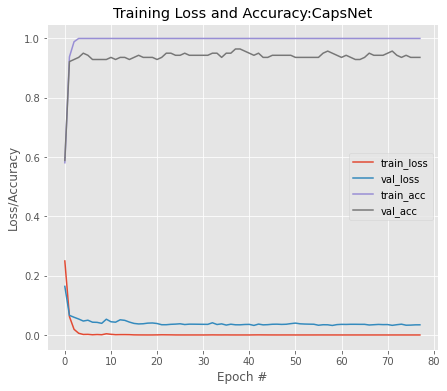

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet121,0.964539,0.964912,0.948276,0.956522,0.96209,0.948276,0.975904


Building CapsNet on top of densenet169
51888128/51877672 [==============================] - 0s 0us/step
Adding capsule layer on densenet169 
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (32, 230, 230, 3)   0           ['input_5[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d_2[0][0]']       
                                                  

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.88652, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.88652 to 0.93617, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.93617 to 0.95745, saving model to ./result/weights.h5

Epoch 4: val_accuracy did not improve from 0.95745

Epoch 5: val_accuracy did not improve from 0.95745

Epoch 6: val_accuracy did not improve from 0.95745

Epoch 7: val_accuracy did not improve from 0.95745

Epoch 8: val_accuracy did not improve from 0.95745

Epoch 9: val_accuracy did not improve from 0.95745

Epoch 10: val_accuracy did not improve from 0.95745

Epoch 11: val_accuracy did not improve from 0.95745

Epoch 12: val_accuracy did not improve from 0.95745

Epoch 13: val_accuracy did not improve from 0.95745

Epoch 14: val_accuracy did not improve from 0.95745

Epoch 15: val_accuracy did not improve from 0.95745

Epoch 16: val_accuracy did not improve from 0.95745

Epoch 17: val_accuracy did not improve f

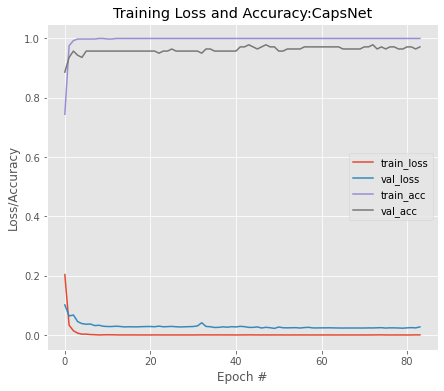

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet169,0.978723,0.95082,1.0,0.97479,0.981928,1.0,0.963855


Building CapsNet on top of MobileNet
17235968/17225924 [==============================] - 0s 0us/step
Adding capsule layer on MobileNet 
Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 conv1 (Conv2D)              (32, 112, 112, 32)        864       
                                                                 
 conv1_bn (BatchNormalizatio  (32, 112, 112, 32)       128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (32, 112, 112, 32)        0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (32, 112, 112, 32)       288       
                                                      

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.58865 to 0.63121, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.63121 to 0.90780, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.90780 to 0.94326, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.94326

Epoch 6: val_accuracy did not improve from 0.94326

Epoch 7: val_accuracy did not improve from 0.94326

Epoch 8: val_accuracy improved from 0.94326 to 0.95745, saving model to ./result/weights.h5

Epoch 9: val_accuracy did not improve from 0.95745

Epoch 10: val_accuracy did not improve from 0.95745

Epoch 11: val_accuracy did not improve from 0.95745

Epoch 12: val_accuracy improved from 0.95745 to 0.96454, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.96454

Epoch 14: val_accuracy improved from 0.96454 to 0.97163, saving model to ./r

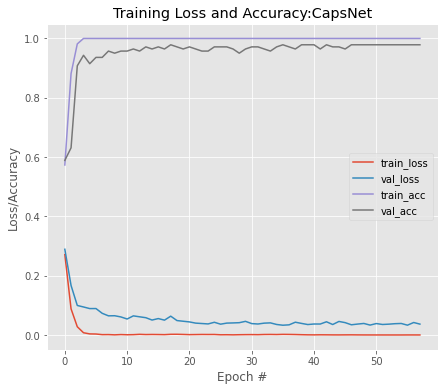

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,MobileNet,0.978723,0.966102,0.982759,0.974359,0.979331,0.982759,0.975904


Building CapsNet on top of InceptionV3
87924736/87910968 [==============================] - 0s 0us/step
Adding capsule layer on InceptionV3 
Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (32, 111, 111, 32)   864         ['input_7[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (32, 111, 111, 32)  96          ['conv2d[0][0]']                 
 alization)                                                                                       
                                                  

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.58865 to 0.72340, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.72340

Epoch 4: val_accuracy improved from 0.72340 to 0.73759, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.73759 to 0.75177, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.75177

Epoch 7: val_accuracy improved from 0.75177 to 0.82270, saving model to ./result/weights.h5

Epoch 8: val_accuracy improved from 0.82270 to 0.85106, saving model to ./result/weights.h5

Epoch 9: val_accuracy did not improve from 0.85106

Epoch 10: val_accuracy did not improve from 0.85106

Epoch 11: val_accuracy did not improve from 0.85106

Epoch 12: val_accuracy did not improve from 0.85106

Epoch 13: val_accuracy did not improve from 0.85106

Epoch 14: val_accuracy did not improve from 0.85106

Epoch 15: val_accuracy 

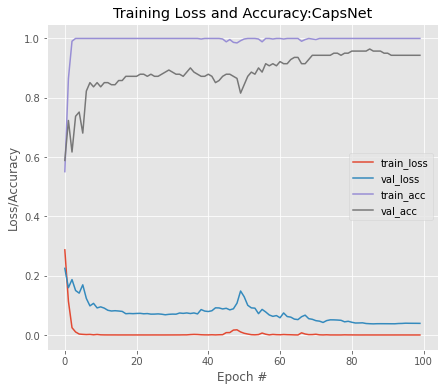

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,InceptionV3,0.964539,0.934426,0.982759,0.957983,0.967283,0.982759,0.951807


,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.964539,0.964912,0.948276,0.956522,0.962090,0.948276,0.975904
1,vgg19,0.957447,0.933333,0.965517,0.949153,0.958662,0.965517,0.951807
2,resnet50,0.893617,0.820896,0.948276,0.880000,0.901849,0.948276,0.855422
3,densenet121,0.964539,0.964912,0.948276,0.956522,0.962090,0.948276,0.975904
4,densenet169,0.978723,0.950820,1.000000,0.974790,0.981928,1.000000,0.963855
5,MobileNet,0.978723,0.966102,0.982759,0.974359,0.979331,0.982759,0.975904
6,InceptionV3,0.964539,0.934426,0.982759,0.957983,0.967283,0.982759,0.951807


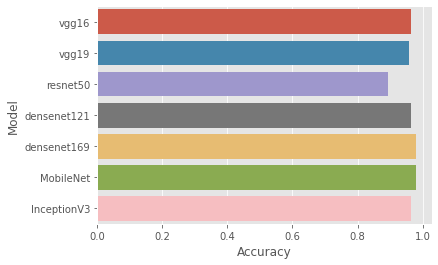

In [ ]:
acrima_trsfer_lr()

Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:224 Width:224
Building CapsNet on top of vgg16
Adding capsule layer on vgg16 
Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                                                                 
 block2_conv1 (Conv2D)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.58865

Epoch 3: val_accuracy improved from 0.58865 to 0.85816, saving model to ./result/weights.h5

Epoch 4: val_accuracy did not improve from 0.85816

Epoch 5: val_accuracy did not improve from 0.85816

Epoch 6: val_accuracy improved from 0.85816 to 0.89362, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.89362 to 0.90780, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.90780

Epoch 9: val_accuracy did not improve from 0.90780

Epoch 10: val_accuracy did not improve from 0.90780

Epoch 11: val_accuracy improved from 0.90780 to 0.91489, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.91489

Epoch 13: val_accuracy did not improve from 0.91489

Epoch 14: val_accuracy did not improve from 0.91489

Epoch 15: val_accuracy improved from 0.91489 to 0.93617, saving 

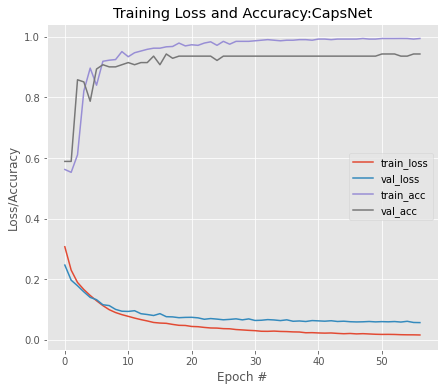

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.943262,0.903226,0.965517,0.933333,0.946614,0.965517,0.927711


Building CapsNet on top of vgg19
Adding capsule layer on vgg19 
Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (32, 112, 112, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (32, 112, 112, 128)       147584    
                                                             

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.58865

Epoch 3: val_accuracy improved from 0.58865 to 0.78723, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.78723 to 0.86525, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.86525

Epoch 6: val_accuracy did not improve from 0.86525

Epoch 7: val_accuracy did not improve from 0.86525

Epoch 8: val_accuracy did not improve from 0.86525

Epoch 9: val_accuracy improved from 0.86525 to 0.88652, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.88652

Epoch 11: val_accuracy did not improve from 0.88652

Epoch 12: val_accuracy did not improve from 0.88652

Epoch 13: val_accuracy did not improve from 0.88652

Epoch 14: val_accuracy did not improve from 0.88652

Epoch 15: val_accuracy did not improve from 0.88652

Epoch 16: val_accuracy did not improve from 0.88652


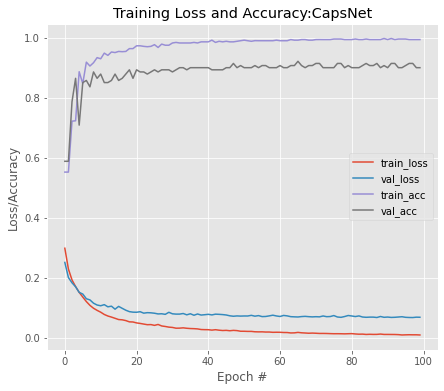

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg19,0.921986,0.885246,0.931034,0.907563,0.923349,0.931034,0.915663


Building CapsNet on top of resnet50
Adding capsule layer on resnet50 
Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (32, 230, 230, 3)    0           ['input_10[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (32, 112, 112, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (32, 112, 112, 64)   256         ['conv1_conv[0][0]']             
                      

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.58865

Epoch 3: val_accuracy did not improve from 0.58865

Epoch 4: val_accuracy improved from 0.58865 to 0.75887, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.75887

Epoch 6: val_accuracy did not improve from 0.75887

Epoch 7: val_accuracy did not improve from 0.75887

Epoch 8: val_accuracy did not improve from 0.75887

Epoch 9: val_accuracy did not improve from 0.75887

Epoch 10: val_accuracy did not improve from 0.75887

Epoch 11: val_accuracy did not improve from 0.75887

Epoch 12: val_accuracy did not improve from 0.75887

Epoch 13: val_accuracy improved from 0.75887 to 0.83688, saving model to ./result/weights.h5

Epoch 14: val_accuracy did not improve from 0.83688

Epoch 15: val_accuracy did not improve from 0.83688

Epoch 16: val_accuracy did not improve from 0.83688

Epoch 17: val_accuracy did not improve f

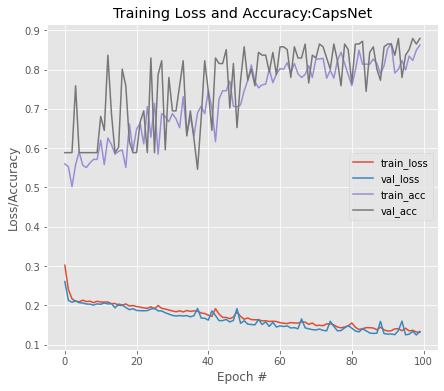

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,resnet50,0.879433,0.797101,0.948276,0.866142,0.889801,0.948276,0.831325


Building CapsNet on top of densenet121
Adding capsule layer on densenet121 
Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d_4 (ZeroPadding2  (32, 230, 230, 3)   0           ['input_11[0][0]']               
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d_4[0][0]']       
                                                                                                  
 conv1/bn (Batc

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.58865 to 0.90780, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.90780 to 0.91489, saving model to ./result/weights.h5

Epoch 4: val_accuracy did not improve from 0.91489

Epoch 5: val_accuracy did not improve from 0.91489

Epoch 6: val_accuracy improved from 0.91489 to 0.92199, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.92199 to 0.92908, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.92908

Epoch 9: val_accuracy did not improve from 0.92908

Epoch 10: val_accuracy did not improve from 0.92908

Epoch 11: val_accuracy did not improve from 0.92908

Epoch 12: val_accuracy improved from 0.92908 to 0.93617, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.93617

Epoch 14: val_accuracy did not improve from 0.93617

Epoch 15: val_accuracy 

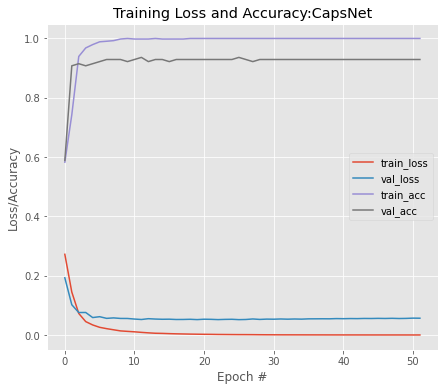

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet121,0.93617,0.876923,0.982759,0.926829,0.943187,0.982759,0.903614


Building CapsNet on top of densenet169
Adding capsule layer on densenet169 
Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_12 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d_6 (ZeroPadding2  (32, 230, 230, 3)   0           ['input_12[0][0]']               
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d_6[0][0]']       
                                                                                                  
 conv1/bn (Batc

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.58865 to 0.90780, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.90780

Epoch 4: val_accuracy did not improve from 0.90780

Epoch 5: val_accuracy improved from 0.90780 to 0.91489, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.91489

Epoch 7: val_accuracy improved from 0.91489 to 0.92908, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.92908

Epoch 9: val_accuracy did not improve from 0.92908

Epoch 10: val_accuracy improved from 0.92908 to 0.93617, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.93617

Epoch 12: val_accuracy did not improve from 0.93617

Epoch 13: val_accuracy did not improve from 0.93617

Epoch 14: val_accuracy did not improve from 0.93617

Epoch 15: val_accuracy did not improve from 0.93617

Epoch 16: v

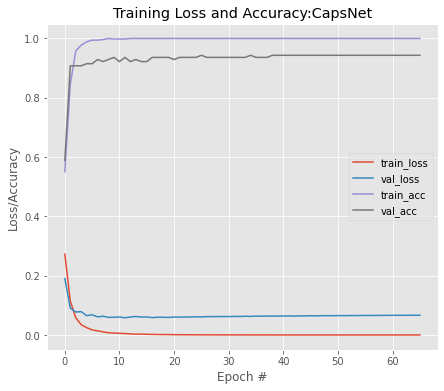

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet169,0.943262,0.916667,0.948276,0.932203,0.944017,0.948276,0.939759


Building CapsNet on top of MobileNet
Adding capsule layer on MobileNet 
Model: "model_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_13 (InputLayer)       [(32, 224, 224, 3)]       0         
                                                                 
 conv1 (Conv2D)              (32, 112, 112, 32)        864       
                                                                 
 conv1_bn (BatchNormalizatio  (32, 112, 112, 32)       128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (32, 112, 112, 32)        0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (32, 112, 112, 32)       288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (32, 112, 112, 32)    

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.58865 to 0.80851, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.80851 to 0.88652, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.88652 to 0.89362, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.89362

Epoch 6: val_accuracy improved from 0.89362 to 0.93617, saving model to ./result/weights.h5

Epoch 7: val_accuracy did not improve from 0.93617

Epoch 8: val_accuracy did not improve from 0.93617

Epoch 9: val_accuracy did not improve from 0.93617

Epoch 10: val_accuracy did not improve from 0.93617

Epoch 11: val_accuracy did not improve from 0.93617

Epoch 12: val_accuracy did not improve from 0.93617

Epoch 13: val_accuracy did not improve from 0.93617

Epoch 14: val_accuracy did not improve from 0.93617

Epoch 15: val_accuracy did not improve from 0.93617

Epoch 16: v

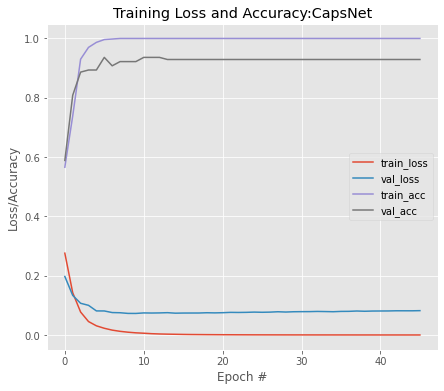

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,MobileNet,0.93617,0.915254,0.931034,0.923077,0.935397,0.931034,0.939759


Building CapsNet on top of InceptionV3
Adding capsule layer on InceptionV3 
Model: "model_13"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_14 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv2d_94 (Conv2D)             (32, 111, 111, 32)   864         ['input_14[0][0]']               
                                                                                                  
 batch_normalization_94 (BatchN  (32, 111, 111, 32)  96          ['conv2d_94[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_94 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.70922, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.70922 to 0.75887, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.75887

Epoch 4: val_accuracy improved from 0.75887 to 0.79433, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.79433

Epoch 6: val_accuracy improved from 0.79433 to 0.83688, saving model to ./result/weights.h5

Epoch 7: val_accuracy did not improve from 0.83688

Epoch 8: val_accuracy did not improve from 0.83688

Epoch 9: val_accuracy did not improve from 0.83688

Epoch 10: val_accuracy improved from 0.83688 to 0.85106, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.85106

Epoch 12: val_accuracy did not improve from 0.85106

Epoch 13: val_accuracy did not improve from 0.85106

Epoch 14: val_accuracy did not improve from 0.85106

Epoch 15: val_accuracy did not improve from 0.85106

Epoch 16: v

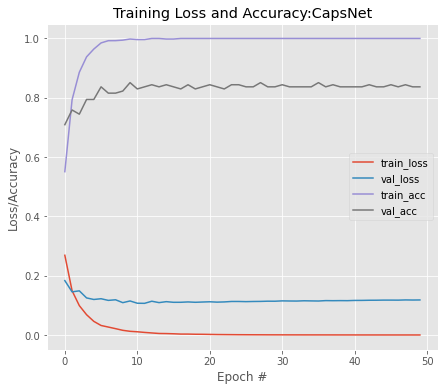

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,InceptionV3,0.851064,0.753425,0.948276,0.839695,0.865704,0.948276,0.783133


,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.943262,0.903226,0.965517,0.933333,0.946614,0.965517,0.927711
1,vgg19,0.921986,0.885246,0.931034,0.907563,0.923349,0.931034,0.915663
2,resnet50,0.879433,0.797101,0.948276,0.866142,0.889801,0.948276,0.831325
3,densenet121,0.936170,0.876923,0.982759,0.926829,0.943187,0.982759,0.903614
4,densenet169,0.943262,0.916667,0.948276,0.932203,0.944017,0.948276,0.939759
5,MobileNet,0.936170,0.915254,0.931034,0.923077,0.935397,0.931034,0.939759
6,InceptionV3,0.851064,0.753425,0.948276,0.839695,0.865704,0.948276,0.783133


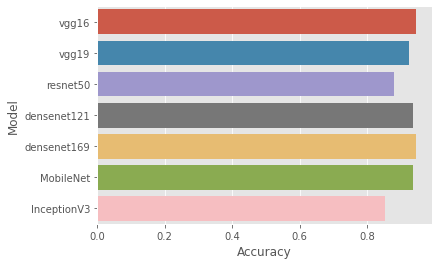

In [ ]:
acrima_trsfer_lr(train_pre_trained=False)

2 - May -2022

In [ ]:
def rim_one_v2_trsfer_lr_ex(train_half_model = False, hist_eq = False):
   model_performances = {}
   args = get_arguments()
   args.batch_size = 32
   args.epochs = 200
   args.routings = 8
   data = get_rim_one_db_r2(224,224, histogram_eq=hist_eq)
   model_performances['vgg16'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="vgg16",train_half_model=train_half_model)
   model_performances['vgg19'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="vgg19",train_half_model=train_half_model)
   model_performances['resnet50'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="resnet50",train_half_model=train_half_model)
   model_performances['densenet121'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="densenet121",train_half_model=train_half_model)
   model_performances['densenet169'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="densenet169",train_half_model=train_half_model)
   model_performances['InceptionV3'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="InceptionV3",train_half_model=train_half_model)
   model_performances['MobileNet'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="MobileNet",train_half_model=train_half_model)
   plot_performance(model_performances)

In [ ]:
def rim_one_v2_trsfer_lr_ex(train_half_model = False, hist_eq = False):
   model_performances = {}
   args = get_arguments()
   args.batch_size = 32
   args.epochs = 200
   args.routings = 8
   data = get_rim_one_db_r2(299,299, histogram_eq=hist_eq)
   #model_performances['vgg16'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="vgg16",train_half_model=train_half_model)
   #model_performances['vgg19'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="vgg19",train_half_model=train_half_model)
   #model_performances['resnet50'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="resnet50",train_half_model=train_half_model)
   #model_performances['densenet121'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="densenet121",train_half_model=train_half_model)
   #model_performances['densenet169'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="densenet169",train_half_model=train_half_model)
   model_performances['InceptionV3'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="InceptionV3",train_half_model=train_half_model)
   model_performances['Xception'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="Xception",train_half_model=train_half_model)
   #model_performances['MobileNet'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="MobileNet",train_half_model=train_half_model)
   #model_performances['MobileNetV2'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="MobileNetV2",train_half_model=train_half_model)
   #model_performances['MobileNet'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="MobileNet",train_half_model=train_half_model)
   plot_performance(model_performances)

Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:224 Width:224
Building CapsNet on top of vgg16
58900480/58889256 [==============================] - 0s 0us/step
Adding capsule layer on vgg16 
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                         

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy improved from 0.54945 to 0.70330, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.70330 to 0.72527, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.72527 to 0.74725, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.74725 to 0.76923, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.76923

Epoch 9: val_accuracy did not improve from 0.76923

Epoch 10: val_accuracy did not improve from 0.76923

Epoch 11: val_accuracy did not improve from 0.76923

Epoch 12: val_accuracy improved from 0.76923 to 0.79121, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.79121

Epoch 14: val_accuracy did not improve from 0.79121

Epoch 15: val_accuracy 

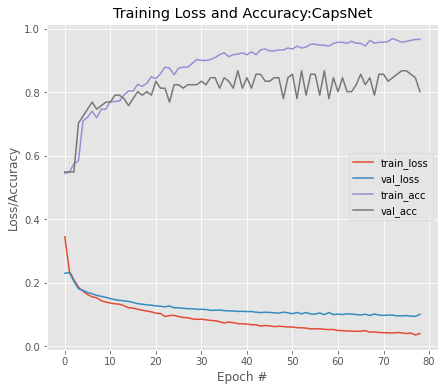

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.868132,0.871795,0.829268,0.85,0.864634,0.829268,0.9


Building CapsNet on top of vgg19
80150528/80134624 [==============================] - 2s 0us/step
Adding capsule layer on vgg19 
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (32, 112, 112, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (32, 112, 112, 128)       147584 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy improved from 0.54945 to 0.70330, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.70330

Epoch 6: val_accuracy did not improve from 0.70330

Epoch 7: val_accuracy improved from 0.70330 to 0.72527, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.72527

Epoch 9: val_accuracy improved from 0.72527 to 0.73626, saving model to ./result/weights.h5

Epoch 10: val_accuracy improved from 0.73626 to 0.74725, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.74725 to 0.76923, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.76923

Epoch 13: val_accuracy did not improve from 0.76923

Epoch 14: val_accuracy did not improve from 0.76923

Epoch 15: val_accuracy 

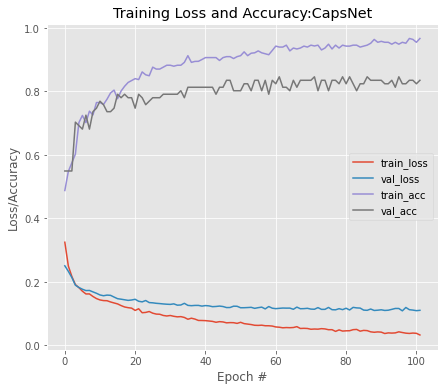

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg19,0.846154,0.846154,0.804878,0.825,0.842439,0.804878,0.88


Building CapsNet on top of resnet50
94781440/94765736 [==============================] - 1s 0us/step
Adding capsule layer on resnet50 
Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (32, 230, 230, 3)    0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (32, 112, 112, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (32, 112, 112, 64)   256

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy did not improve from 0.54945

Epoch 5: val_accuracy did not improve from 0.54945

Epoch 6: val_accuracy did not improve from 0.54945

Epoch 7: val_accuracy did not improve from 0.54945

Epoch 8: val_accuracy did not improve from 0.54945

Epoch 9: val_accuracy did not improve from 0.54945

Epoch 10: val_accuracy did not improve from 0.54945

Epoch 11: val_accuracy did not improve from 0.54945

Epoch 12: val_accuracy did not improve from 0.54945

Epoch 13: val_accuracy did not improve from 0.54945

Epoch 14: val_accuracy did not improve from 0.54945

Epoch 15: val_accuracy did not improve from 0.54945

Epoch 16: val_accuracy did not improve from 0.54945

Epoch 17: val_accuracy did not improve from 0.54945

Epoch 18: val_accuracy did not improve from 0.54945

Epoch 19: val_ac

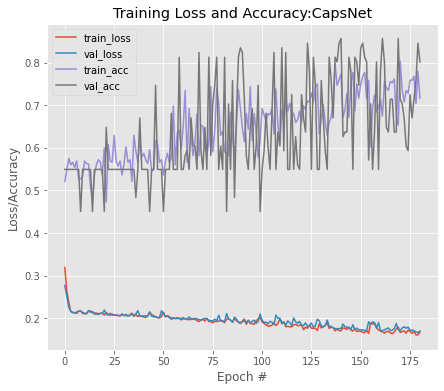

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,resnet50,0.857143,0.888889,0.780488,0.831169,0.850244,0.780488,0.92


Building CapsNet on top of densenet121
29097984/29084464 [==============================] - 1s 0us/step
Adding capsule layer on densenet121 
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (32, 230, 230, 3)   0           ['input_4[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d[0][0]']         
                                                                                                  
 conv1/bn (BatchNormalization)  (32, 112, 112, 64)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.60440, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.60440 to 0.79121, saving model to ./result/weights.h5

Epoch 4: val_accuracy did not improve from 0.79121

Epoch 5: val_accuracy improved from 0.79121 to 0.82418, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.82418 to 0.84615, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.84615 to 0.86813, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.86813

Epoch 9: val_accuracy did not improve from 0.86813

Epoch 10: val_accuracy improved from 0.86813 to 0.87912, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.87912

Epoch 12: val_accuracy did not improve from 0.87912

Epoch 13: val_accuracy improved from 0.87912 to 0.90110, saving model to ./result/weight

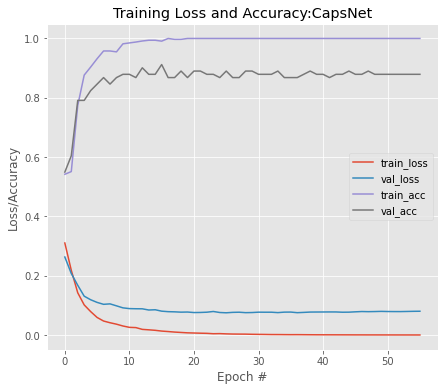

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet121,0.912088,0.923077,0.878049,0.9,0.909024,0.878049,0.94


Building CapsNet on top of densenet169
51888128/51877672 [==============================] - 1s 0us/step
Adding capsule layer on densenet169 
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (32, 230, 230, 3)   0           ['input_5[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d_2[0][0]']       
                                                  

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.67033, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.67033 to 0.76923, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.76923 to 0.85714, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.85714

Epoch 6: val_accuracy did not improve from 0.85714

Epoch 7: val_accuracy improved from 0.85714 to 0.87912, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.87912

Epoch 9: val_accuracy did not improve from 0.87912

Epoch 10: val_accuracy did not improve from 0.87912

Epoch 11: val_accuracy did not improve from 0.87912

Epoch 12: val_accuracy did not improve from 0.87912

Epoch 13: val_accuracy improved from 0.87912 to 0.90110, saving model to ./result/weights.h5

Epoch 14: val_accuracy did not improve from 0.90110

Epoch 15: val_accuracy 

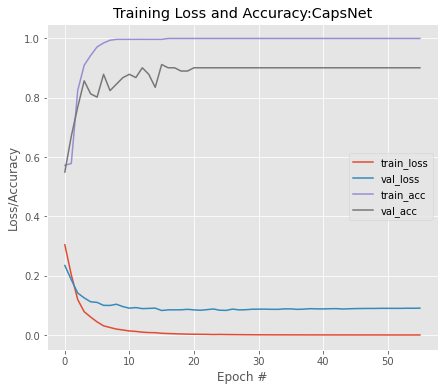

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet169,0.912088,0.902439,0.902439,0.902439,0.91122,0.902439,0.92


Building CapsNet on top of InceptionV3
87924736/87910968 [==============================] - 0s 0us/step
Adding capsule layer on InceptionV3 
Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (32, 111, 111, 32)   864         ['input_6[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (32, 111, 111, 32)  96          ['conv2d[0][0]']                 
 alization)                                                                                       
                                                  

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.74725, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.74725

Epoch 4: val_accuracy improved from 0.74725 to 0.80220, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.80220

Epoch 6: val_accuracy improved from 0.80220 to 0.81319, saving model to ./result/weights.h5

Epoch 7: val_accuracy did not improve from 0.81319

Epoch 8: val_accuracy did not improve from 0.81319

Epoch 9: val_accuracy did not improve from 0.81319

Epoch 10: val_accuracy did not improve from 0.81319

Epoch 11: val_accuracy improved from 0.81319 to 0.82418, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.82418

Epoch 13: val_accuracy did not improve from 0.82418

Epoch 14: val_accuracy did not improve from 0.82418

Epoch 15: val_accuracy did not improve from 0.82418

Epoch 16: v

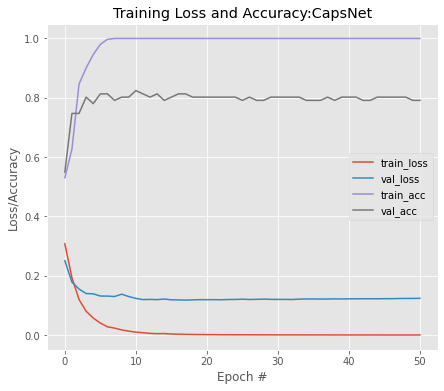

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,InceptionV3,0.824176,0.804878,0.804878,0.804878,0.822439,0.804878,0.84


Building CapsNet on top of MobileNet
17235968/17225924 [==============================] - 1s 0us/step
Adding capsule layer on MobileNet 
Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 conv1 (Conv2D)              (32, 112, 112, 32)        864       
                                                                 
 conv1_bn (BatchNormalizatio  (32, 112, 112, 32)       128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (32, 112, 112, 32)        0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (32, 112, 112, 32)       288       
                                                      

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.67033, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.67033 to 0.83516, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.83516 to 0.89011, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.89011 to 0.90110, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.90110

Epoch 7: val_accuracy did not improve from 0.90110

Epoch 8: val_accuracy did not improve from 0.90110

Epoch 9: val_accuracy did not improve from 0.90110

Epoch 10: val_accuracy improved from 0.90110 to 0.91209, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.91209

Epoch 12: val_accuracy did not improve from 0.91209

Epoch 13: val_accuracy did not improve from 0.91209

Epoch 14: val_accuracy did not improve from 0.91209

Epoch 15: val_accuracy 

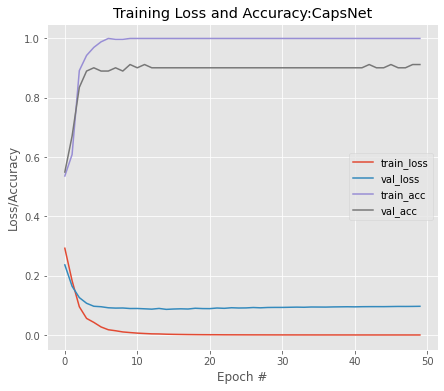

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,MobileNet,0.912088,0.945946,0.853659,0.897436,0.906829,0.853659,0.96


,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.868132,0.871795,0.829268,0.850000,0.864634,0.829268,0.90
1,vgg19,0.846154,0.846154,0.804878,0.825000,0.842439,0.804878,0.88
2,resnet50,0.857143,0.888889,0.780488,0.831169,0.850244,0.780488,0.92
3,densenet121,0.912088,0.923077,0.878049,0.900000,0.909024,0.878049,0.94
4,densenet169,0.912088,0.902439,0.902439,0.902439,0.911220,0.902439,0.92
5,InceptionV3,0.824176,0.804878,0.804878,0.804878,0.822439,0.804878,0.84
6,MobileNet,0.912088,0.945946,0.853659,0.897436,0.906829,0.853659,0.96


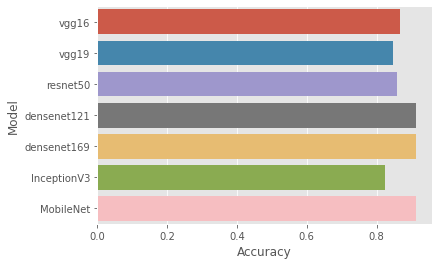

In [ ]:
rim_one_v2_trsfer_lr_ex(train_half_model=False)

Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:224 Width:224
Building CapsNet on top of vgg16
Adding capsule layer on vgg16 
Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                                                                 
 block2_conv1 (Conv2D)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.63736, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.63736 to 0.64835, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.64835 to 0.71429, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.71429 to 0.83516, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.83516

Epoch 6: val_accuracy improved from 0.83516 to 0.84615, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.84615 to 0.86813, saving model to ./result/weights.h5

Epoch 8: val_accuracy improved from 0.86813 to 0.90110, saving model to ./result/weights.h5

Epoch 9: val_accuracy did not improve from 0.90110

Epoch 10: val_accuracy did not improve from 0.90110

Epoch 11: val_accuracy did not improve from 0.90110

Epoch 12: val_accuracy did not improve from 0.90110

Epoch 13: val_accuracy did not improve from 0.90110

Epoch 14: val_accuracy did not impr

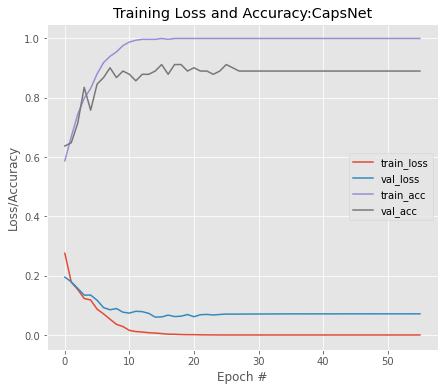

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.912088,0.883721,0.926829,0.904762,0.913415,0.926829,0.9


Building CapsNet on top of vgg19
Adding capsule layer on vgg19 
Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (32, 112, 112, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (32, 112, 112, 128)       147584    
                                                             

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.47253, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.47253 to 0.65934, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.65934

Epoch 4: val_accuracy did not improve from 0.65934

Epoch 5: val_accuracy improved from 0.65934 to 0.72527, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.72527

Epoch 7: val_accuracy improved from 0.72527 to 0.74725, saving model to ./result/weights.h5

Epoch 8: val_accuracy improved from 0.74725 to 0.80220, saving model to ./result/weights.h5

Epoch 9: val_accuracy improved from 0.80220 to 0.82418, saving model to ./result/weights.h5

Epoch 10: val_accuracy improved from 0.82418 to 0.84615, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.84615

Epoch 12: val_accuracy improved from 0.84615 to 0.85714, saving model to ./result/weights.h5

Epoch 13: val_accuracy improved from 0.85714 to

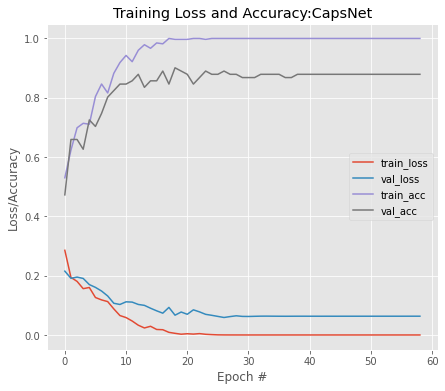

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg19,0.901099,0.944444,0.829268,0.883117,0.894634,0.829268,0.96


Building CapsNet on top of resnet50
Adding capsule layer on resnet50 
Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (32, 230, 230, 3)    0           ['input_10[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (32, 112, 112, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (32, 112, 112, 64)   256         ['conv1_conv[0][0]']             
                      

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy did not improve from 0.54945

Epoch 5: val_accuracy did not improve from 0.54945

Epoch 6: val_accuracy did not improve from 0.54945

Epoch 7: val_accuracy did not improve from 0.54945

Epoch 8: val_accuracy did not improve from 0.54945

Epoch 9: val_accuracy did not improve from 0.54945

Epoch 10: val_accuracy did not improve from 0.54945

Epoch 11: val_accuracy did not improve from 0.54945

Epoch 12: val_accuracy did not improve from 0.54945

Epoch 13: val_accuracy did not improve from 0.54945

Epoch 14: val_accuracy did not improve from 0.54945

Epoch 15: val_accuracy did not improve from 0.54945

Epoch 16: val_accuracy did not improve from 0.54945

Epoch 17: val_accuracy did not improve from 0.54945

Epoch 18: val_accuracy did not improve from 0.54945

Epoch 19: val_ac

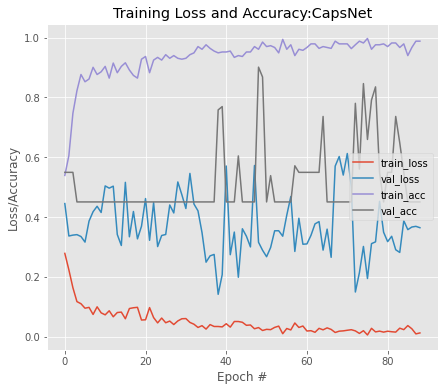

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,resnet50,0.901099,0.944444,0.829268,0.883117,0.894634,0.829268,0.96


Building CapsNet on top of densenet121
Adding capsule layer on densenet121 
Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d_4 (ZeroPadding2  (32, 230, 230, 3)   0           ['input_11[0][0]']               
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d_4[0][0]']       
                                                                                                  
 conv1/bn (Batc

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.58242, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.58242 to 0.69231, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.69231 to 0.73626, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.73626 to 0.80220, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.80220

Epoch 7: val_accuracy did not improve from 0.80220

Epoch 8: val_accuracy did not improve from 0.80220

Epoch 9: val_accuracy did not improve from 0.80220

Epoch 10: val_accuracy did not improve from 0.80220

Epoch 11: val_accuracy improved from 0.80220 to 0.81319, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.81319

Epoch 13: val_accuracy improved from 0.81319 to 0.87912, saving model to ./result/weights.h5

Epoch 14: val_accuracy did not impr

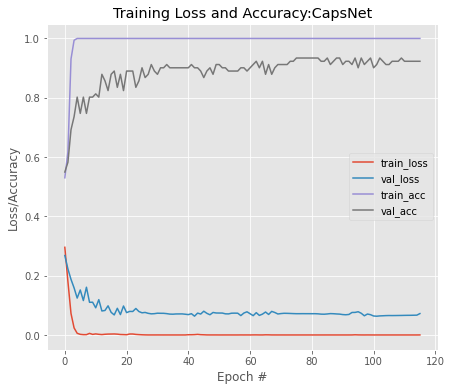

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet121,0.934066,0.972973,0.878049,0.923077,0.929024,0.878049,0.98


Building CapsNet on top of densenet169
Adding capsule layer on densenet169 
Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_12 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d_6 (ZeroPadding2  (32, 230, 230, 3)   0           ['input_12[0][0]']               
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d_6[0][0]']       
                                                                                                  
 conv1/bn (Batc

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.63736, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.63736

Epoch 4: val_accuracy improved from 0.63736 to 0.65934, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.65934 to 0.69231, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.69231

Epoch 7: val_accuracy improved from 0.69231 to 0.78022, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.78022

Epoch 9: val_accuracy did not improve from 0.78022

Epoch 10: val_accuracy improved from 0.78022 to 0.79121, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.79121 to 0.89011, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.89011

Epoch 13: val_accuracy did not improve from 0.89011

Epoch 14: val_accuracy improved fro

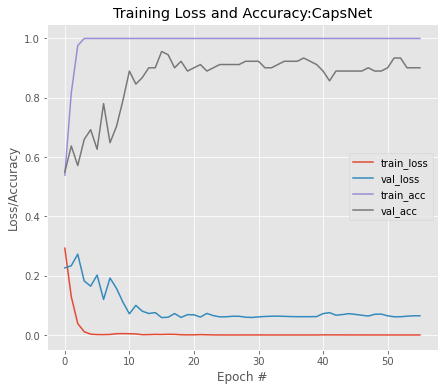

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet169,0.956044,0.95122,0.95122,0.95122,0.95561,0.95122,0.96


Building CapsNet on top of InceptionV3
Adding capsule layer on InceptionV3 
Model: "model_12"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_13 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv2d_94 (Conv2D)             (32, 111, 111, 32)   864         ['input_13[0][0]']               
                                                                                                  
 batch_normalization_94 (BatchN  (32, 111, 111, 32)  96          ['conv2d_94[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_94 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy improved from 0.54945 to 0.57143, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.57143 to 0.60440, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.60440 to 0.62637, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.62637 to 0.64835, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.64835 to 0.73626, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.73626

Epoch 9: val_accuracy improved from 0.73626 to 0.80220, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.80220

Epoch 11: val_accuracy did not improve from 0.80220

Epoch 12: val_accuracy did not improve from 0.80220

Epoch 13: val_accuracy did not improve from 0.80220

Epoch 14: val_accuracy did not impr

In [ ]:
rim_one_v2_trsfer_lr_ex(train_half_model=True)

# 02 - 05 - 2022

In [ ]:
def rim_one_v2_trsfer_lr_ex(train_half_model = False,histogram_eq = False):
   model_performances = {}
   args = get_arguments()
   args.batch_size = 32
   args.epochs = 200
   args.routings = 8
   data = get_rim_one_db_r2(224,224,histogram_eq = histogram_eq)
   model_performances['vgg16'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="vgg16",train_half_model=train_half_model)
   model_performances['vgg19'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="vgg19",train_half_model=train_half_model)
   model_performances['resnet50'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="resnet50",train_half_model=train_half_model)
   model_performances['densenet121'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="densenet121",train_half_model=train_half_model)
   model_performances['densenet169'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="densenet169",train_half_model=train_half_model)
   model_performances['InceptionV3'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="InceptionV3",train_half_model=train_half_model)
   model_performances['MobileNet'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="MobileNet",train_half_model=train_half_model)
   model_performances['MobileNetV2'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="MobileNetV2",train_half_model=train_half_model)

   model_performances['Xception'] = get_model_train_test_transfer_learning(data,args,high_level_model_name="Xception",train_half_model=train_half_model)
   
   plot_performance(model_performances)

Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:224 Width:224
Building CapsNet on top of vgg16
Adding capsule layer on vgg16 
Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                                                                 
 block2_conv1 (Conv2D)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy improved from 0.54945 to 0.70330, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.70330 to 0.72527, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.72527 to 0.74725, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.74725 to 0.76923, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.76923

Epoch 9: val_accuracy did not improve from 0.76923

Epoch 10: val_accuracy did not improve from 0.76923

Epoch 11: val_accuracy did not improve from 0.76923

Epoch 12: val_accuracy improved from 0.76923 to 0.79121, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.79121

Epoch 14: val_accuracy did not improve from 0.79121

Epoch 15: val_accuracy 

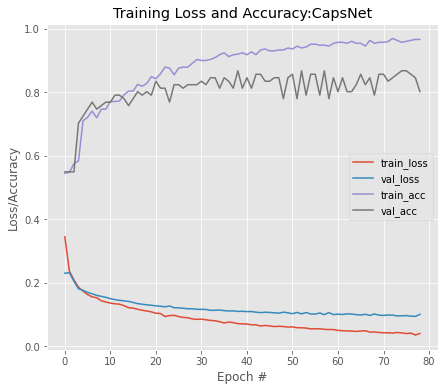

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.868132,0.871795,0.829268,0.85,0.864634,0.829268,0.9


Building CapsNet on top of vgg19
Adding capsule layer on vgg19 
Model: "model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (32, 112, 112, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (32, 112, 112, 128)       147584    
                                                            

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy improved from 0.54945 to 0.70330, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.70330

Epoch 6: val_accuracy did not improve from 0.70330

Epoch 7: val_accuracy improved from 0.70330 to 0.72527, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.72527

Epoch 9: val_accuracy improved from 0.72527 to 0.73626, saving model to ./result/weights.h5

Epoch 10: val_accuracy improved from 0.73626 to 0.74725, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.74725 to 0.76923, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.76923

Epoch 13: val_accuracy did not improve from 0.76923

Epoch 14: val_accuracy did not improve from 0.76923

Epoch 15: val_accuracy 

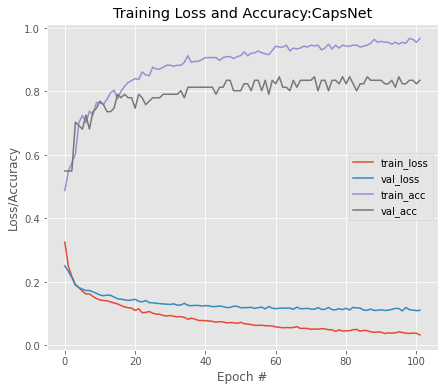

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg19,0.846154,0.846154,0.804878,0.825,0.842439,0.804878,0.88


Building CapsNet on top of resnet50
Adding capsule layer on resnet50 
Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_12 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (32, 230, 230, 3)    0           ['input_12[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (32, 112, 112, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (32, 112, 112, 64)   256         ['conv1_conv[0][0]']             
                     

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy did not improve from 0.54945

Epoch 5: val_accuracy did not improve from 0.54945

Epoch 6: val_accuracy did not improve from 0.54945

Epoch 7: val_accuracy did not improve from 0.54945

Epoch 8: val_accuracy did not improve from 0.54945

Epoch 9: val_accuracy did not improve from 0.54945

Epoch 10: val_accuracy did not improve from 0.54945

Epoch 11: val_accuracy did not improve from 0.54945

Epoch 12: val_accuracy did not improve from 0.54945

Epoch 13: val_accuracy did not improve from 0.54945

Epoch 14: val_accuracy did not improve from 0.54945

Epoch 15: val_accuracy did not improve from 0.54945

Epoch 16: val_accuracy did not improve from 0.54945

Epoch 17: val_accuracy did not improve from 0.54945

Epoch 18: val_accuracy did not improve from 0.54945

Epoch 19: val_ac

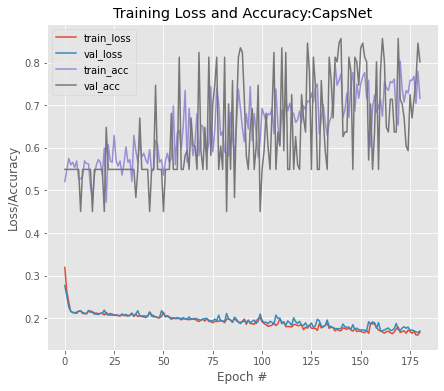

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,resnet50,0.857143,0.888889,0.780488,0.831169,0.850244,0.780488,0.92


Building CapsNet on top of densenet121
Adding capsule layer on densenet121 
Model: "model_12"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_13 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d_4 (ZeroPadding2  (32, 230, 230, 3)   0           ['input_13[0][0]']               
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d_4[0][0]']       
                                                                                                  
 conv1/bn (Batc

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.60440, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.60440 to 0.79121, saving model to ./result/weights.h5

Epoch 4: val_accuracy did not improve from 0.79121

Epoch 5: val_accuracy improved from 0.79121 to 0.82418, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.82418 to 0.84615, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.84615 to 0.86813, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.86813

Epoch 9: val_accuracy did not improve from 0.86813

Epoch 10: val_accuracy improved from 0.86813 to 0.87912, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.87912

Epoch 12: val_accuracy did not improve from 0.87912

Epoch 13: val_accuracy improved from 0.87912 to 0.90110, saving model to ./result/weight

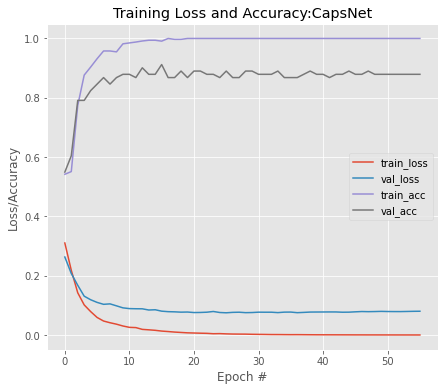

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet121,0.912088,0.923077,0.878049,0.9,0.909024,0.878049,0.94


Building CapsNet on top of densenet169
Adding capsule layer on densenet169 
Model: "model_13"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_14 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d_6 (ZeroPadding2  (32, 230, 230, 3)   0           ['input_14[0][0]']               
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d_6[0][0]']       
                                                                                                  
 conv1/bn (Batc

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.67033, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.67033 to 0.76923, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.76923 to 0.85714, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.85714

Epoch 6: val_accuracy did not improve from 0.85714

Epoch 7: val_accuracy improved from 0.85714 to 0.87912, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.87912

Epoch 9: val_accuracy did not improve from 0.87912

Epoch 10: val_accuracy did not improve from 0.87912

Epoch 11: val_accuracy did not improve from 0.87912

Epoch 12: val_accuracy did not improve from 0.87912

Epoch 13: val_accuracy improved from 0.87912 to 0.90110, saving model to ./result/weights.h5

Epoch 14: val_accuracy did not improve from 0.90110

Epoch 15: val_accuracy 

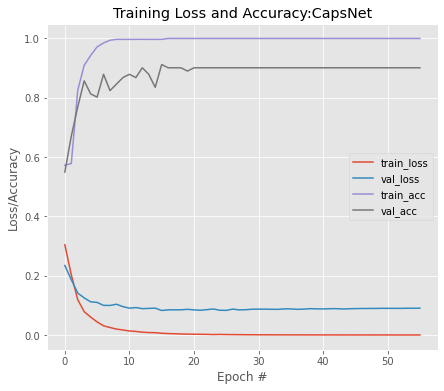

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet169,0.912088,0.902439,0.902439,0.902439,0.91122,0.902439,0.92


Building CapsNet on top of InceptionV3
Adding capsule layer on InceptionV3 
Model: "model_14"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_15 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv2d_98 (Conv2D)             (32, 111, 111, 32)   864         ['input_15[0][0]']               
                                                                                                  
 batch_normalization_98 (BatchN  (32, 111, 111, 32)  96          ['conv2d_98[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_94 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.74725, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.74725

Epoch 4: val_accuracy improved from 0.74725 to 0.80220, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.80220

Epoch 6: val_accuracy improved from 0.80220 to 0.81319, saving model to ./result/weights.h5

Epoch 7: val_accuracy did not improve from 0.81319

Epoch 8: val_accuracy did not improve from 0.81319

Epoch 9: val_accuracy did not improve from 0.81319

Epoch 10: val_accuracy did not improve from 0.81319

Epoch 11: val_accuracy improved from 0.81319 to 0.82418, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.82418

Epoch 13: val_accuracy did not improve from 0.82418

Epoch 14: val_accuracy did not improve from 0.82418

Epoch 15: val_accuracy did not improve from 0.82418

Epoch 16: v

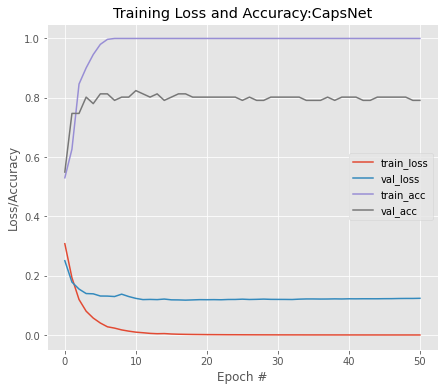

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,InceptionV3,0.824176,0.804878,0.804878,0.804878,0.822439,0.804878,0.84


Building CapsNet on top of MobileNet
Adding capsule layer on MobileNet 
Model: "model_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(32, 224, 224, 3)]       0         
                                                                 
 conv1 (Conv2D)              (32, 112, 112, 32)        864       
                                                                 
 conv1_bn (BatchNormalizatio  (32, 112, 112, 32)       128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (32, 112, 112, 32)        0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (32, 112, 112, 32)       288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (32, 112, 112, 32)    

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.67033, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.67033 to 0.83516, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.83516 to 0.89011, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.89011 to 0.90110, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.90110

Epoch 7: val_accuracy did not improve from 0.90110

Epoch 8: val_accuracy did not improve from 0.90110

Epoch 9: val_accuracy did not improve from 0.90110

Epoch 10: val_accuracy improved from 0.90110 to 0.91209, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.91209

Epoch 12: val_accuracy did not improve from 0.91209

Epoch 13: val_accuracy did not improve from 0.91209

Epoch 14: val_accuracy did not improve from 0.91209

Epoch 15: val_accuracy 

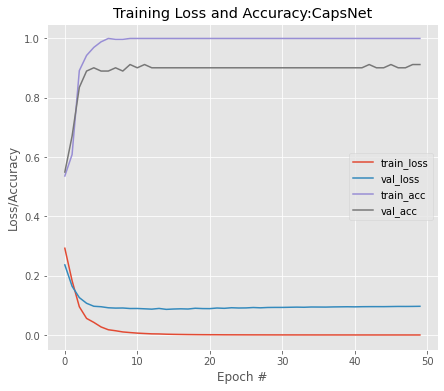

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,MobileNet,0.912088,0.945946,0.853659,0.897436,0.906829,0.853659,0.96


Building CapsNet on top of MobileNetV2
Adding capsule layer on MobileNetV2 
Model: "model_16"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_17 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (32, 112, 112, 32)   864         ['input_17[0][0]']               
                                                                                                  
 bn_Conv1 (BatchNormalization)  (32, 112, 112, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (32, 112, 112, 32)   0           ['bn_Conv1[0][0]']               
               

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.60440, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.60440 to 0.81319, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.81319

Epoch 4: val_accuracy improved from 0.81319 to 0.90110, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.90110

Epoch 6: val_accuracy improved from 0.90110 to 0.91209, saving model to ./result/weights.h5

Epoch 7: val_accuracy did not improve from 0.91209

Epoch 8: val_accuracy did not improve from 0.91209

Epoch 9: val_accuracy did not improve from 0.91209

Epoch 10: val_accuracy improved from 0.91209 to 0.92308, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.92308

Epoch 12: val_accuracy did not improve from 0.92308

Epoch 13: val_accuracy did not improve from 0.92308

Epoch 14: val_accuracy did not improve from 0.92308

Epoch 15: val_accuracy did not improve from 0.92308

Epoch 16: v

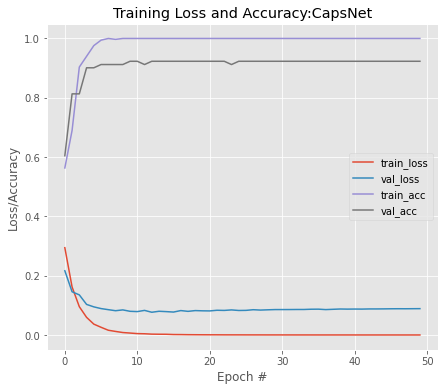

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,MobileNetV2,0.923077,0.904762,0.926829,0.915663,0.923415,0.926829,0.92


Building CapsNet on top of Xception
Adding capsule layer on Xception 
Model: "model_17"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_18 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 block1_conv1 (Conv2D)          (32, 111, 111, 32)   864         ['input_18[0][0]']               
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (32, 111, 111, 32)  128         ['block1_conv1[0][0]']           
 ation)                                                                                           
                                                                                                  
 block1_conv1_act (Ac

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.74725, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.74725

Epoch 4: val_accuracy improved from 0.74725 to 0.82418, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.82418 to 0.84615, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.84615 to 0.85714, saving model to ./result/weights.h5

Epoch 7: val_accuracy did not improve from 0.85714

Epoch 8: val_accuracy improved from 0.85714 to 0.86813, saving model to ./result/weights.h5

Epoch 9: val_accuracy did not improve from 0.86813

Epoch 10: val_accuracy did not improve from 0.86813

Epoch 11: val_accuracy did not improve from 0.86813

Epoch 12: val_accuracy did not improve from 0.86813

Epoch 13: val_accuracy did not improve from 0.86813

Epoch 14: val_accuracy did not improve from 0.86813

Epoch 15: val_accuracy 

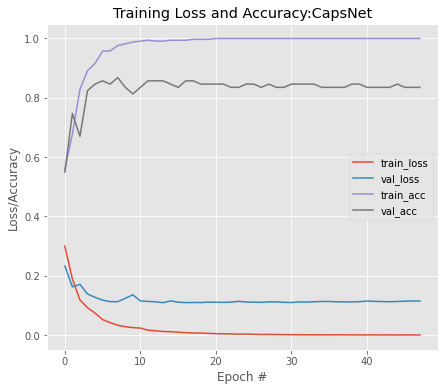

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,Xception,0.868132,0.891892,0.804878,0.846154,0.862439,0.804878,0.92


,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.868132,0.871795,0.829268,0.850000,0.864634,0.829268,0.90
1,vgg19,0.846154,0.846154,0.804878,0.825000,0.842439,0.804878,0.88
2,resnet50,0.857143,0.888889,0.780488,0.831169,0.850244,0.780488,0.92
3,densenet121,0.912088,0.923077,0.878049,0.900000,0.909024,0.878049,0.94
4,densenet169,0.912088,0.902439,0.902439,0.902439,0.911220,0.902439,0.92
5,InceptionV3,0.824176,0.804878,0.804878,0.804878,0.822439,0.804878,0.84
6,MobileNet,0.912088,0.945946,0.853659,0.897436,0.906829,0.853659,0.96
7,MobileNetV2,0.923077,0.904762,0.926829,0.915663,0.923415,0.926829,0.92
8,Xception,0.868132,0.891892,0.804878,0.846154,0.862439,0.804878,0.92


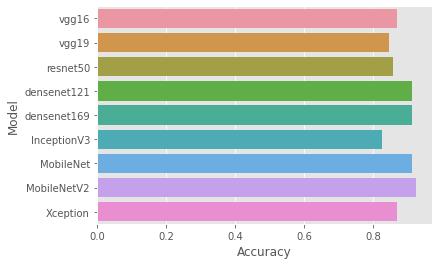

\begin{tabular}{llrrrrrrr}
\toprule
{} &        Model &  Accuracy &  Precision &    Recall &        F1 &       AUC &  Sensitivity &  Specificity \\
\midrule
0 &        vgg16 &  0.868132 &   0.871795 &  0.829268 &  0.850000 &  0.864634 &     0.829268 &         0.90 \\
1 &        vgg19 &  0.846154 &   0.846154 &  0.804878 &  0.825000 &  0.842439 &     0.804878 &         0.88 \\
2 &     resnet50 &  0.857143 &   0.888889 &  0.780488 &  0.831169 &  0.850244 &     0.780488 &         0.92 \\
3 &  densenet121 &  0.912088 &   0.923077 &  0.878049 &  0.900000 &  0.909024 &     0.878049 &         0.94 \\
4 &  densenet169 &  0.912088 &   0.902439 &  0.902439 &  0.902439 &  0.911220 &     0.902439 &         0.92 \\
5 &  InceptionV3 &  0.824176 &   0.804878 &  0.804878 &  0.804878 &  0.822439 &     0.804878 &         0.84 \\
6 &    MobileNet &  0.912088 &   0.945946 &  0.853659 &  0.897436 &  0.906829 &     0.853659 &         0.96 \\
7 &  MobileNetV2 &  0.923077 &   0.904762 &  0.926829 &  0.915663 

In [ ]:
rim_one_v2_trsfer_lr_ex(train_half_model=False)

Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:224 Width:224
Building CapsNet on top of vgg16
58900480/58889256 [==============================] - 0s 0us/step
Adding capsule layer on vgg16 
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                         

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.62637, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.62637 to 0.64835, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.64835 to 0.72527, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.72527 to 0.83516, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.83516

Epoch 6: val_accuracy did not improve from 0.83516

Epoch 7: val_accuracy did not improve from 0.83516

Epoch 8: val_accuracy improved from 0.83516 to 0.87912, saving model to ./result/weights.h5

Epoch 9: val_accuracy improved from 0.87912 to 0.90110, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.90110

Epoch 11: val_accuracy did not improve from 0.90110

Epoch 12: val_accuracy did not improve from 0.90110

Epoch 13: val_accuracy improved from 0.90110 to 0.92308, saving model to ./result/weights.h5

Epoch 14: val_accuracy did not impr

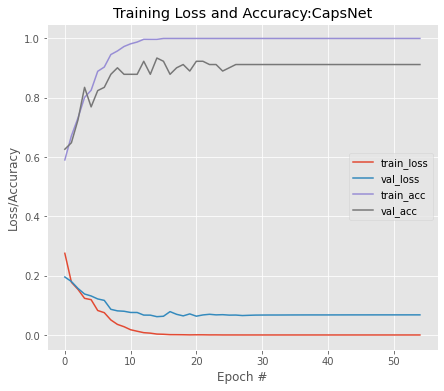

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.934066,0.948718,0.902439,0.925,0.93122,0.902439,0.96


Building CapsNet on top of vgg19
80150528/80134624 [==============================] - 0s 0us/step
Adding capsule layer on vgg19 
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (32, 112, 112, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (32, 112, 112, 128)       147584 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.47253, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.47253 to 0.64835, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.64835 to 0.65934, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.65934 to 0.68132, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.68132 to 0.73626, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.73626

Epoch 7: val_accuracy did not improve from 0.73626

Epoch 8: val_accuracy improved from 0.73626 to 0.78022, saving model to ./result/weights.h5

Epoch 9: val_accuracy did not improve from 0.78022

Epoch 10: val_accuracy improved from 0.78022 to 0.81319, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.81319

Epoch 12: val_accuracy improved from 0.81319 to 0.82418, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.8

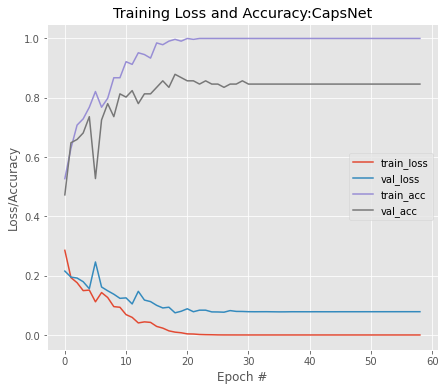

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg19,0.879121,0.875,0.853659,0.864198,0.876829,0.853659,0.9


Building CapsNet on top of resnet50
94781440/94765736 [==============================] - 1s 0us/step
Adding capsule layer on resnet50 
Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (32, 230, 230, 3)    0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (32, 112, 112, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (32, 112, 112, 64)   256

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy did not improve from 0.54945

Epoch 5: val_accuracy did not improve from 0.54945

Epoch 6: val_accuracy did not improve from 0.54945

Epoch 7: val_accuracy did not improve from 0.54945

Epoch 8: val_accuracy did not improve from 0.54945

Epoch 9: val_accuracy did not improve from 0.54945

Epoch 10: val_accuracy did not improve from 0.54945

Epoch 11: val_accuracy did not improve from 0.54945

Epoch 12: val_accuracy did not improve from 0.54945

Epoch 13: val_accuracy did not improve from 0.54945

Epoch 14: val_accuracy did not improve from 0.54945

Epoch 15: val_accuracy did not improve from 0.54945

Epoch 16: val_accuracy did not improve from 0.54945

Epoch 17: val_accuracy did not improve from 0.54945

Epoch 18: val_accuracy did not improve from 0.54945

Epoch 19: val_ac

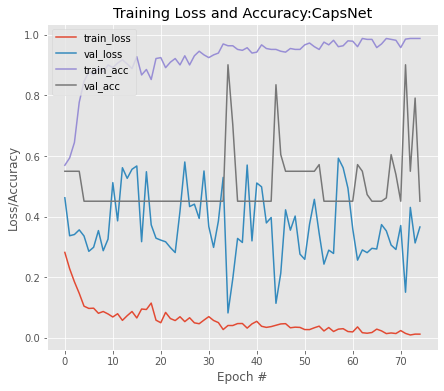

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,resnet50,0.901099,0.921053,0.853659,0.886076,0.896829,0.853659,0.94


Building CapsNet on top of densenet121
29097984/29084464 [==============================] - 0s 0us/step
Adding capsule layer on densenet121 
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (32, 230, 230, 3)   0           ['input_4[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d[0][0]']         
                                                                                                  
 conv1/bn (BatchNormalization)  (32, 112, 112, 64)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.58242, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.58242 to 0.69231, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.69231 to 0.74725, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.74725 to 0.80220, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.80220

Epoch 7: val_accuracy did not improve from 0.80220

Epoch 8: val_accuracy did not improve from 0.80220

Epoch 9: val_accuracy did not improve from 0.80220

Epoch 10: val_accuracy did not improve from 0.80220

Epoch 11: val_accuracy improved from 0.80220 to 0.81319, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.81319

Epoch 13: val_accuracy improved from 0.81319 to 0.89011, saving model to ./result/weights.h5

Epoch 14: val_accuracy did not impr

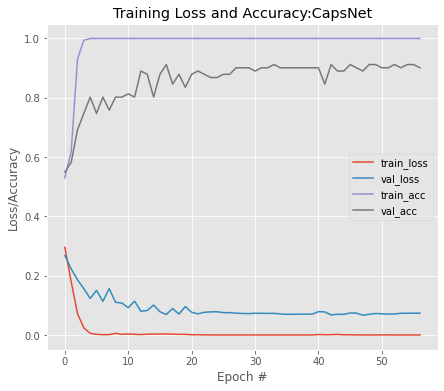

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet121,0.912088,0.971429,0.829268,0.894737,0.904634,0.829268,0.98


Building CapsNet on top of densenet169
51888128/51877672 [==============================] - 0s 0us/step
Adding capsule layer on densenet169 
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (32, 230, 230, 3)   0           ['input_5[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d_2[0][0]']       
                                                  

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.63736, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.63736

Epoch 4: val_accuracy improved from 0.63736 to 0.65934, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.65934 to 0.68132, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.68132

Epoch 7: val_accuracy improved from 0.68132 to 0.78022, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.78022

Epoch 9: val_accuracy did not improve from 0.78022

Epoch 10: val_accuracy improved from 0.78022 to 0.84615, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.84615 to 0.89011, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.89011

Epoch 13: val_accuracy improved from 0.89011 to 0.90110, saving model to ./result/weight

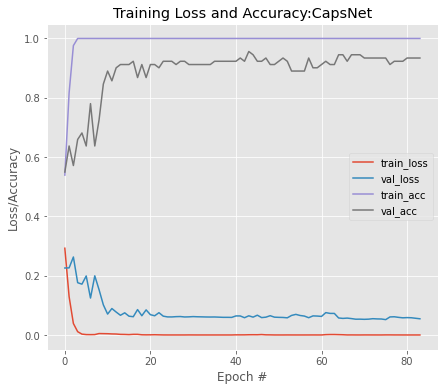

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet169,0.956044,0.95122,0.95122,0.95122,0.95561,0.95122,0.96


Building CapsNet on top of InceptionV3
87924736/87910968 [==============================] - 1s 0us/step
Adding capsule layer on InceptionV3 
Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (32, 111, 111, 32)   864         ['input_6[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (32, 111, 111, 32)  96          ['conv2d[0][0]']                 
 alization)                                                                                       
                                                  

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.56044, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.56044 to 0.57143, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.57143 to 0.62637, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.62637 to 0.65934, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.65934

Epoch 7: val_accuracy improved from 0.65934 to 0.70330, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.70330

Epoch 9: val_accuracy improved from 0.70330 to 0.75824, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.75824

Epoch 11: val_accuracy improved from 0.75824 to 0.76923, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.76923

Epoch 13: val_accuracy did not improve from 0.7

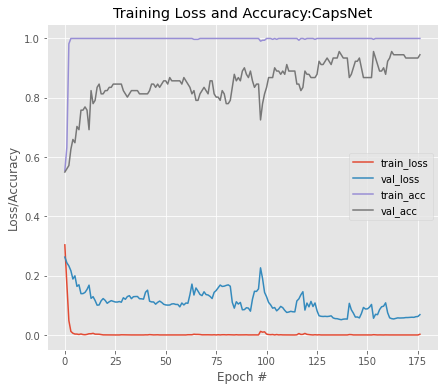

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,InceptionV3,0.956044,0.95122,0.95122,0.95122,0.95561,0.95122,0.96


Building CapsNet on top of MobileNet
17235968/17225924 [==============================] - 0s 0us/step
Adding capsule layer on MobileNet 
Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 conv1 (Conv2D)              (32, 112, 112, 32)        864       
                                                                 
 conv1_bn (BatchNormalizatio  (32, 112, 112, 32)       128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (32, 112, 112, 32)        0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (32, 112, 112, 32)       288       
                                                      

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.79121, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.79121

Epoch 4: val_accuracy did not improve from 0.79121

Epoch 5: val_accuracy did not improve from 0.79121

Epoch 6: val_accuracy did not improve from 0.79121

Epoch 7: val_accuracy did not improve from 0.79121

Epoch 8: val_accuracy did not improve from 0.79121

Epoch 9: val_accuracy improved from 0.79121 to 0.81319, saving model to ./result/weights.h5

Epoch 10: val_accuracy improved from 0.81319 to 0.83516, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.83516

Epoch 12: val_accuracy did not improve from 0.83516

Epoch 13: val_accuracy improved from 0.83516 to 0.86813, saving model to ./result/weights.h5

Epoch 14: val_accuracy did not improve from 0.86813

Epoch 15: val_accuracy did not improve from 0.86813

Epoch 16: v

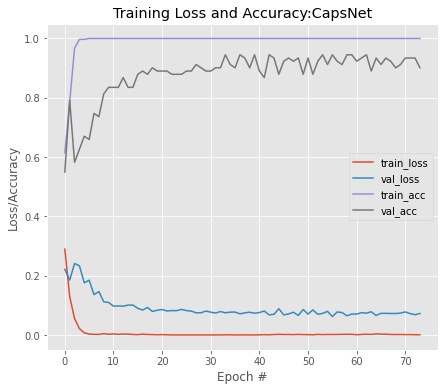

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,MobileNet,0.945055,0.95,0.926829,0.938272,0.943415,0.926829,0.96


Building CapsNet on top of MobileNetV2
9420800/9406464 [==============================] - 0s 0us/step
Adding capsule layer on MobileNetV2 
Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (32, 112, 112, 32)   864         ['input_8[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (32, 112, 112, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (32, 112, 112, 32)  

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.80220, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.80220

Epoch 4: val_accuracy did not improve from 0.80220

Epoch 5: val_accuracy did not improve from 0.80220

Epoch 6: val_accuracy did not improve from 0.80220

Epoch 7: val_accuracy did not improve from 0.80220

Epoch 8: val_accuracy did not improve from 0.80220

Epoch 9: val_accuracy did not improve from 0.80220

Epoch 10: val_accuracy did not improve from 0.80220

Epoch 11: val_accuracy did not improve from 0.80220

Epoch 12: val_accuracy did not improve from 0.80220

Epoch 13: val_accuracy did not improve from 0.80220

Epoch 14: val_accuracy did not improve from 0.80220

Epoch 15: val_accuracy did not improve from 0.80220

Epoch 16: val_accuracy did not improve from 0.80220

Epoch 17: val_accuracy did not improve from 0.80220

Epoch 18: val_accuracy did n

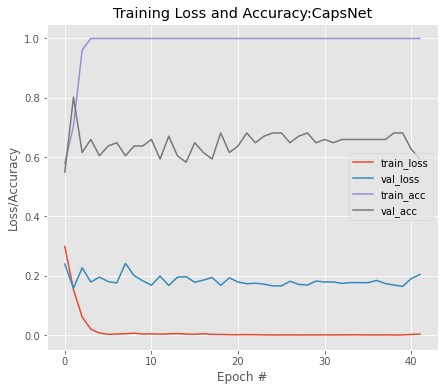

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,MobileNetV2,0.802198,0.848485,0.682927,0.756757,0.791463,0.682927,0.9


Building CapsNet on top of Xception
83697664/83683744 [==============================] - 1s 0us/step
Adding capsule layer on Xception 
Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 block1_conv1 (Conv2D)          (32, 111, 111, 32)   864         ['input_9[0][0]']                
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (32, 111, 111, 32)  128         ['block1_conv1[0][0]']           
 ation)                                                                                           
                                                        

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy improved from 0.54945 to 0.61538, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.61538

Epoch 6: val_accuracy did not improve from 0.61538

Epoch 7: val_accuracy improved from 0.61538 to 0.68132, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.68132

Epoch 9: val_accuracy improved from 0.68132 to 0.69231, saving model to ./result/weights.h5

Epoch 10: val_accuracy improved from 0.69231 to 0.74725, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.74725

Epoch 12: val_accuracy improved from 0.74725 to 0.75824, saving model to ./result/weights.h5

Epoch 13: val_accuracy improved from 0.75824 to 0.78022, saving model to ./result/weights.h5

Epoch 14: val_accuracy did not impr

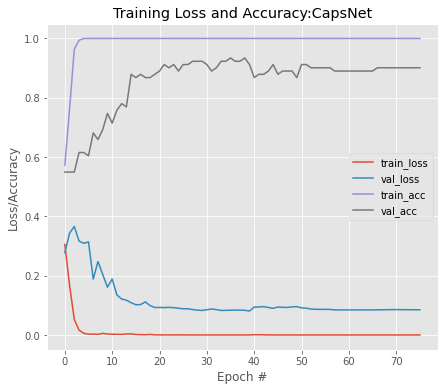

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,Xception,0.934066,0.972973,0.878049,0.923077,0.929024,0.878049,0.98


,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.934066,0.948718,0.902439,0.925000,0.931220,0.902439,0.96
1,vgg19,0.879121,0.875000,0.853659,0.864198,0.876829,0.853659,0.90
2,resnet50,0.901099,0.921053,0.853659,0.886076,0.896829,0.853659,0.94
3,densenet121,0.912088,0.971429,0.829268,0.894737,0.904634,0.829268,0.98
4,densenet169,0.956044,0.951220,0.951220,0.951220,0.955610,0.951220,0.96
5,InceptionV3,0.956044,0.951220,0.951220,0.951220,0.955610,0.951220,0.96
6,MobileNet,0.945055,0.950000,0.926829,0.938272,0.943415,0.926829,0.96
7,MobileNetV2,0.802198,0.848485,0.682927,0.756757,0.791463,0.682927,0.90
8,Xception,0.934066,0.972973,0.878049,0.923077,0.929024,0.878049,0.98


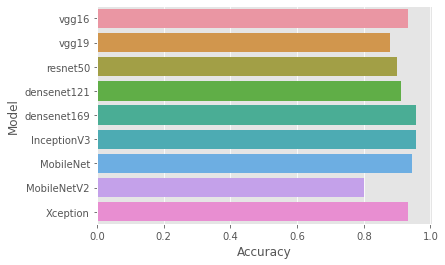

\begin{tabular}{llrrrrrrr}
\toprule
{} &        Model &  Accuracy &  Precision &    Recall &        F1 &       AUC &  Sensitivity &  Specificity \\
\midrule
0 &        vgg16 &  0.934066 &   0.948718 &  0.902439 &  0.925000 &  0.931220 &     0.902439 &         0.96 \\
1 &        vgg19 &  0.879121 &   0.875000 &  0.853659 &  0.864198 &  0.876829 &     0.853659 &         0.90 \\
2 &     resnet50 &  0.901099 &   0.921053 &  0.853659 &  0.886076 &  0.896829 &     0.853659 &         0.94 \\
3 &  densenet121 &  0.912088 &   0.971429 &  0.829268 &  0.894737 &  0.904634 &     0.829268 &         0.98 \\
4 &  densenet169 &  0.956044 &   0.951220 &  0.951220 &  0.951220 &  0.955610 &     0.951220 &         0.96 \\
5 &  InceptionV3 &  0.956044 &   0.951220 &  0.951220 &  0.951220 &  0.955610 &     0.951220 &         0.96 \\
6 &    MobileNet &  0.945055 &   0.950000 &  0.926829 &  0.938272 &  0.943415 &     0.926829 &         0.96 \\
7 &  MobileNetV2 &  0.802198 &   0.848485 &  0.682927 &  0.756757 

In [ ]:
rim_one_v2_trsfer_lr_ex(train_half_model=True)

Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:128 Width:128
Building CapsNet on top of InceptionV3
Adding capsule layer on InceptionV3 
Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(32, 128, 128, 3)]  0           []                               
                                                                                                  
 conv2d_392 (Conv2D)            (32, 63, 63, 32)     864         ['input_9[0][0]']                
                                                                                                  
 batch_normalization_392 (Batch  (32, 63, 63, 32)    96          ['conv2d_39

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.63736, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.63736

Epoch 3: val_accuracy did not improve from 0.63736

Epoch 4: val_accuracy improved from 0.63736 to 0.69231, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.69231 to 0.72527, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.72527

Epoch 7: val_accuracy improved from 0.72527 to 0.73626, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.73626

Epoch 9: val_accuracy did not improve from 0.73626

Epoch 10: val_accuracy did not improve from 0.73626

Epoch 11: val_accuracy improved from 0.73626 to 0.74725, saving model to ./result/weights.h5

Epoch 12: val_accuracy improved from 0.74725 to 0.75824, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.75824

Epoch 14: val_accuracy improved from 0.75824 to 0.78022, saving model to ./r

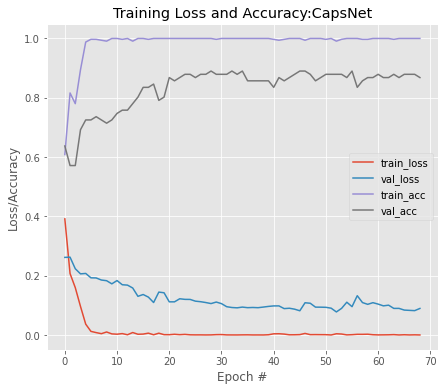

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,InceptionV3,0.89011,0.969697,0.780488,0.864865,0.880244,0.780488,0.98


Building CapsNet on top of Xception
Adding capsule layer on Xception 
Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(32, 128, 128, 3)]  0           []                               
                                                                                                  
 block1_conv1 (Conv2D)          (32, 63, 63, 32)     864         ['input_10[0][0]']               
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (32, 63, 63, 32)    128         ['block1_conv1[0][0]']           
 ation)                                                                                           
                                                                                                  
 block1_conv1_act (Act

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy improved from 0.54945 to 0.56044, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.56044 to 0.73626, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.73626

Epoch 6: val_accuracy did not improve from 0.73626

Epoch 7: val_accuracy did not improve from 0.73626

Epoch 8: val_accuracy did not improve from 0.73626

Epoch 9: val_accuracy improved from 0.73626 to 0.75824, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.75824

Epoch 11: val_accuracy did not improve from 0.75824

Epoch 12: val_accuracy improved from 0.75824 to 0.76923, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.76923

Epoch 14: val_accuracy improved from 0.76923 to 0.80220, saving model to ./result/weights.h5

Epoch 15: val_accuracy 

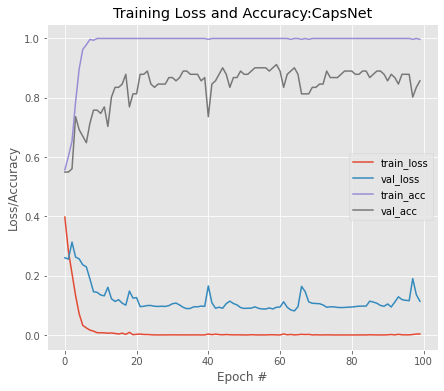

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,Xception,0.912088,0.971429,0.829268,0.894737,0.904634,0.829268,0.98


,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,InceptionV3,0.890110,0.969697,0.780488,0.864865,0.880244,0.780488,0.98
1,Xception,0.912088,0.971429,0.829268,0.894737,0.904634,0.829268,0.98


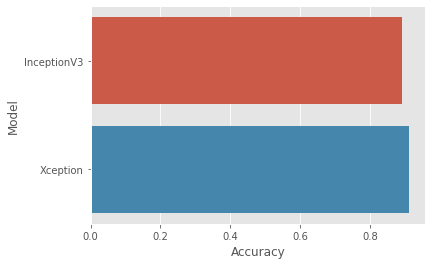

\begin{tabular}{llrrrrrrr}
\toprule
{} &        Model &  Accuracy &  Precision &    Recall &        F1 &       AUC &  Sensitivity &  Specificity \\
\midrule
0 &  InceptionV3 &  0.890110 &   0.969697 &  0.780488 &  0.864865 &  0.880244 &     0.780488 &         0.98 \\
1 &     Xception &  0.912088 &   0.971429 &  0.829268 &  0.894737 &  0.904634 &     0.829268 &         0.98 \\
\bottomrule
\end{tabular}



In [ ]:
rim_one_v2_trsfer_lr_ex(train_half_model=True)

Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:224 Width:224
Building CapsNet on top of vgg16
58900480/58889256 [==============================] - 0s 0us/step
Adding capsule layer on vgg16 
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                         

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.45055, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.45055 to 0.72527, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.72527 to 0.75824, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.75824 to 0.79121, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.79121 to 0.84615, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.84615 to 0.89011, saving model to ./result/weights.h5

Epoch 7: val_accuracy did not improve from 0.89011

Epoch 8: val_accuracy did not improve from 0.89011

Epoch 9: val_accuracy improved from 0.89011 to 0.91209, saving model to ./result/weights.h5

Epoch 10: val_accuracy improved from 0.91209 to 0.92308, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.92308

Epoch 12: val_accuracy did not improve from 0.92308

Epoch 13: val_accuracy did not improve from 0.9

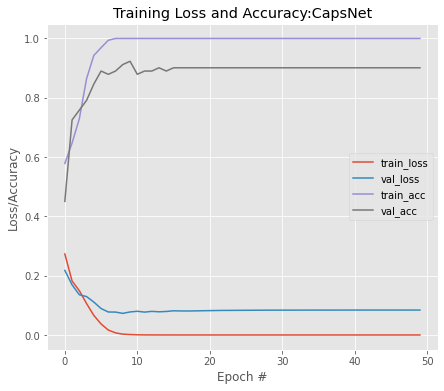

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.923077,0.925,0.902439,0.91358,0.92122,0.902439,0.94


Building CapsNet on top of vgg19
80150528/80134624 [==============================] - 0s 0us/step
Adding capsule layer on vgg19 
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (32, 112, 112, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (32, 112, 112, 128)       147584 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.53846, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.53846 to 0.67033, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.67033 to 0.69231, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.69231 to 0.75824, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.75824

Epoch 6: val_accuracy improved from 0.75824 to 0.83516, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.83516 to 0.87912, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.87912

Epoch 9: val_accuracy improved from 0.87912 to 0.90110, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.90110

Epoch 11: val_accuracy did not improve from 0.90110

Epoch 12: val_accuracy did not improve from 0.90110

Epoch 13: val_accuracy did not improve from 0.90110

Epoch 14: val_accuracy did not impr

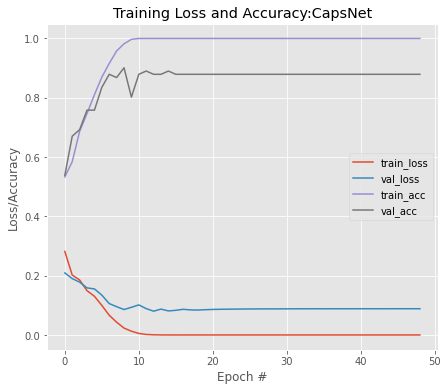

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg19,0.901099,0.9,0.878049,0.888889,0.899024,0.878049,0.92


Building CapsNet on top of resnet50
94781440/94765736 [==============================] - 1s 0us/step
Adding capsule layer on resnet50 
Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (32, 230, 230, 3)    0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (32, 112, 112, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (32, 112, 112, 64)   256

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy did not improve from 0.54945

Epoch 5: val_accuracy did not improve from 0.54945

Epoch 6: val_accuracy did not improve from 0.54945

Epoch 7: val_accuracy did not improve from 0.54945

Epoch 8: val_accuracy did not improve from 0.54945

Epoch 9: val_accuracy did not improve from 0.54945

Epoch 10: val_accuracy did not improve from 0.54945

Epoch 11: val_accuracy improved from 0.54945 to 0.73626, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.73626

Epoch 13: val_accuracy did not improve from 0.73626

Epoch 14: val_accuracy did not improve from 0.73626

Epoch 15: val_accuracy did not improve from 0.73626

Epoch 16: val_accuracy did not improve from 0.73626

Epoch 17: val_accuracy improved from 0.73626 to 0.75824, saving model to ./result

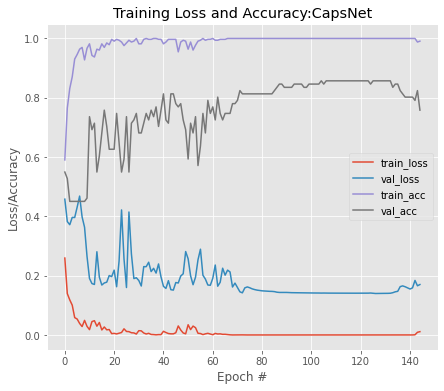

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,resnet50,0.857143,0.85,0.829268,0.839506,0.854634,0.829268,0.88


Building CapsNet on top of densenet121
29097984/29084464 [==============================] - 0s 0us/step
Adding capsule layer on densenet121 
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (32, 230, 230, 3)   0           ['input_4[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d[0][0]']         
                                                                                                  
 conv1/bn (BatchNormalization)  (32, 112, 112, 64)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy improved from 0.54945 to 0.57143, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.57143 to 0.67033, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.67033

Epoch 6: val_accuracy did not improve from 0.67033

Epoch 7: val_accuracy improved from 0.67033 to 0.70330, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.70330

Epoch 9: val_accuracy improved from 0.70330 to 0.72527, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.72527

Epoch 11: val_accuracy improved from 0.72527 to 0.73626, saving model to ./result/weights.h5

Epoch 12: val_accuracy improved from 0.73626 to 0.79121, saving model to ./result/weights.h5

Epoch 13: val_accuracy improved from 0.79121 to 0.82418, saving model to ./result/weight

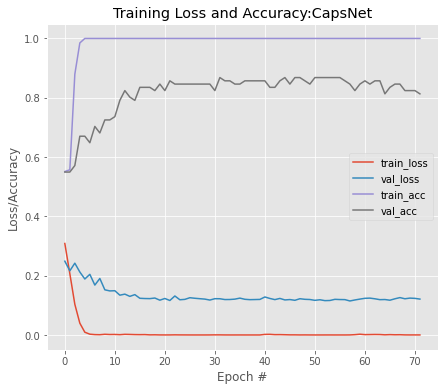

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet121,0.868132,0.914286,0.780488,0.842105,0.860244,0.780488,0.94


Building CapsNet on top of densenet169
51888128/51877672 [==============================] - 0s 0us/step
Adding capsule layer on densenet169 
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (32, 230, 230, 3)   0           ['input_5[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d_2[0][0]']       
                                                  

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.71429, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.71429 to 0.73626, saving model to ./result/weights.h5

Epoch 4: val_accuracy did not improve from 0.73626

Epoch 5: val_accuracy did not improve from 0.73626

Epoch 6: val_accuracy did not improve from 0.73626

Epoch 7: val_accuracy did not improve from 0.73626

Epoch 8: val_accuracy did not improve from 0.73626

Epoch 9: val_accuracy did not improve from 0.73626

Epoch 10: val_accuracy improved from 0.73626 to 0.79121, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.79121 to 0.82418, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.82418

Epoch 13: val_accuracy improved from 0.82418 to 0.85714, saving model to ./result/weights.h5

Epoch 14: val_accuracy did not improve from 0.85714

Epoch 15: val_accuracy 

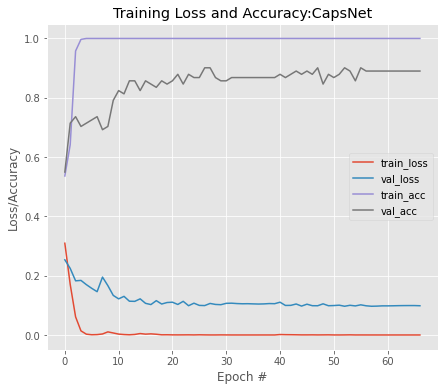

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet169,0.901099,0.921053,0.853659,0.886076,0.896829,0.853659,0.94


Building CapsNet on top of InceptionV3
87924736/87910968 [==============================] - 1s 0us/step
Adding capsule layer on InceptionV3 
Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (32, 111, 111, 32)   864         ['input_6[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (32, 111, 111, 32)  96          ['conv2d[0][0]']                 
 alization)                                                                                       
                                                  

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy improved from 0.54945 to 0.56044, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.56044 to 0.59341, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.59341 to 0.62637, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.62637 to 0.63736, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.63736 to 0.70330, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.70330

Epoch 9: val_accuracy improved from 0.70330 to 0.73626, saving model to ./result/weights.h5

Epoch 10: val_accuracy improved from 0.73626 to 0.74725, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.74725 to 0.76923, saving model to ./result/weights.h5

Epoch 12: val_accuracy improved from 0.76923 to 0.78022, sa

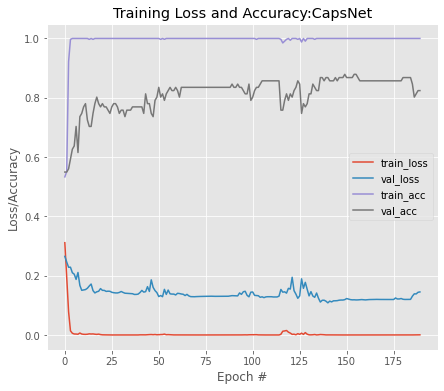

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,InceptionV3,0.879121,0.826087,0.926829,0.873563,0.883415,0.926829,0.84


Building CapsNet on top of MobileNet
17235968/17225924 [==============================] - 0s 0us/step
Adding capsule layer on MobileNet 
Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 conv1 (Conv2D)              (32, 112, 112, 32)        864       
                                                                 
 conv1_bn (BatchNormalizatio  (32, 112, 112, 32)       128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (32, 112, 112, 32)        0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (32, 112, 112, 32)       288       
                                                      

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.54945 to 0.75824, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.75824

Epoch 4: val_accuracy improved from 0.75824 to 0.78022, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.78022

Epoch 6: val_accuracy did not improve from 0.78022

Epoch 7: val_accuracy did not improve from 0.78022

Epoch 8: val_accuracy did not improve from 0.78022

Epoch 9: val_accuracy did not improve from 0.78022

Epoch 10: val_accuracy did not improve from 0.78022

Epoch 11: val_accuracy did not improve from 0.78022

Epoch 12: val_accuracy did not improve from 0.78022

Epoch 13: val_accuracy did not improve from 0.78022

Epoch 14: val_accuracy did not improve from 0.78022

Epoch 15: val_accuracy did not improve from 0.78022

Epoch 16: val_accuracy improved from 0.78022 to 0.79121, saving model to ./result/weights.h5


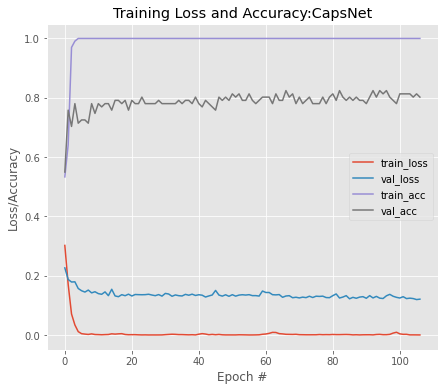

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,MobileNet,0.824176,0.790698,0.829268,0.809524,0.824634,0.829268,0.82


Building CapsNet on top of MobileNetV2
9420800/9406464 [==============================] - 0s 0us/step
Adding capsule layer on MobileNetV2 
Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (32, 112, 112, 32)   864         ['input_8[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (32, 112, 112, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (32, 112, 112, 32)  

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy improved from 0.54945 to 0.56044, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.56044 to 0.70330, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.70330

Epoch 6: val_accuracy did not improve from 0.70330

Epoch 7: val_accuracy did not improve from 0.70330

Epoch 8: val_accuracy did not improve from 0.70330

Epoch 9: val_accuracy improved from 0.70330 to 0.72527, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.72527

Epoch 11: val_accuracy did not improve from 0.72527

Epoch 12: val_accuracy did not improve from 0.72527

Epoch 13: val_accuracy did not improve from 0.72527

Epoch 14: val_accuracy did not improve from 0.72527

Epoch 15: val_accuracy did not improve from 0.72527

Epoch 16: val_accuracy did not improve from 0.72527


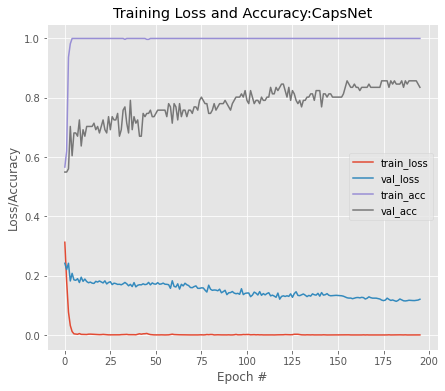

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,MobileNetV2,0.857143,0.9375,0.731707,0.821918,0.845854,0.731707,0.96


Building CapsNet on top of Xception
83697664/83683744 [==============================] - 0s 0us/step
Adding capsule layer on Xception 
Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 block1_conv1 (Conv2D)          (32, 111, 111, 32)   864         ['input_9[0][0]']                
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (32, 111, 111, 32)  128         ['block1_conv1[0][0]']           
 ation)                                                                                           
                                                        

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.54945, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.54945

Epoch 3: val_accuracy did not improve from 0.54945

Epoch 4: val_accuracy improved from 0.54945 to 0.60440, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.60440 to 0.64835, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.64835

Epoch 7: val_accuracy improved from 0.64835 to 0.76923, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.76923

Epoch 9: val_accuracy improved from 0.76923 to 0.79121, saving model to ./result/weights.h5

Epoch 10: val_accuracy improved from 0.79121 to 0.82418, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.82418

Epoch 12: val_accuracy did not improve from 0.82418

Epoch 13: val_accuracy did not improve from 0.82418

Epoch 14: val_accuracy improved from 0.82418 to 0.83516, saving model to ./r

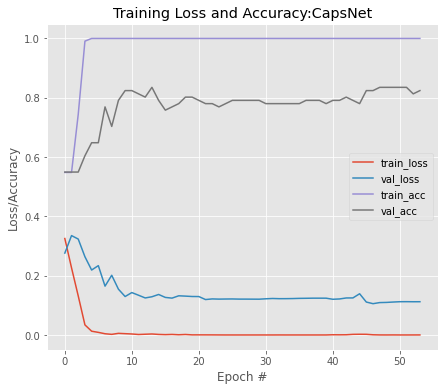

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,Xception,0.835165,0.933333,0.682927,0.788732,0.821463,0.682927,0.96


,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.923077,0.925000,0.902439,0.913580,0.921220,0.902439,0.94
1,vgg19,0.901099,0.900000,0.878049,0.888889,0.899024,0.878049,0.92
2,resnet50,0.857143,0.850000,0.829268,0.839506,0.854634,0.829268,0.88
3,densenet121,0.868132,0.914286,0.780488,0.842105,0.860244,0.780488,0.94
4,densenet169,0.901099,0.921053,0.853659,0.886076,0.896829,0.853659,0.94
5,InceptionV3,0.879121,0.826087,0.926829,0.873563,0.883415,0.926829,0.84
6,MobileNet,0.824176,0.790698,0.829268,0.809524,0.824634,0.829268,0.82
7,MobileNetV2,0.857143,0.937500,0.731707,0.821918,0.845854,0.731707,0.96
8,Xception,0.835165,0.933333,0.682927,0.788732,0.821463,0.682927,0.96


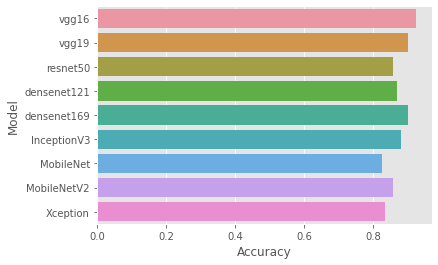

\begin{tabular}{llrrrrrrr}
\toprule
{} &        Model &  Accuracy &  Precision &    Recall &        F1 &       AUC &  Sensitivity &  Specificity \\
\midrule
0 &        vgg16 &  0.923077 &   0.925000 &  0.902439 &  0.913580 &  0.921220 &     0.902439 &         0.94 \\
1 &        vgg19 &  0.901099 &   0.900000 &  0.878049 &  0.888889 &  0.899024 &     0.878049 &         0.92 \\
2 &     resnet50 &  0.857143 &   0.850000 &  0.829268 &  0.839506 &  0.854634 &     0.829268 &         0.88 \\
3 &  densenet121 &  0.868132 &   0.914286 &  0.780488 &  0.842105 &  0.860244 &     0.780488 &         0.94 \\
4 &  densenet169 &  0.901099 &   0.921053 &  0.853659 &  0.886076 &  0.896829 &     0.853659 &         0.94 \\
5 &  InceptionV3 &  0.879121 &   0.826087 &  0.926829 &  0.873563 &  0.883415 &     0.926829 &         0.84 \\
6 &    MobileNet &  0.824176 &   0.790698 &  0.829268 &  0.809524 &  0.824634 &     0.829268 &         0.82 \\
7 &  MobileNetV2 &  0.857143 &   0.937500 &  0.731707 &  0.821918 

In [ ]:
rim_one_v2_trsfer_lr_ex(train_half_model=True, histogram_eq=True)

Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Height:224 Width:224
Building CapsNet on top of vgg16
Adding capsule layer on vgg16 
Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                                                                 
 block2_conv1 (Conv2D)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.89362, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.89362

Epoch 3: val_accuracy improved from 0.89362 to 0.93617, saving model to ./result/weights.h5

Epoch 4: val_accuracy did not improve from 0.93617

Epoch 5: val_accuracy did not improve from 0.93617

Epoch 6: val_accuracy did not improve from 0.93617

Epoch 7: val_accuracy improved from 0.93617 to 0.95745, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.95745

Epoch 9: val_accuracy did not improve from 0.95745

Epoch 10: val_accuracy did not improve from 0.95745

Epoch 11: val_accuracy did not improve from 0.95745

Epoch 12: val_accuracy did not improve from 0.95745

Epoch 13: val_accuracy did not improve from 0.95745

Epoch 14: val_accuracy did not improve from 0.95745

Epoch 15: val_accuracy did not improve from 0.95745

Epoch 16: val_accuracy did not improve from 0.95745

Epoch 17: val_accuracy improved from 0.9

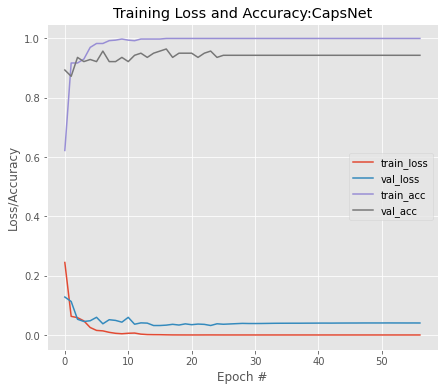

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.964539,0.964912,0.948276,0.956522,0.96209,0.948276,0.975904


Building CapsNet on top of vgg19
Adding capsule layer on vgg19 
Model: "model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (32, 112, 112, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (32, 112, 112, 128)       147584    
                                                            

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.85106, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.85106

Epoch 3: val_accuracy improved from 0.85106 to 0.90780, saving model to ./result/weights.h5

Epoch 4: val_accuracy did not improve from 0.90780

Epoch 5: val_accuracy did not improve from 0.90780

Epoch 6: val_accuracy did not improve from 0.90780

Epoch 7: val_accuracy improved from 0.90780 to 0.92199, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.92199

Epoch 9: val_accuracy improved from 0.92199 to 0.95035, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.95035

Epoch 11: val_accuracy improved from 0.95035 to 0.95745, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.95745

Epoch 13: val_accuracy did not improve from 0.95745

Epoch 14: val_accuracy did not improve from 0.95745

Epoch 15: val_accuracy improved from 0.95745 to 0.96454, saving 

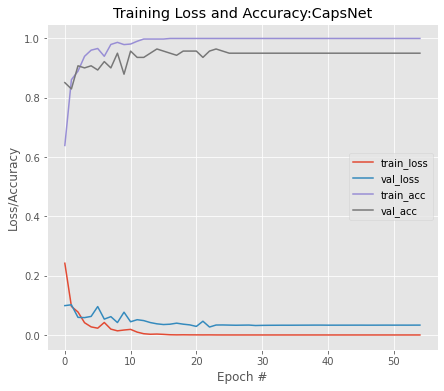

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg19,0.964539,0.949153,0.965517,0.957265,0.964686,0.965517,0.963855


Building CapsNet on top of resnet50
Adding capsule layer on resnet50 
Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_12 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (32, 230, 230, 3)    0           ['input_12[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (32, 112, 112, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (32, 112, 112, 64)   256         ['conv1_conv[0][0]']             
                     

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.58865

Epoch 3: val_accuracy did not improve from 0.58865

Epoch 4: val_accuracy did not improve from 0.58865

Epoch 5: val_accuracy did not improve from 0.58865

Epoch 6: val_accuracy did not improve from 0.58865

Epoch 7: val_accuracy did not improve from 0.58865

Epoch 8: val_accuracy did not improve from 0.58865

Epoch 9: val_accuracy did not improve from 0.58865

Epoch 10: val_accuracy did not improve from 0.58865

Epoch 11: val_accuracy did not improve from 0.58865

Epoch 12: val_accuracy did not improve from 0.58865

Epoch 13: val_accuracy did not improve from 0.58865

Epoch 14: val_accuracy did not improve from 0.58865

Epoch 15: val_accuracy did not improve from 0.58865

Epoch 16: val_accuracy improved from 0.58865 to 0.72340, saving model to ./result/weights.h5

Epoch 17: val_accuracy did not improve from 0.72340

Epoch 18: val_accuracy impro

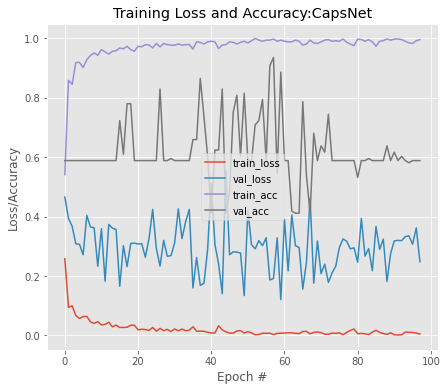

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,resnet50,0.93617,0.901639,0.948276,0.92437,0.937993,0.948276,0.927711


Building CapsNet on top of densenet121
Adding capsule layer on densenet121 
Model: "model_12"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_13 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d_4 (ZeroPadding2  (32, 230, 230, 3)   0           ['input_13[0][0]']               
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d_4[0][0]']       
                                                                                                  
 conv1/bn (Batc

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.58865 to 0.92199, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.92199 to 0.93617, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.93617 to 0.94326, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.94326 to 0.95035, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.95035

Epoch 7: val_accuracy did not improve from 0.95035

Epoch 8: val_accuracy did not improve from 0.95035

Epoch 9: val_accuracy did not improve from 0.95035

Epoch 10: val_accuracy did not improve from 0.95035

Epoch 11: val_accuracy did not improve from 0.95035

Epoch 12: val_accuracy did not improve from 0.95035

Epoch 13: val_accuracy did not improve from 0.95035

Epoch 14: val_accuracy did not improve from 0.95035

Epoch 15: val_accuracy did not improve from 0.95035

Epoch 16: v

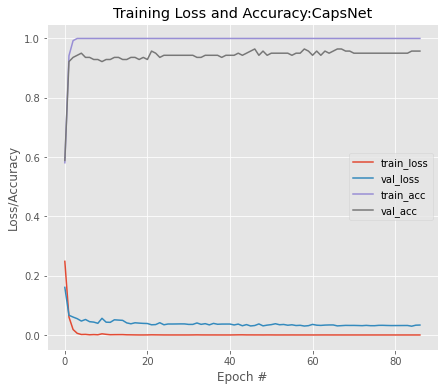

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet121,0.964539,0.964912,0.948276,0.956522,0.96209,0.948276,0.975904


Building CapsNet on top of densenet169
Adding capsule layer on densenet169 
Model: "model_13"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_14 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d_6 (ZeroPadding2  (32, 230, 230, 3)   0           ['input_14[0][0]']               
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d_6[0][0]']       
                                                                                                  
 conv1/bn (Batc

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.87234, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.87234 to 0.93617, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.93617 to 0.95745, saving model to ./result/weights.h5

Epoch 4: val_accuracy did not improve from 0.95745

Epoch 5: val_accuracy did not improve from 0.95745

Epoch 6: val_accuracy did not improve from 0.95745

Epoch 7: val_accuracy did not improve from 0.95745

Epoch 8: val_accuracy did not improve from 0.95745

Epoch 9: val_accuracy did not improve from 0.95745

Epoch 10: val_accuracy did not improve from 0.95745

Epoch 11: val_accuracy did not improve from 0.95745

Epoch 12: val_accuracy did not improve from 0.95745

Epoch 13: val_accuracy did not improve from 0.95745

Epoch 14: val_accuracy did not improve from 0.95745

Epoch 15: val_accuracy did not improve from 0.95745

Epoch 16: val_accuracy did not improve from 0.95745

Epoch 17: val_accuracy improved from 0.9

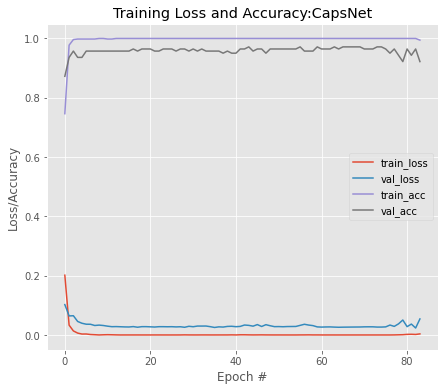

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet169,0.971631,0.935484,1.0,0.966667,0.975904,1.0,0.951807


Building CapsNet on top of InceptionV3
Adding capsule layer on InceptionV3 
Model: "model_14"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_15 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv2d_98 (Conv2D)             (32, 111, 111, 32)   864         ['input_15[0][0]']               
                                                                                                  
 batch_normalization_98 (BatchN  (32, 111, 111, 32)  96          ['conv2d_98[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_94 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.58865 to 0.73050, saving model to ./result/weights.h5

Epoch 3: val_accuracy did not improve from 0.73050

Epoch 4: val_accuracy did not improve from 0.73050

Epoch 5: val_accuracy improved from 0.73050 to 0.77305, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.77305

Epoch 7: val_accuracy improved from 0.77305 to 0.82270, saving model to ./result/weights.h5

Epoch 8: val_accuracy improved from 0.82270 to 0.85816, saving model to ./result/weights.h5

Epoch 9: val_accuracy did not improve from 0.85816

Epoch 10: val_accuracy did not improve from 0.85816

Epoch 11: val_accuracy did not improve from 0.85816

Epoch 12: val_accuracy did not improve from 0.85816

Epoch 13: val_accuracy did not improve from 0.85816

Epoch 14: val_accuracy did not improve from 0.85816

Epoch 15: val_accuracy did not improve from 0.85816

Epoch 16: v

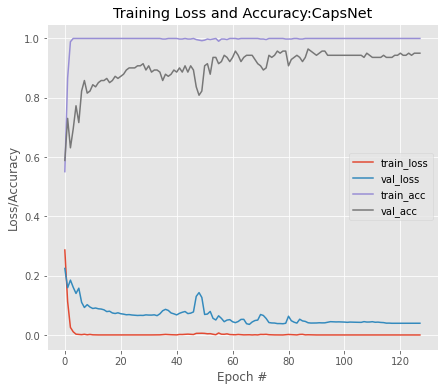

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,InceptionV3,0.964539,0.964912,0.948276,0.956522,0.96209,0.948276,0.975904


Building CapsNet on top of MobileNet
Adding capsule layer on MobileNet 
Model: "model_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(32, 224, 224, 3)]       0         
                                                                 
 conv1 (Conv2D)              (32, 112, 112, 32)        864       
                                                                 
 conv1_bn (BatchNormalizatio  (32, 112, 112, 32)       128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (32, 112, 112, 32)        0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (32, 112, 112, 32)       288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (32, 112, 112, 32)    

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.58865 to 0.65248, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.65248 to 0.92199, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.92199 to 0.93617, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.93617

Epoch 6: val_accuracy did not improve from 0.93617

Epoch 7: val_accuracy improved from 0.93617 to 0.94326, saving model to ./result/weights.h5

Epoch 8: val_accuracy improved from 0.94326 to 0.95035, saving model to ./result/weights.h5

Epoch 9: val_accuracy did not improve from 0.95035

Epoch 10: val_accuracy did not improve from 0.95035

Epoch 11: val_accuracy improved from 0.95035 to 0.95745, saving model to ./result/weights.h5

Epoch 12: val_accuracy improved from 0.95745 to 0.96454, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.9

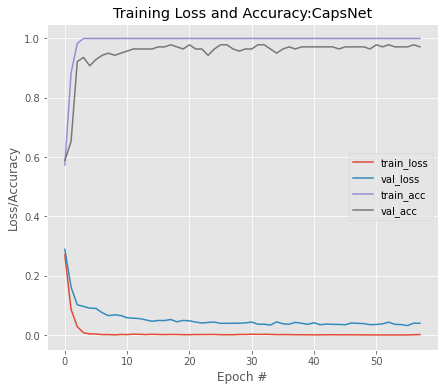

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,MobileNet,0.978723,0.966102,0.982759,0.974359,0.979331,0.982759,0.975904


Building CapsNet on top of MobileNetV2
Adding capsule layer on MobileNetV2 
Model: "model_16"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_17 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (32, 112, 112, 32)   864         ['input_17[0][0]']               
                                                                                                  
 bn_Conv1 (BatchNormalization)  (32, 112, 112, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (32, 112, 112, 32)   0           ['bn_Conv1[0][0]']               
               

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.58865, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.58865

Epoch 3: val_accuracy improved from 0.58865 to 0.59574, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.59574 to 0.60284, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.60284

Epoch 6: val_accuracy did not improve from 0.60284

Epoch 7: val_accuracy did not improve from 0.60284

Epoch 8: val_accuracy did not improve from 0.60284

Epoch 9: val_accuracy did not improve from 0.60284

Epoch 10: val_accuracy did not improve from 0.60284

Epoch 11: val_accuracy did not improve from 0.60284

Epoch 12: val_accuracy improved from 0.60284 to 0.62411, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.62411

Epoch 14: val_accuracy did not improve from 0.62411

Epoch 15: val_accuracy did not improve from 0.62411

Epoch 16: val_accuracy did not improve from 0.62411


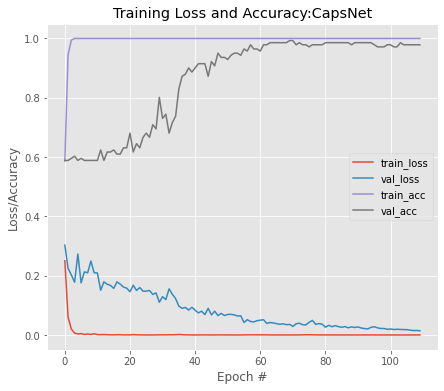

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,MobileNetV2,0.992908,1.0,0.982759,0.991304,0.991379,0.982759,1.0


Building CapsNet on top of Xception
Adding capsule layer on Xception 
Model: "model_17"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_18 (InputLayer)          [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 block1_conv1 (Conv2D)          (32, 111, 111, 32)   864         ['input_18[0][0]']               
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (32, 111, 111, 32)  128         ['block1_conv1[0][0]']           
 ation)                                                                                           
                                                                                                  
 block1_conv1_act (Ac

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.78014, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.78014 to 0.84397, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.84397 to 0.85106, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.85106 to 0.86525, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.86525 to 0.90780, saving model to ./result/weights.h5

Epoch 6: val_accuracy did not improve from 0.90780

Epoch 7: val_accuracy improved from 0.90780 to 0.91489, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.91489

Epoch 9: val_accuracy did not improve from 0.91489

Epoch 10: val_accuracy did not improve from 0.91489

Epoch 11: val_accuracy did not improve from 0.91489

Epoch 12: val_accuracy improved from 0.91489 to 0.92908, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.92908

Epoch 14: val_accuracy improved fro

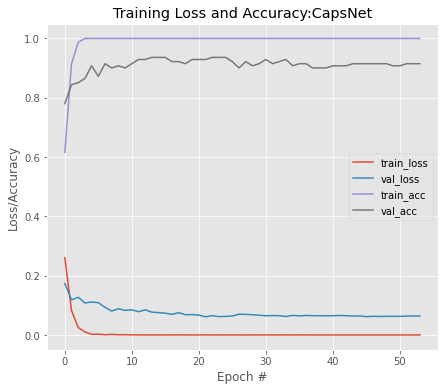

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,Xception,0.93617,0.915254,0.931034,0.923077,0.935397,0.931034,0.939759


,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.964539,0.964912,0.948276,0.956522,0.962090,0.948276,0.975904
1,vgg19,0.964539,0.949153,0.965517,0.957265,0.964686,0.965517,0.963855
2,resnet50,0.936170,0.901639,0.948276,0.924370,0.937993,0.948276,0.927711
3,densenet121,0.964539,0.964912,0.948276,0.956522,0.962090,0.948276,0.975904
4,densenet169,0.971631,0.935484,1.000000,0.966667,0.975904,1.000000,0.951807
5,InceptionV3,0.964539,0.964912,0.948276,0.956522,0.962090,0.948276,0.975904
6,MobileNet,0.978723,0.966102,0.982759,0.974359,0.979331,0.982759,0.975904
7,MobileNetV2,0.992908,1.000000,0.982759,0.991304,0.991379,0.982759,1.000000
8,Xception,0.936170,0.915254,0.931034,0.923077,0.935397,0.931034,0.939759


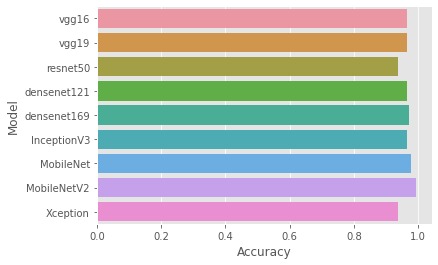

\begin{tabular}{llrrrrrrr}
\toprule
{} &        Model &  Accuracy &  Precision &    Recall &        F1 &       AUC &  Sensitivity &  Specificity \\
\midrule
0 &        vgg16 &  0.964539 &   0.964912 &  0.948276 &  0.956522 &  0.962090 &     0.948276 &     0.975904 \\
1 &        vgg19 &  0.964539 &   0.949153 &  0.965517 &  0.957265 &  0.964686 &     0.965517 &     0.963855 \\
2 &     resnet50 &  0.936170 &   0.901639 &  0.948276 &  0.924370 &  0.937993 &     0.948276 &     0.927711 \\
3 &  densenet121 &  0.964539 &   0.964912 &  0.948276 &  0.956522 &  0.962090 &     0.948276 &     0.975904 \\
4 &  densenet169 &  0.971631 &   0.935484 &  1.000000 &  0.966667 &  0.975904 &     1.000000 &     0.951807 \\
5 &  InceptionV3 &  0.964539 &   0.964912 &  0.948276 &  0.956522 &  0.962090 &     0.948276 &     0.975904 \\
6 &    MobileNet &  0.978723 &   0.966102 &  0.982759 &  0.974359 &  0.979331 &     0.982759 &     0.975904 \\
7 &  MobileNetV2 &  0.992908 &   1.000000 &  0.982759 &  0.991304 

In [ ]:
acrima_trsfer_lr(train_half_model=True)

Namespace(augmentation=False, batch_size=32, debug=False, digit=5, epochs=15, lam_recon=0.392, lr=0.0001, lr_decay=1, name='CapsNet', routings=1, save_dir='./result', shift_fraction=0.1, testing=False, weights=None)
Building CapsNet on top of InceptionV3
87924736/87910968 [==============================] - 2s 0us/step
Adding capsule layer on InceptionV3 
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (32, 111, 111, 32)   864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy improved from 0.64384 to 0.67808, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.67808

Epoch 6: val_accuracy improved from 0.67808 to 0.71233, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.71233 to 0.71918, saving model to ./result/weights.h5

Epoch 8: val_accuracy did not improve from 0.71918

Epoch 9: val_accuracy did not improve from 0.71918

Epoch 10: val_accuracy improved from 0.71918 to 0.74658, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.74658 to 0.75342, saving model to ./result/weights.h5

Epoch 12: val_accuracy did not improve from 0.75342

Epoch 13: val_accuracy did not improve from 0.75342

Epoch 14: val_accuracy improved from 0.75342 to 0.76027, saving model to ./r

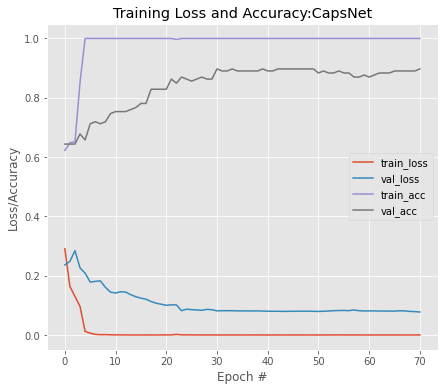

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,InceptionV3,0.89726,0.915789,0.925532,0.920635,0.885843,0.925532,0.846154


Building CapsNet on top of vgg16
58900480/58889256 [==============================] - 0s 0us/step
Adding capsule layer on vgg16 
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (32, 112, 112, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (32, 112, 112, 128)       147584 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy improved from 0.64384 to 0.71233, saving model to ./result/weights.h5

Epoch 3: val_accuracy improved from 0.71233 to 0.73973, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.73973 to 0.80137, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.80137

Epoch 6: val_accuracy improved from 0.80137 to 0.81507, saving model to ./result/weights.h5

Epoch 7: val_accuracy improved from 0.81507 to 0.84247, saving model to ./result/weights.h5

Epoch 8: val_accuracy improved from 0.84247 to 0.86986, saving model to ./result/weights.h5

Epoch 9: val_accuracy improved from 0.86986 to 0.88356, saving model to ./result/weights.h5

Epoch 10: val_accuracy did not improve from 0.88356

Epoch 11: val_accuracy did not improve from 0.88356

Epoch 12: val_accuracy did not improve from 0.88356

Epoch 13: val_accuracy did not improve from 0.8

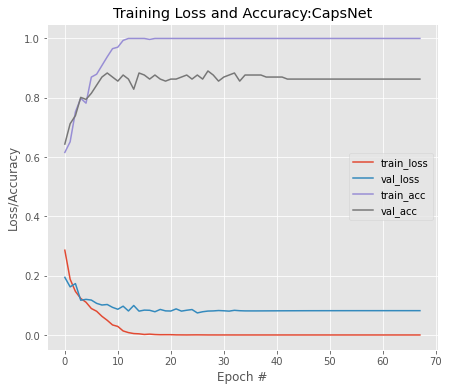

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg16,0.890411,0.923913,0.904255,0.913978,0.88482,0.904255,0.865385


Building CapsNet on top of vgg19
80150528/80134624 [==============================] - 4s 0us/step
Adding capsule layer on vgg19 
Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (32, 224, 224, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (32, 224, 224, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (32, 112, 112, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (32, 112, 112, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (32, 112, 112, 128)       147584 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy improved from 0.64384 to 0.72603, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.72603 to 0.73973, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.73973 to 0.76027, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.76027 to 0.84932, saving model to ./result/weights.h5

Epoch 7: val_accuracy did not improve from 0.84932

Epoch 8: val_accuracy did not improve from 0.84932

Epoch 9: val_accuracy did not improve from 0.84932

Epoch 10: val_accuracy improved from 0.84932 to 0.85616, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.85616

Epoch 12: val_accuracy improved from 0.85616 to 0.86301, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.86301

Epoch 14: val_accuracy did not impr

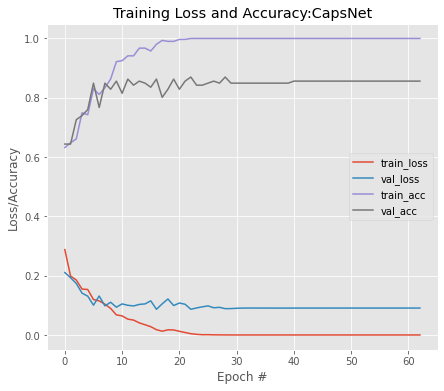

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,vgg19,0.869863,0.878788,0.925532,0.901554,0.847381,0.925532,0.769231


Building CapsNet on top of resnet50
94781440/94765736 [==============================] - 0s 0us/step
Adding capsule layer on resnet50 
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (32, 230, 230, 3)    0           ['input_4[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (32, 112, 112, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (32, 112, 112, 64)   256

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.35616, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.35616

Epoch 3: val_accuracy did not improve from 0.35616

Epoch 4: val_accuracy did not improve from 0.35616

Epoch 5: val_accuracy did not improve from 0.35616

Epoch 6: val_accuracy did not improve from 0.35616

Epoch 7: val_accuracy did not improve from 0.35616

Epoch 8: val_accuracy did not improve from 0.35616

Epoch 9: val_accuracy did not improve from 0.35616

Epoch 10: val_accuracy did not improve from 0.35616

Epoch 11: val_accuracy did not improve from 0.35616

Epoch 12: val_accuracy did not improve from 0.35616

Epoch 13: val_accuracy did not improve from 0.35616

Epoch 14: val_accuracy did not improve from 0.35616

Epoch 15: val_accuracy did not improve from 0.35616

Epoch 16: val_accuracy did not improve from 0.35616

Epoch 17: val_accuracy did not improve from 0.35616

Epoch 18: val_accuracy did not improve from 0.35616

Epoch 19: val_ac

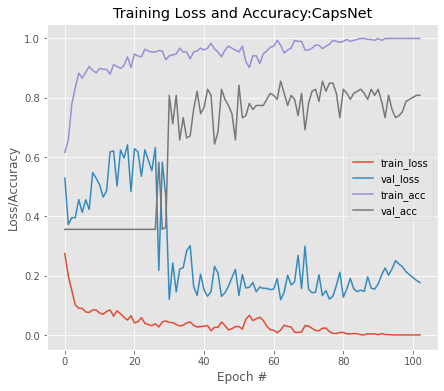

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,resnet50,0.856164,0.901099,0.87234,0.886486,0.849632,0.87234,0.826923


Building CapsNet on top of densenet121
29097984/29084464 [==============================] - 1s 0us/step
Adding capsule layer on densenet121 
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (32, 230, 230, 3)   0           ['input_5[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d[0][0]']         
                                                                                                  
 conv1/bn (BatchNormalization)  (32, 112, 112, 64)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy did not improve from 0.64384

Epoch 4: val_accuracy improved from 0.64384 to 0.73288, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.73288

Epoch 6: val_accuracy did not improve from 0.73288

Epoch 7: val_accuracy did not improve from 0.73288

Epoch 8: val_accuracy did not improve from 0.73288

Epoch 9: val_accuracy did not improve from 0.73288

Epoch 10: val_accuracy improved from 0.73288 to 0.76712, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.76712 to 0.77397, saving model to ./result/weights.h5

Epoch 12: val_accuracy improved from 0.77397 to 0.78082, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.78082

Epoch 14: val_accuracy improved from 0.78082 to 0.80137, saving model to ./result/weights.h5

Epoch 15: val_accuracy 

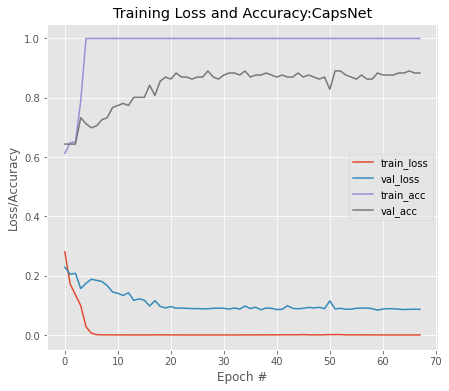

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet121,0.890411,0.882353,0.957447,0.918367,0.863339,0.957447,0.769231


Building CapsNet on top of densenet169
51888128/51877672 [==============================] - 1s 0us/step
Adding capsule layer on densenet169 
Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (32, 230, 230, 3)   0           ['input_6[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (32, 112, 112, 64)   9408        ['zero_padding2d_2[0][0]']       
                                                  

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy improved from 0.64384 to 0.70548, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.70548 to 0.73288, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.73288

Epoch 6: val_accuracy improved from 0.73288 to 0.80137, saving model to ./result/weights.h5

Epoch 7: val_accuracy did not improve from 0.80137

Epoch 8: val_accuracy did not improve from 0.80137

Epoch 9: val_accuracy did not improve from 0.80137

Epoch 10: val_accuracy improved from 0.80137 to 0.83562, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.83562

Epoch 12: val_accuracy improved from 0.83562 to 0.84932, saving model to ./result/weights.h5

Epoch 13: val_accuracy did not improve from 0.84932

Epoch 14: val_accuracy improved from 0.84932 to 0.85616, saving model to ./r

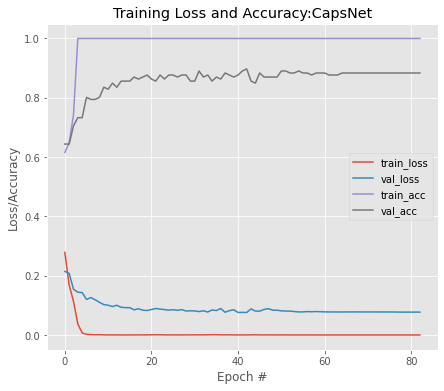

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,densenet169,0.89726,0.907216,0.93617,0.921466,0.881547,0.93617,0.826923


Building CapsNet on top of MobileNet
17235968/17225924 [==============================] - 0s 0us/step
Adding capsule layer on MobileNet 
Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(32, 224, 224, 3)]       0         
                                                                 
 conv1 (Conv2D)              (32, 112, 112, 32)        864       
                                                                 
 conv1_bn (BatchNormalizatio  (32, 112, 112, 32)       128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (32, 112, 112, 32)        0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (32, 112, 112, 32)       288       
                                                      

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy improved from 0.64384 to 0.71918, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.71918 to 0.83562, saving model to ./result/weights.h5

Epoch 5: val_accuracy did not improve from 0.83562

Epoch 6: val_accuracy did not improve from 0.83562

Epoch 7: val_accuracy did not improve from 0.83562

Epoch 8: val_accuracy improved from 0.83562 to 0.84932, saving model to ./result/weights.h5

Epoch 9: val_accuracy did not improve from 0.84932

Epoch 10: val_accuracy improved from 0.84932 to 0.85616, saving model to ./result/weights.h5

Epoch 11: val_accuracy did not improve from 0.85616

Epoch 12: val_accuracy did not improve from 0.85616

Epoch 13: val_accuracy improved from 0.85616 to 0.86986, saving model to ./result/weights.h5

Epoch 14: val_accuracy improved from 0.86986 to 0.87671, saving model to ./r

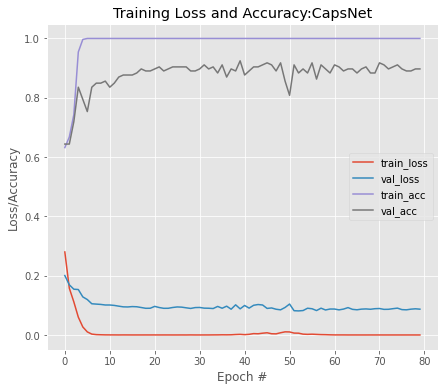

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,MobileNet,0.924658,0.946237,0.93617,0.941176,0.920008,0.93617,0.903846


Building CapsNet on top of MobileNetV2
9420800/9406464 [==============================] - 0s 0us/step
Adding capsule layer on MobileNetV2 
Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (32, 112, 112, 32)   864         ['input_8[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (32, 112, 112, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (32, 112, 112, 32)  

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy improved from 0.64384 to 0.71918, saving model to ./result/weights.h5

Epoch 4: val_accuracy did not improve from 0.71918

Epoch 5: val_accuracy did not improve from 0.71918

Epoch 6: val_accuracy did not improve from 0.71918

Epoch 7: val_accuracy improved from 0.71918 to 0.75342, saving model to ./result/weights.h5

Epoch 8: val_accuracy improved from 0.75342 to 0.76027, saving model to ./result/weights.h5

Epoch 9: val_accuracy did not improve from 0.76027

Epoch 10: val_accuracy did not improve from 0.76027

Epoch 11: val_accuracy did not improve from 0.76027

Epoch 12: val_accuracy did not improve from 0.76027

Epoch 13: val_accuracy did not improve from 0.76027

Epoch 14: val_accuracy did not improve from 0.76027

Epoch 15: val_accuracy did not improve from 0.76027

Epoch 16: val_accuracy did not improve from 0.76027


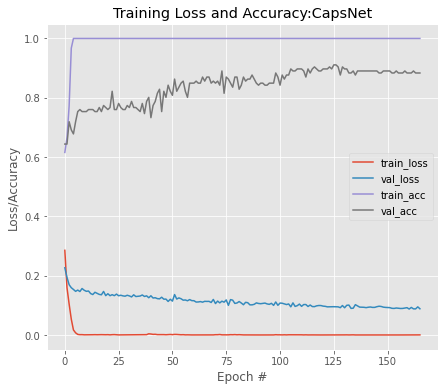

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,MobileNetV2,0.910959,0.917526,0.946809,0.931937,0.896481,0.946809,0.846154


Building CapsNet on top of Xception
83697664/83683744 [==============================] - 0s 0us/step
Adding capsule layer on Xception 
Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(32, 224, 224, 3)]  0           []                               
                                                                                                  
 block1_conv1 (Conv2D)          (32, 111, 111, 32)   864         ['input_9[0][0]']                
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (32, 111, 111, 32)  128         ['block1_conv1[0][0]']           
 ation)                                                                                           
                                                        

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.64384, saving model to ./result/weights.h5

Epoch 2: val_accuracy did not improve from 0.64384

Epoch 3: val_accuracy improved from 0.64384 to 0.65068, saving model to ./result/weights.h5

Epoch 4: val_accuracy improved from 0.65068 to 0.67808, saving model to ./result/weights.h5

Epoch 5: val_accuracy improved from 0.67808 to 0.69863, saving model to ./result/weights.h5

Epoch 6: val_accuracy improved from 0.69863 to 0.71918, saving model to ./result/weights.h5

Epoch 7: val_accuracy did not improve from 0.71918

Epoch 8: val_accuracy did not improve from 0.71918

Epoch 9: val_accuracy improved from 0.71918 to 0.74658, saving model to ./result/weights.h5

Epoch 10: val_accuracy improved from 0.74658 to 0.76027, saving model to ./result/weights.h5

Epoch 11: val_accuracy improved from 0.76027 to 0.76712, saving model to ./result/weights.h5

Epoch 12: val_accuracy improved from 0.76712 to 0.78082, saving model to ./result/weights.h5

Epoch 

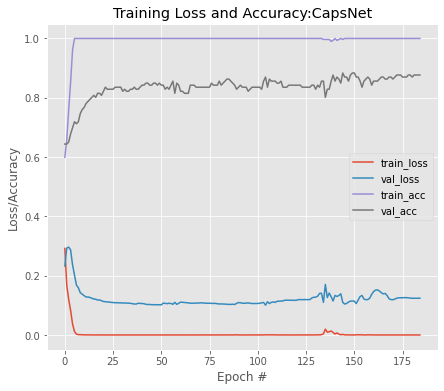

,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,Xception,0.883562,0.859813,0.978723,0.915423,0.845131,0.978723,0.711538


,Model,Accuracy,Precision,Recall,F1,AUC,Sensitivity,Specificity
0,InceptionV3,0.897260,0.915789,0.925532,0.920635,0.885843,0.925532,0.846154
1,vgg16,0.890411,0.923913,0.904255,0.913978,0.884820,0.904255,0.865385
2,vgg19,0.869863,0.878788,0.925532,0.901554,0.847381,0.925532,0.769231
3,resnet50,0.856164,0.901099,0.872340,0.886486,0.849632,0.872340,0.826923
4,densenet121,0.890411,0.882353,0.957447,0.918367,0.863339,0.957447,0.769231
5,densenet169,0.897260,0.907216,0.936170,0.921466,0.881547,0.936170,0.826923
6,MobileNet,0.924658,0.946237,0.936170,0.941176,0.920008,0.936170,0.903846
7,MobileNetV2,0.910959,0.917526,0.946809,0.931937,0.896481,0.946809,0.846154
8,Xception,0.883562,0.859813,0.978723,0.915423,0.845131,0.978723,0.711538


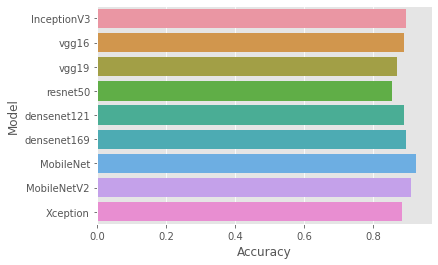

\begin{tabular}{llrrrrrrr}
\toprule
{} &        Model &  Accuracy &  Precision &    Recall &        F1 &       AUC &  Sensitivity &  Specificity \\
\midrule
0 &  InceptionV3 &  0.897260 &   0.915789 &  0.925532 &  0.920635 &  0.885843 &     0.925532 &     0.846154 \\
1 &        vgg16 &  0.890411 &   0.923913 &  0.904255 &  0.913978 &  0.884820 &     0.904255 &     0.865385 \\
2 &        vgg19 &  0.869863 &   0.878788 &  0.925532 &  0.901554 &  0.847381 &     0.925532 &     0.769231 \\
3 &     resnet50 &  0.856164 &   0.901099 &  0.872340 &  0.886486 &  0.849632 &     0.872340 &     0.826923 \\
4 &  densenet121 &  0.890411 &   0.882353 &  0.957447 &  0.918367 &  0.863339 &     0.957447 &     0.769231 \\
5 &  densenet169 &  0.897260 &   0.907216 &  0.936170 &  0.921466 &  0.881547 &     0.936170 &     0.826923 \\
6 &    MobileNet &  0.924658 &   0.946237 &  0.936170 &  0.941176 &  0.920008 &     0.936170 &     0.903846 \\
7 &  MobileNetV2 &  0.910959 &   0.917526 &  0.946809 &  0.931937 

In [ ]:
rim_one_dl_trsfer_lr()